In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

# ==========================================================
# Automated EPM + Fiber Photometry pipeline
# Flexible to zone numbering & header differences
# ==========================================================

# ----------------------------------------------------------
# Main configuration
# ----------------------------------------------------------


main_dir = Path(".").resolve()
timepoints = ["W3"]



# nosepoint_substrings = [
#     "In Zone",   # the only relevant EthoVision column
# ]
nosepoint_substrings = [
    "In zone(Arena / Center-point)",
]

zone_colors = {
    "In Zone": "#FF7F00",   # orange, stands for open zone
}


video_fps = 50.0
fp_fps = 50.0

figures_main_dir = main_dir / "Figures"
figures_main_dir.mkdir(parents=True, exist_ok=True)

video_fps = 50.0
fp_fps = 50.0

figures_main_dir = main_dir / "Figures"
figures_main_dir.mkdir(parents=True, exist_ok=True)

# ==========================================================
# Helper functions
# ==========================================================

def _mouse_genotype_tag(mouse_id: str):
    id_clean = mouse_id.strip()
    if id_clean in {"372", "376", "423", "398", "400", "459"}:
        return "NE"
    if id_clean in {"374", "429", "461", "463", "402"}:
        return "WT"
    return None


def _read_export_and_get_fp_and_mouse_id(xl_path: Path):
    df = pd.read_excel(xl_path, header=None)
    key_col = df.iloc[:, 0].astype(str).str.strip().str.lower()

    # FP file
    match_fp = df[key_col == "fp file"]
    if match_fp.empty:
        raise ValueError(f"'FP file' not found in {xl_path.name}")
    fp_id = str(df.iloc[match_fp.index[0], 1]).strip()

    # Mouse ID
    match_id = df[key_col == "id"]
    if match_id.empty:
        raise ValueError(f"'ID' row not found in {xl_path.name}")
    mouse_id = str(df.iloc[match_id.index[0], 1]).strip()

    return fp_id, mouse_id


def _find_fp_and_timestamp_files(fp_folder: Path, fp_id: str):
    """Use folder to detect FP vs timestamp CSV; FP is any CSV that is not timestamp."""
    fp_csv = None
    ts_csv = None
    for p in fp_folder.glob("*.csv"):
        name = p.name.lower()
        if "time" in name or "timestamp" in name:
            ts_csv = p
        else:
            fp_csv = p

    if fp_csv is None:
        raise FileNotFoundError(f"No FP CSV found in {fp_folder}")
    if ts_csv is None:
        raise FileNotFoundError(f"No timestamp CSV found in {fp_folder}")

    return fp_csv, ts_csv


def _coerce_bool_col(series):
    if series.dtype == bool:
        return series
    if pd.api.types.is_numeric_dtype(series):
        return (series.astype(float) > 0).astype(bool)
    low = series.astype(str).str.strip().str.lower()
    return low.isin(["true", "1", "t", "yes", "y"])


def _get_video_window(ts: pd.DataFrame):
    tcol = next(c for c in ts.columns if "time" in c.lower())
    t = pd.to_numeric(ts[tcol], errors="coerce")

    scol = None
    for c in ts.columns:
        if "digital" in c.lower() or "state" in c.lower():
            scol = c
            break

    if scol is None:
        return float(t.iloc[0]), float(t.iloc[-1])

    state = _coerce_bool_col(ts[scol])

    if state.sum() == 0 or (~state).sum() == 0:
        return float(t.iloc[0]), float(t.iloc[-1])

    try:
        video_start = float(t[state].iloc[0])
        video_stop = float(t[~state].iloc[0])
        if video_stop > video_start:
            return video_start, video_stop
    except:
        pass

    return float(t.iloc[0]), float(t.iloc[-1])


def _build_time_vector_from_fp(fp_df):
    if "SystemTimestamp" in fp_df.columns:
        ts = pd.to_numeric(fp_df["SystemTimestamp"], errors="coerce")
        if ts.notna().sum() > len(ts) * 0.8:
            return ts.to_numpy()
    return np.arange(len(fp_df)) / fp_fps


def _snap_down_index(t, target):
    return max(0, np.searchsorted(t, target, side="right") - 1)


def _trim_fp_to_window(fp_df, start, stop):
    tt = _build_time_vector_from_fp(fp_df)
    if len(tt) != len(fp_df):
        n = min(len(tt), len(fp_df))
        tt = tt[:n]
        fp_df = fp_df.iloc[:n]

    i0 = _snap_down_index(tt, start)
    i1 = _snap_down_index(tt, stop)
    out = fp_df.iloc[i0:i1+1].copy()
    out["Time_video"] = tt[i0:i1+1] - tt[i0]
    return out


def _detect_header_row(eth_path: Path):
    preview = pd.read_excel(eth_path, header=None, nrows=50)
    firstcell = str(preview.iloc[0, 0])
    if "number of header lines" in firstcell.lower():
        m = re.findall(r"\d+", firstcell)
        if m:
            return int(m[0])

    col0 = preview.iloc[:, 0].astype(str)
    hits = col0[col0.str.contains("Trial time", case=False, na=False)]
    if not hits.empty:
        return hits.index[0]

    raise ValueError(f"Cannot detect header row in {eth_path.name}")


def _load_ethovision_sheet_with_targets(eth_path: Path, video_fps: float):
    header_row = _detect_header_row(eth_path)
    eth = pd.read_excel(eth_path, header=header_row).dropna(axis=1, how="all")

    tcol = next((c for c in eth.columns if "time" in c.lower()), None)
    if tcol:
        eth["Time_s"] = pd.to_numeric(eth[tcol], errors="coerce")
    else:
        eth["Time_s"] = np.arange(len(eth)) / video_fps

    matched_cols = []
    for sub in nosepoint_substrings:
        for col in eth.columns:
            if sub in str(col):
                matched_cols.append(col)
                break

    if not matched_cols:
        raise ValueError(f"No nose-point zones found in {eth_path.name}")

    return eth[["Time_s"] + matched_cols].copy(), matched_cols


# === FIXED VERSION OF _ethogram_segments ===
def _ethogram_segments(eth, beh_cols):
    segments = []
    for beh in beh_cols:
        col = eth[beh]
        # FIX: if duplicate columns returned as DataFrame, take the first column
        if isinstance(col, pd.DataFrame):
            col = col.iloc[:, 0]

        mask = col == 1

        if mask.sum() == 0:
            continue

        diff = mask.astype(int).diff().fillna(0)
        starts = eth.loc[diff == 1, "Time_s"]
        ends = eth.loc[diff == -1, "Time_s"]

        if mask.iloc[0]:
            starts = pd.concat([pd.Series([eth["Time_s"].iloc[0]]), starts])
        if mask.iloc[-1]:
            ends = pd.concat([ends, pd.Series([eth["Time_s"].iloc[-1]])])

        for s, e in zip(starts, ends):
            segments.append({
                "Behavior": beh,
                "Start_time_s": float(s),
                "End_time_s": float(e),
                "Duration_s": float(e - s)
            })

    return pd.DataFrame(segments)


def _guess_zone_color(colname):
    for sub, color in zone_colors.items():
        if sub in colname:
            return color
    return "black"


def _plot_trial(fp_trim, eth_timeline, beh_cols, out_png, title_prefix):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True,
                             gridspec_kw={"height_ratios": [2, 2, 1]})

    chan = "G0" if "G0" in fp_trim.columns else next(
        c for c in fp_trim.columns
        if pd.api.types.is_numeric_dtype(fp_trim[c])
        and c not in {"LedState", "SystemTimestamp", "Time_video", "Timestamp"}
    )

    fp1 = fp_trim[fp_trim["LedState"] == 1]
    axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
    axes[0].set_title(f"{title_prefix}: LED 1 (isosbestic)")
    axes[0].grid(True)

    fp2 = fp_trim[fp_trim["LedState"] == 2]
    axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
    axes[1].set_title(f"{title_prefix}: LED 2 (GCaMP)")
    axes[1].grid(True)

    for i, beh in enumerate(beh_cols):
        color = _guess_zone_color(beh)
        subset = eth_timeline[eth_timeline["Behavior"] == beh]
        for _, row in subset.iterrows():
            axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

    axes[2].set_yticks(range(len(beh_cols)))
    axes[2].set_yticklabels(beh_cols)
    axes[2].invert_yaxis()
    axes[2].set_xlabel("Time (s)")
    axes[2].set_title("Time in zone (nose-point)")

    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close(fig)


def _extract_led_traces(fp_trim, chan):
    iso = fp_trim.loc[fp_trim["LedState"] == 1, ["Time_video", chan]].rename(columns={chan: f"{chan}_iso415"})
    gcamp = fp_trim.loc[fp_trim["LedState"] == 2, ["Time_video", chan]].rename(columns={chan: f"{chan}_gcamp470"})
    return iso.reset_index(drop=True), gcamp.reset_index(drop=True)


# ==========================================================
# Main loop
# ==========================================================

fp_traces = {}

for tp in timepoints:
    print(f"\n=== Processing timepoint: {tp} ===")
    tp_dir = main_dir / tp
    export_dir = tp_dir / "Export files"

    fig_dir_tp = figures_main_dir / tp
    fig_dir_raw = fig_dir_tp / "Raw_traces_ethograms"
    fig_dir_raw.mkdir(parents=True, exist_ok=True)

    trial_files = sorted(export_dir.glob("Raw data-*.xlsx"))
    if not trial_files:
        print(f"[WARN] No Raw data-*.xlsx files in {export_dir}")
        continue

    for eth_path in trial_files:
        try:
            fp_id, mouse_id = _read_export_and_get_fp_and_mouse_id(eth_path)

            # --- REMOVE specific mice ---
            if mouse_id in {"402", "461"}:
                print(f"Skipping mouse ID {mouse_id}")
                continue

            geno = _mouse_genotype_tag(mouse_id)

            fp_folder = tp_dir / fp_id
            fp_csv, ts_csv = _find_fp_and_timestamp_files(fp_folder, fp_id)

            fp = pd.read_csv(fp_csv, encoding="utf-8")
            fp = fp[fp["LedState"].isin([1, 2])]

            ts = pd.read_csv(ts_csv, encoding="utf-8")
            video_start, video_stop = _get_video_window(ts)
            fp_trim = _trim_fp_to_window(fp, video_start, video_stop)

            chan = "G0" if "G0" in fp_trim.columns else next(
                c for c in fp_trim.columns
                if pd.api.types.is_numeric_dtype(fp_trim[c])
                and c not in {"LedState", "SystemTimestamp", "Time_video", "Timestamp"}
            )

            iso_df, gcamp_df = _extract_led_traces(fp_trim, chan)

            trial_stub = eth_path.stem.replace("Raw data-", "").replace(" ", "_")
            mouse_label = f"ID{mouse_id}" + (f"_{geno}" if geno else "")
            file_stub = f"{mouse_label}__{fp_id}__{trial_stub}"

            eth, matched_cols = _load_ethovision_sheet_with_targets(eth_path, video_fps)
            timeline = _ethogram_segments(eth, matched_cols)

            fp_traces[f"{tp}__{file_stub}"] = {
                "iso": iso_df,
                "gcamp": gcamp_df,
                "mouse_id": mouse_id,
                "genotype": geno,
                "timeline": timeline,
                "beh_cols": matched_cols
            }

            out_png = fig_dir_raw / f"{file_stub}_zones.png"
            _plot_trial(fp_trim, timeline, matched_cols, out_png,
                        title_prefix=f"{mouse_label} | {fp_id} | {trial_stub}")

            print(f"✔ {eth_path.name} → {out_png.name}")

        except Exception as e:
            print(f"[WARN] [{tp}] {eth_path.name}: {e}")


=== Processing timepoint: W3 ===
✔ Raw data-LDCT_W3_C1-Trial     5.xlsx → ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5_zones.png
✔ Raw data-LDCT_W3_C1-Trial     6.xlsx → ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6_zones.png
✔ Raw data-LDCT_W3_C1-Trial     7.xlsx → ID374_WT__LDCT_FP3_1__LDCT_W3_C1-Trial_____7_zones.png
✔ Raw data-LDCT_W3_C1-Trial     8.xlsx → ID429_WT__LDCT_FP4_1__LDCT_W3_C1-Trial_____8_zones.png
✔ Raw data-LDCT_W3_C1-Trial     9.xlsx → ID423_NE__LDCT_FP5_1__LDCT_W3_C1-Trial_____9_zones.png
Skipping mouse ID 461
✔ Raw data-LDCT_W3_C2_retrack-Trial     5.xlsx → ID463_WT__LDCT_FP1_2__LDCT_W3_C2_retrack-Trial_____5_zones.png
✔ Raw data-LDCT_W3_C2_retrack-Trial     6.xlsx → ID459_NE__LDCT_FP2_2__LDCT_W3_C2_retrack-Trial_____6_zones.png
✔ Raw data-LDCT_W3_C2_retrack-Trial     7.xlsx → ID398_NE__LDCT_FP3_2__LDCT_W3_C2_retrack-Trial_____7_zones.png
✔ Raw data-LDCT_W3_C2_retrack-Trial     8.xlsx → ID400_NE__LDCT_FP4_2__LDCT_W3_C2_retrack-Trial_____8_zones.png
Skipping mouse I

In [2]:
import pandas as pd

fp_traces_df = pd.DataFrame.from_dict(fp_traces, orient="index")
fp_traces_df.head()


,iso,gcamp,mouse_id,genotype,timeline,beh_cols
W3__ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5,Time_video G0_iso415 0 0.000000...,Time_video G0_gcamp470 0 0.0200...,376,NE,Behavior Start_time_...,[In zone(Arena / Center-point)]
W3__ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6,Time_video G0_iso415 0 0.000000...,Time_video G0_gcamp470 0 0.0200...,372,NE,Behavior Start_time_...,[In zone(Arena / Center-point)]
W3__ID374_WT__LDCT_FP3_1__LDCT_W3_C1-Trial_____7,Time_video G0_iso415 0 0.020000...,Time_video G0_gcamp470 0 0.0000...,374,WT,Behavior Start_time_s...,[In zone(Arena / Center-point)]
W3__ID429_WT__LDCT_FP4_1__LDCT_W3_C1-Trial_____8,Time_video G0_iso415 0 0.000000...,Time_video G0_gcamp470 0 0.0200...,429,WT,Behavior Start_time_...,[In zone(Arena / Center-point)]
W3__ID423_NE__LDCT_FP5_1__LDCT_W3_C1-Trial_____9,Time_video G0_iso415 0 0.00000...,Time_video G0_gcamp470 0 0.020...,423,NE,Behavior Start_time_s...,[In zone(Arena / Center-point)]


In [3]:
def binary_zone_to_segments(eth, col="In Zone"):
    """
    Converts a binary column (1=open, 0=closed) into timeline segments
    for both 'Open' and 'Closed' zones, ensuring no NaN values.

    Args:
        eth (pd.DataFrame): EthoVision data with a 'Time_s' column.
        col (str): Column name containing binary open/closed info.

    Returns:
        pd.DataFrame: Timeline with columns ['Behavior', 'Start_time_s', 'End_time_s', 'Duration_s']
    """
    timeline = []

    # Ensure binary column
    eth[col] = (eth[col] == 1).astype(int)

    # Find transitions
    diff = eth[col].diff().fillna(0)
    starts_open = eth.loc[diff == 1, "Time_s"].tolist()
    ends_open = eth.loc[diff == -1, "Time_s"].tolist()

    # Handle edge cases: start or end of recording
    if eth[col].iloc[0] == 1:
        starts_open = [eth["Time_s"].iloc[0]] + starts_open
    if eth[col].iloc[-1] == 1:
        ends_open = ends_open + [eth["Time_s"].iloc[-1]]

    # Create open segments
    for s, e in zip(starts_open, ends_open):
        timeline.append({
            "Behavior": "Open",
            "Start_time_s": float(s),
            "End_time_s": float(e),
            "Duration_s": float(e - s)
        })

    # Create closed segments by filling the gaps
    last_end = 0.0
    for segment in sorted(timeline, key=lambda x: x["Start_time_s"]):
        if segment["Start_time_s"] > last_end:
            # Add a closed segment
            timeline.append({
                "Behavior": "Closed",
                "Start_time_s": float(last_end),
                "End_time_s": float(segment["Start_time_s"]),
                "Duration_s": float(segment["Start_time_s"] - last_end)
            })
        last_end = segment["End_time_s"]

    # If the last segment does not reach the end of recording, close it
    if last_end < eth["Time_s"].iloc[-1]:
        timeline.append({
            "Behavior": "Closed",
            "Start_time_s": float(last_end),
            "End_time_s": float(eth["Time_s"].iloc[-1]),
            "Duration_s": float(eth["Time_s"].iloc[-1] - last_end)
        })

    # Convert to DataFrame and sort
    timeline_df = pd.DataFrame(timeline).sort_values("Start_time_s").reset_index(drop=True)
    return timeline_df



In [4]:

timeline = binary_zone_to_segments(eth, col="In zone(Arena / Center-point)")


timeline


,Behavior,Start_time_s,End_time_s,Duration_s
0,Closed,0.000,9.863,9.863
1,Open,9.863,9.963,0.100
2,Closed,9.963,81.404,71.441
3,Open,81.404,92.848,11.444
4,Closed,92.848,94.788,1.940
5,Open,94.788,95.049,0.261
6,Closed,95.049,118.396,23.347
7,Open,118.396,173.232,54.836
8,Closed,173.232,208.122,34.890
9,Open,208.122,325.878,117.756


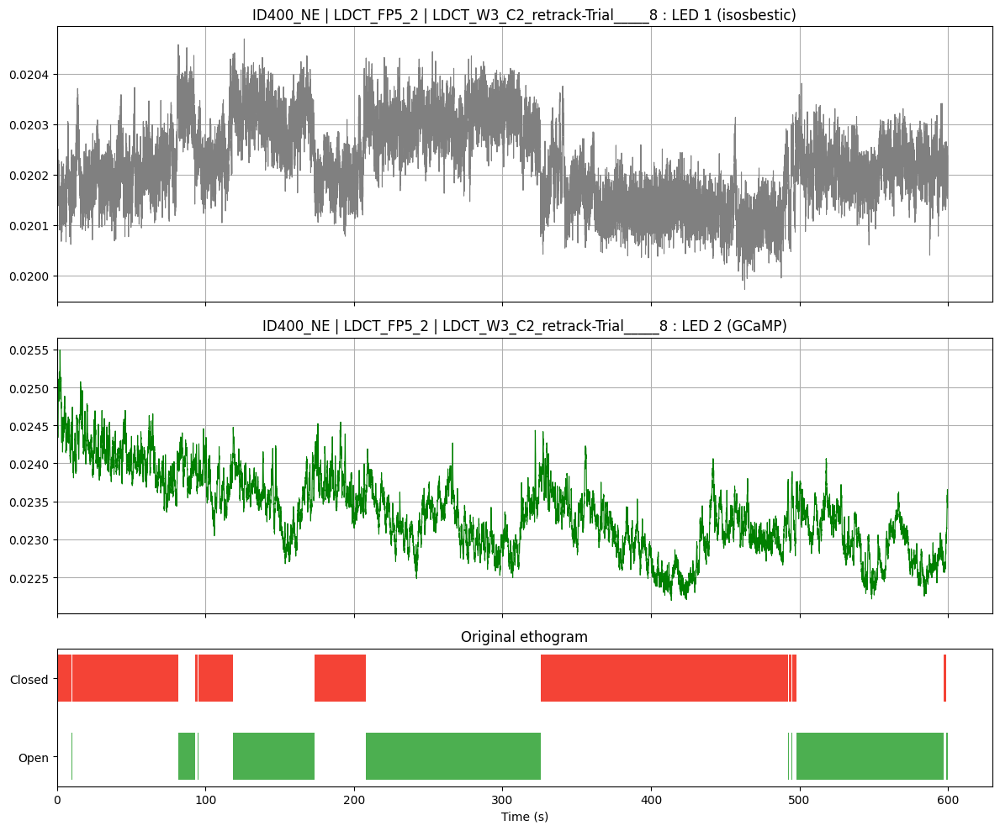

In [5]:
fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True,
                         gridspec_kw={"height_ratios": [2, 2, 1]})


def zone_color(beh):
    if beh.lower() == "open":
        return "#4CAF50"     # greenish for open
    elif beh.lower() == "closed":
        return "#F44336"     # reddish for closed
    else:
        return "gray"        # fallback


# --- FP traces ---
chan = "G0" if "G0" in fp_trim.columns else next(
    c for c in fp_trim.columns
    if pd.api.types.is_numeric_dtype(fp_trim[c])
    and c not in {"LedState","SystemTimestamp","Time_video","Timestamp"}
)

# LED 1
fp1 = fp_trim[fp_trim["LedState"] == 1]
axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
axes[0].grid(True)

# LED 2
fp2 = fp_trim[fp_trim["LedState"] == 2]
axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
axes[1].grid(True)


# --- Original ethogram ---
beh_cols_orig = timeline["Behavior"].unique()

for i, beh in enumerate(beh_cols_orig):
    color = zone_color(beh)     # <--- HERE
    subset = timeline[timeline["Behavior"] == beh]

    for _, row in subset.iterrows():
        axes[2].barh(
            i,
            row["Duration_s"],
            left=row["Start_time_s"],
            height=0.6,
            color=color
        )

axes[2].set_yticks(range(len(beh_cols_orig)))
axes[2].set_yticklabels(beh_cols_orig)
axes[2].invert_yaxis()
axes[2].set_xlabel("Time (s)")
axes[2].set_title("Original ethogram")



plt.tight_layout()
plt.show()


In [6]:
timeline_filter = timeline
timeline_filter # not needed but just doign renaming to be in line with EPM, where we did not want to include overall arena time in the processing, but since that is all we have here, it should be included - but we might need to have 1 for arena time, but also a 1 for dark chamber time

,Behavior,Start_time_s,End_time_s,Duration_s
0,Closed,0.000,9.863,9.863
1,Open,9.863,9.963,0.100
2,Closed,9.963,81.404,71.441
3,Open,81.404,92.848,11.444
4,Closed,92.848,94.788,1.940
5,Open,94.788,95.049,0.261
6,Closed,95.049,118.396,23.347
7,Open,118.396,173.232,54.836
8,Closed,173.232,208.122,34.890
9,Open,208.122,325.878,117.756


In [7]:
def smoothing_kernel(data, grainularity = 0.1, kernel_size = 5):
    """
    Smooths timeline data using a kernel.

    Args:
        data (pd.DataFrame): Timeline data.
        grainularity (float): The grainularity that the timeline data should be split up with (seconds).
        kernel_size (int): The number of 'frames' (defined by the grainularity) the kernel looks ahead 
        and behind when determining the new lable.

    Returns:
        pd.DataFrame: The timeline data reassembled with the new labels in the column 'kernel_label'.
    """
    timeline_exploded = pd.DataFrame({'timestamp' : [], 'label' : []})

    #def explode_timeline(timeline, grainularity):
    for _, row in data.iterrows():
        # timestamps = np.arange(row['Start_time_s'], row['End_time_s'], grainularity)
        timestamps = np.arange(row['Start_time_s'], row['End_time_s'] + grainularity, grainularity)

        labels = row['Behavior'] #* len(timestamps)

        timeline_exploded = pd.concat([timeline_exploded, 
                                       pd.DataFrame({'timestamp' : timestamps, 'label' : labels})])

    timeline_exploded = timeline_exploded.reset_index()

    kernel_content = []

    def most_common(lst):
        return max(set(lst), key=lst.count)

    new_labels = []

    for i, row in timeline_exploded.iterrows():
        if i < kernel_size:
            kernel_content = timeline_exploded[ : i + kernel_size]['label']

        elif i + kernel_size > len(timeline_exploded):
            kernel_content = timeline_exploded[i - (kernel_size - 1) : ]['label']

        else:
            kernel_content = timeline_exploded[i - (kernel_size - 1) : i + kernel_size]['label']
        
        new_labels.append(most_common(kernel_content.to_list()))

    timeline_exploded['kernel_label'] = new_labels

    current_label = ''

    timeline_kernel_labels = pd.DataFrame()

    # After your existing loop that builds timeline_kernel_labels
    for i, row in timeline_exploded.iterrows():
        if current_label == row['kernel_label']:
            pass
        elif current_label == '':
            current_label = row['kernel_label']
            Start_time_s = row['timestamp']
        elif current_label != row['kernel_label']:
            timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                                pd.DataFrame({
                                                    'Behavior' : [current_label],
                                                    'Start_time_s' : [Start_time_s],
                                                    'End_time_s' : row['timestamp'],
                                                    'Duration_s' : row['timestamp'] - Start_time_s
                                                })])
            Start_time_s = row['timestamp']
            current_label = row['kernel_label']

    # --- Append the final segment ---
    if current_label != '':
        timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                            pd.DataFrame({
                                                'Behavior': [current_label],
                                                'Start_time_s': [Start_time_s],
                                                'End_time_s': [timeline_exploded['timestamp'].iloc[-1]],
                                                'Duration_s': [timeline_exploded['timestamp'].iloc[-1] - Start_time_s]
                                            })])
   # code for removing anything shorter than 1 s
    # --- Append the final segment ---
    if current_label != '':
        timeline_kernel_labels = pd.concat([timeline_kernel_labels,
                                            pd.DataFrame({
                                                'Behavior': [current_label],
                                                'Start_time_s': [Start_time_s],
                                                'End_time_s': [timeline_exploded['timestamp'].iloc[-1]],
                                                'Duration_s': [timeline_exploded['timestamp'].iloc[-1] - Start_time_s]
                                            })])

    # --- FILTER: Remove segments shorter than 1 second ---
    timeline_kernel_labels = timeline_kernel_labels[timeline_kernel_labels['Duration_s'] >= 1.0].reset_index(drop=True)



    return timeline_kernel_labels

timeline_filter = timeline[timeline['Behavior']  != 'In zone(Arena / Nose-point)'].sort_values('Start_time_s')
timeline_filter
timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity = 0.1, kernel_size = 50) #when granulairty is 0.1, it says every frame represents 0.1 second. the smaller granulairty, the less the end pieces weigh in the decision to what behaviour is being conducted




In [8]:
timeline_kernel_labels

,Behavior,Start_time_s,End_time_s,Duration_s
0,Closed,0.000,81.404,81.404
1,Open,81.404,93.248,11.844
2,Closed,93.248,118.396,25.148
3,Open,118.396,173.232,54.836
4,Closed,173.232,208.122,34.890
5,Open,208.122,325.878,117.756
6,Closed,325.878,496.309,170.431
7,Open,496.309,600.040,103.731
8,Open,496.309,600.040,103.731


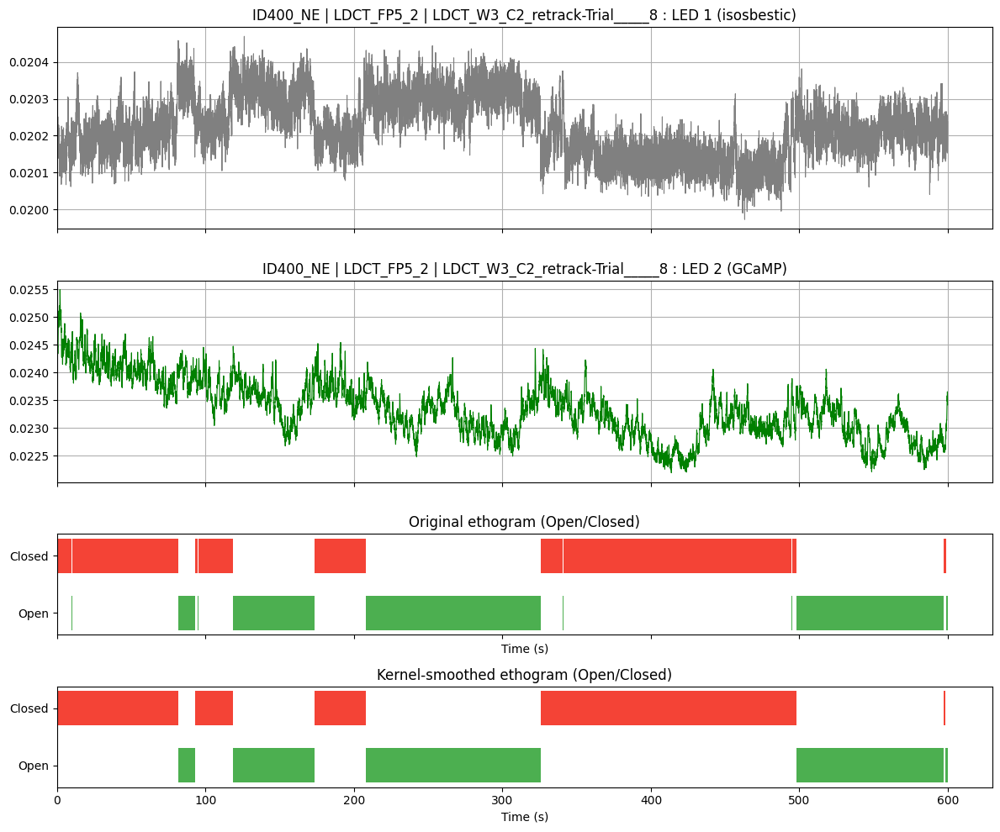

In [9]:
fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True,
                         gridspec_kw={"height_ratios": [2, 2, 1, 1]})

# --- Helper function for zone colors ---
def zone_color(beh):
    if beh.lower() == "open":
        return "#4CAF50"  # greenish for open
    elif beh.lower() == "closed":
        return "#F44336"  # reddish for closed
    else:
        return "gray"     # fallback

# --- FP traces ---
chan = "G0" if "G0" in fp_trim.columns else next(
    c for c in fp_trim.columns
    if pd.api.types.is_numeric_dtype(fp_trim[c])
    and c not in {"LedState","SystemTimestamp","Time_video","Timestamp"}
)

# LED 1
fp1 = fp_trim[fp_trim["LedState"] == 1]
axes[0].plot(fp1["Time_video"], fp1[chan], linewidth=0.8, color="gray")
axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
axes[0].grid(True)

# LED 2
fp2 = fp_trim[fp_trim["LedState"] == 2]
axes[1].plot(fp2["Time_video"], fp2[chan], linewidth=0.8, color="green")
axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
axes[1].grid(True)

# --- Original ethogram ---
beh_cols_orig = timeline["Behavior"].unique()
for i, beh in enumerate(beh_cols_orig):
    color = zone_color(beh)
    subset = timeline[timeline["Behavior"] == beh]
    for _, row in subset.iterrows():
        axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

axes[2].set_yticks(range(len(beh_cols_orig)))
axes[2].set_yticklabels(beh_cols_orig)
axes[2].invert_yaxis()
axes[2].set_xlabel("Time (s)")
axes[2].set_title("Original ethogram (Open/Closed)")

# --- Kernel-smoothed ethogram ---
# Make sure timeline_filter is correctly set
timeline_filter = timeline.copy()  # include all segments
timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)

beh_cols_clean = timeline_kernel_labels["Behavior"].unique()
for i, beh in enumerate(beh_cols_clean):
    color = zone_color(beh)
    subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
    for _, row in subset.iterrows():
        axes[3].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

axes[3].set_yticks(range(len(beh_cols_clean)))
axes[3].set_yticklabels(beh_cols_clean)
axes[3].invert_yaxis()
axes[3].set_xlabel("Time (s)")
axes[3].set_title("Kernel-smoothed ethogram (Open/Closed)")

plt.tight_layout()
plt.show()


In [10]:
# sanity check - number of entries into different zones

# --- Count occurrences for each behavior in this kernel-smoothed ethogram ---
print("\nKernel-smoothed ethogram occurrences (as plotted):")

for beh in beh_cols_clean:
    subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
    n_occurrences = len(subset)
    print(f"{beh}: {n_occurrences} instance(s)")

    # Optional: print detailed start/end/duration
    for idx, row in subset.iterrows():
        print(f"  Start: {row['Start_time_s']:.3f}, "
              f"End: {row['End_time_s']:.3f}, "
              f"Duration: {row['Duration_s']:.3f}")



Kernel-smoothed ethogram occurrences (as plotted):
Closed: 5 instance(s)
  Start: 0.000, End: 81.404, Duration: 81.404
  Start: 92.848, End: 118.396, Duration: 25.548
  Start: 173.232, End: 208.122, Duration: 34.890
  Start: 325.878, End: 497.829, Duration: 171.951
  Start: 596.899, End: 598.079, Duration: 1.180
Open: 6 instance(s)
  Start: 81.404, End: 92.848, Duration: 11.444
  Start: 118.396, End: 173.232, Duration: 54.836
  Start: 208.122, End: 325.878, Duration: 117.756
  Start: 497.829, End: 596.899, Duration: 99.070
  Start: 598.079, End: 600.040, Duration: 1.961
  Start: 598.079, End: 600.040, Duration: 1.961


In [11]:
print(timeline_kernel_labels) # check around 455, there are smoe very short instances

   Behavior  Start_time_s  End_time_s  Duration_s
0    Closed         0.000      81.404      81.404
1      Open        81.404      92.848      11.444
2    Closed        92.848     118.396      25.548
3      Open       118.396     173.232      54.836
4    Closed       173.232     208.122      34.890
5      Open       208.122     325.878     117.756
6    Closed       325.878     497.829     171.951
7      Open       497.829     596.899      99.070
8    Closed       596.899     598.079       1.180
9      Open       598.079     600.040       1.961
10     Open       598.079     600.040       1.961


# generate the above plot for all trials

first generate the open and closed zones for all the data

In [12]:
def ethogram_to_open_closed(
    timeline_df,
    col=None,  # keeps backward compatibility
    recording_start=None,
    recording_end=None,
    fp_time_vector=None
):
    """
    Converts open-zone segments into a full Open/Closed ethogram
    that fully covers the FP time vector.

    Args:
        timeline_df (pd.DataFrame): Output from _ethogram_segments,
                                    must have 'Start_time_s' and 'End_time_s'.
        col (str, optional): Original behavior column (ignored here, for compatibility).
        recording_start (float, optional): Start time of recording. Defaults to fp_time_vector.min().
        recording_end (float, optional): End time of recording. Defaults to fp_time_vector.max().
        fp_time_vector (np.array or pd.Series, optional): Time vector of FP trace for alignment.

    Returns:
        pd.DataFrame: Timeline with columns ['Behavior', 'Start_time_s', 'End_time_s', 'Duration_s'].
    """

    # Handle empty timeline
    if timeline_df.empty:
        if fp_time_vector is not None:
            start = float(fp_time_vector.min())
            end   = float(fp_time_vector.max())
        else:
            start = 0.0
            end   = 1.0  # default dummy
        return pd.DataFrame({
            "Behavior": ["Closed"],
            "Start_time_s": [start],
            "End_time_s": [end],
            "Duration_s": [end - start]
        })

    # Sort segments
    timeline_df = timeline_df.sort_values("Start_time_s").reset_index(drop=True)

    # Determine recording start/end
    if fp_time_vector is not None:
        recording_start = float(fp_time_vector.min())
        recording_end   = float(fp_time_vector.max())
    else:
        if recording_start is None or recording_end is None:
            recording_start = float(timeline_df["Start_time_s"].min())
            recording_end   = float(timeline_df["End_time_s"].max())

    timeline = []
    last_end = recording_start

    for _, row in timeline_df.iterrows():
        start = float(row["Start_time_s"])
        end   = float(row["End_time_s"])

        # Closed gap before this open segment
        if start > last_end:
            timeline.append({
                "Behavior": "Closed",
                "Start_time_s": last_end,
                "End_time_s": start,
                "Duration_s": start - last_end
            })

        # Open segment
        timeline.append({
            "Behavior": "Open",
            "Start_time_s": start,
            "End_time_s": end,
            "Duration_s": end - start
        })

        last_end = end

    # Final closed segment to cover the rest of recording
    if last_end < recording_end:
        timeline.append({
            "Behavior": "Closed",
            "Start_time_s": last_end,
            "End_time_s": recording_end,
            "Duration_s": recording_end - last_end
        })

    df = pd.DataFrame(timeline)

    # Normalize behavior strings for safety
    df["Behavior"] = df["Behavior"].astype(str).str.strip().str.title()

    return df.sort_values("Start_time_s").reset_index(drop=True)

In [13]:
for trial_key, trial_data in fp_traces.items():
    try:
        iso_df = trial_data["iso"]
        gcamp_df = trial_data["gcamp"]

        # --- Compute recording duration ---
        recording_end = max(
            iso_df["Time_video"].max(),
            gcamp_df["Time_video"].max()
        )

        # --- Convert to full Open/Closed ethogram ---
        segs = ethogram_to_open_closed(
            trial_data["timeline"],
            col="In Zone",          # harmless now (kept for compatibility)
            recording_start=0,
            recording_end=recording_end
        )

        trial_data["timeline_open_closed"] = segs
        trial_data["beh_cols_open_closed"] = segs["Behavior"].unique()

    except Exception as e:
        print(f"[WARN] Could not preprocess trial {trial_key}: {e}")

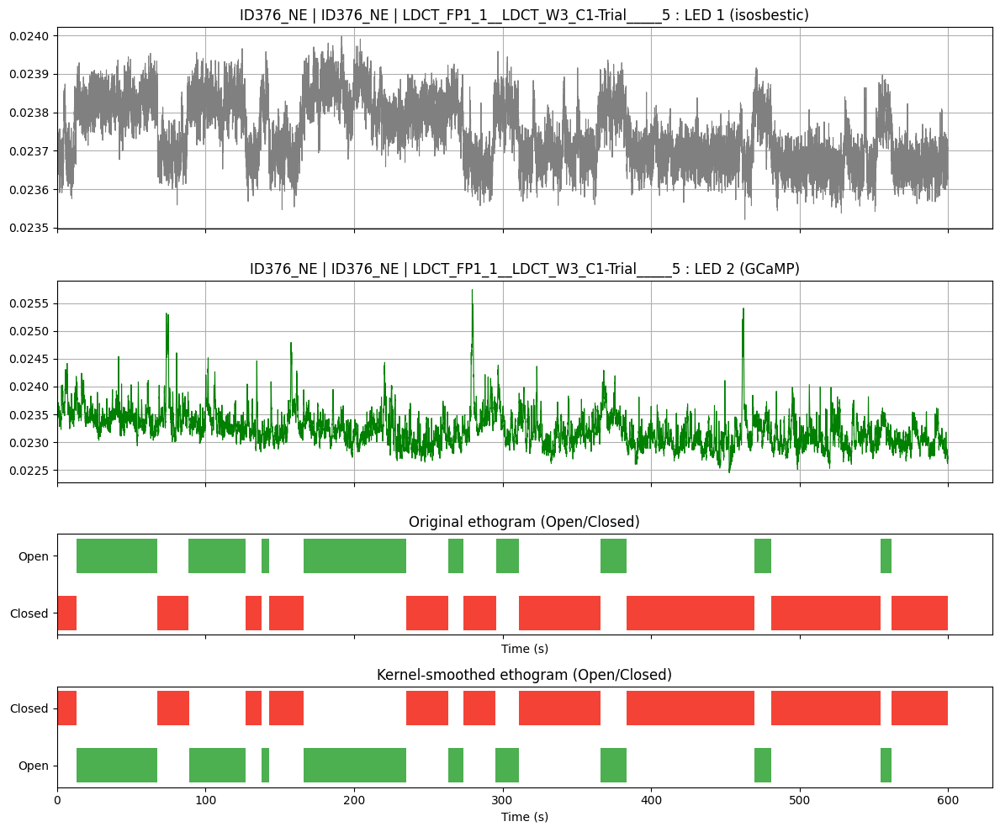

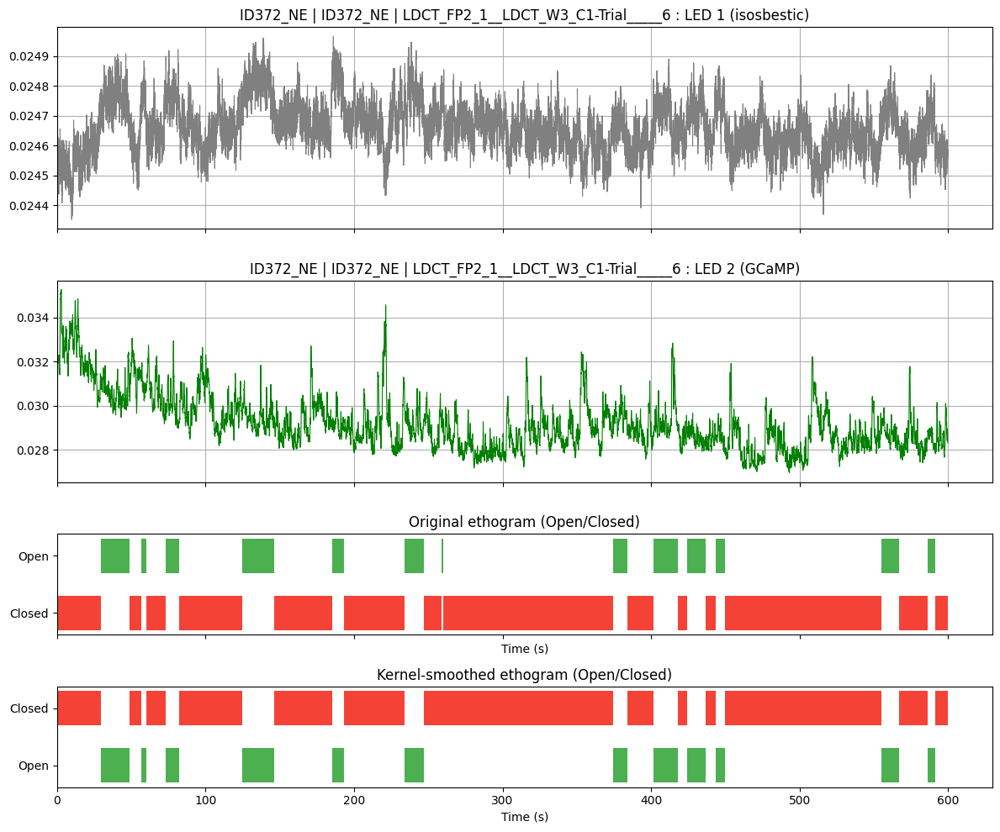

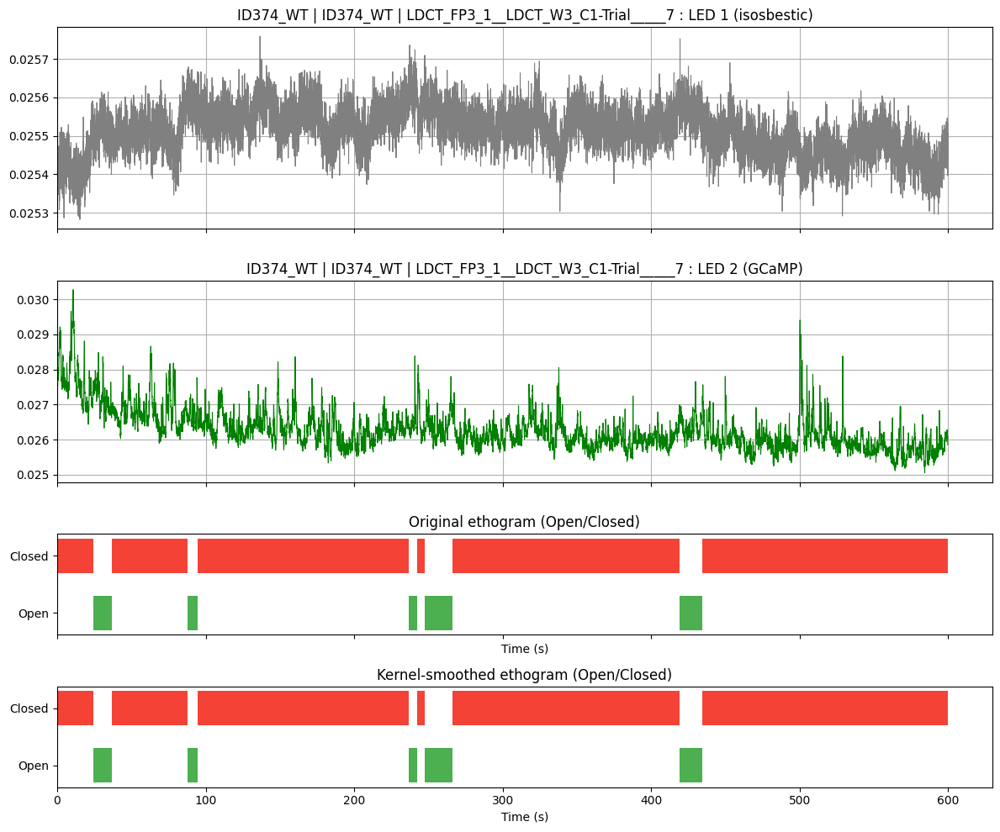

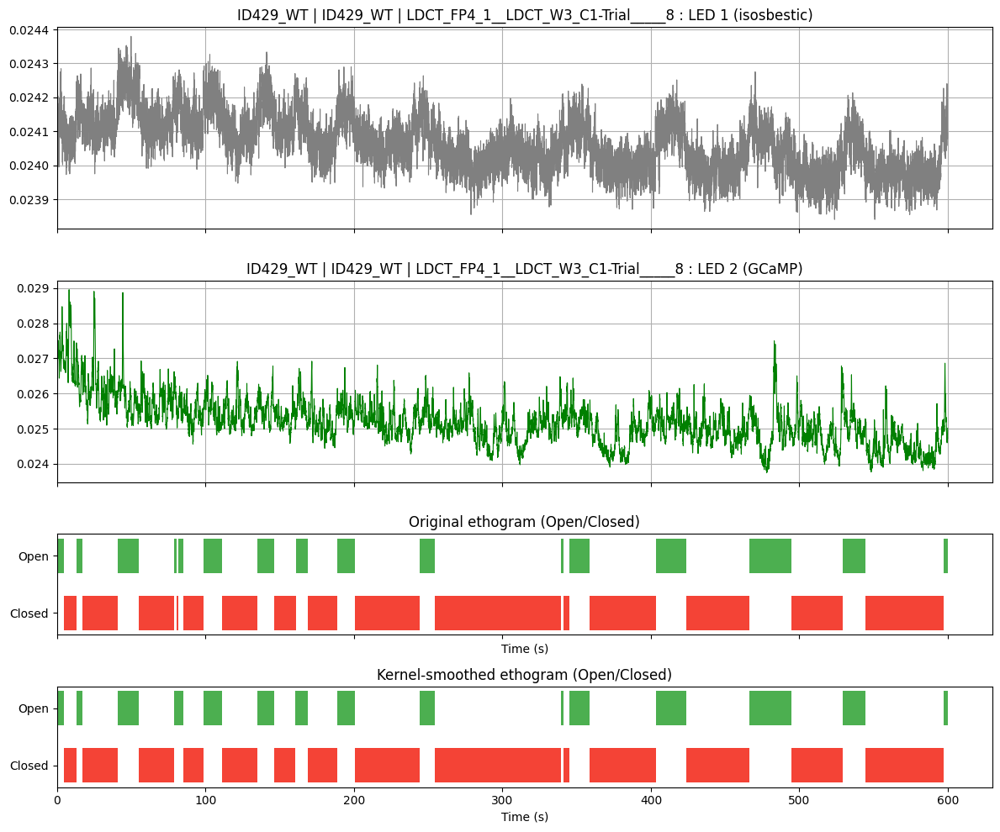

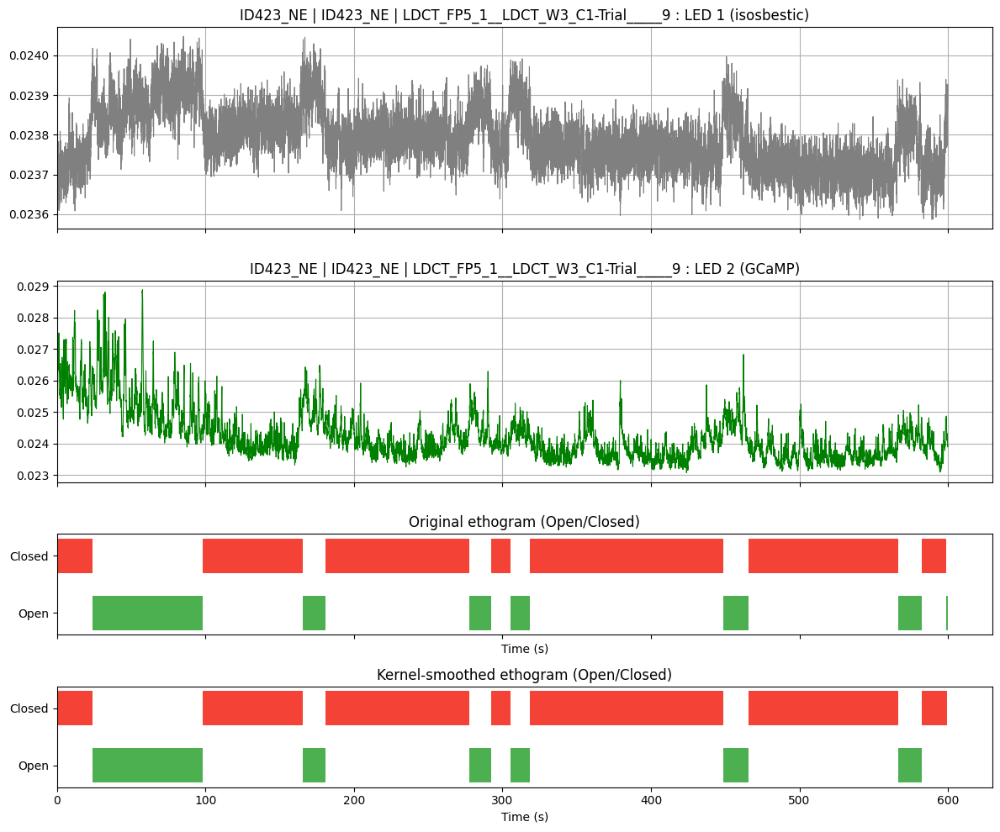

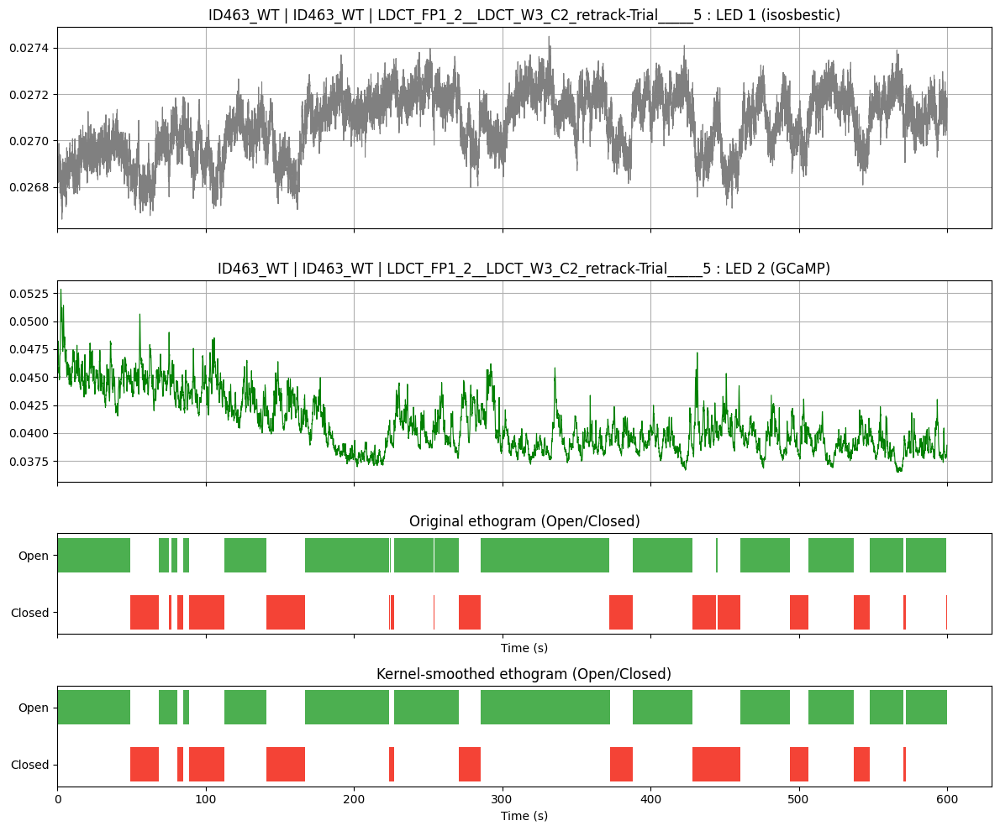

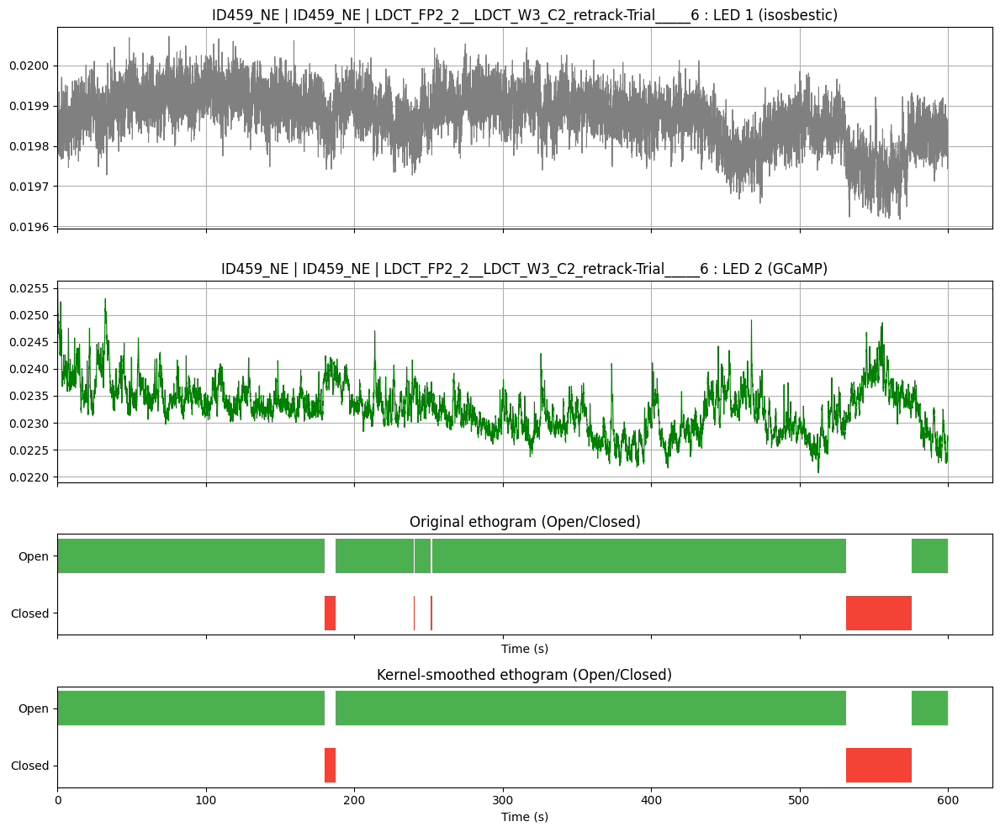

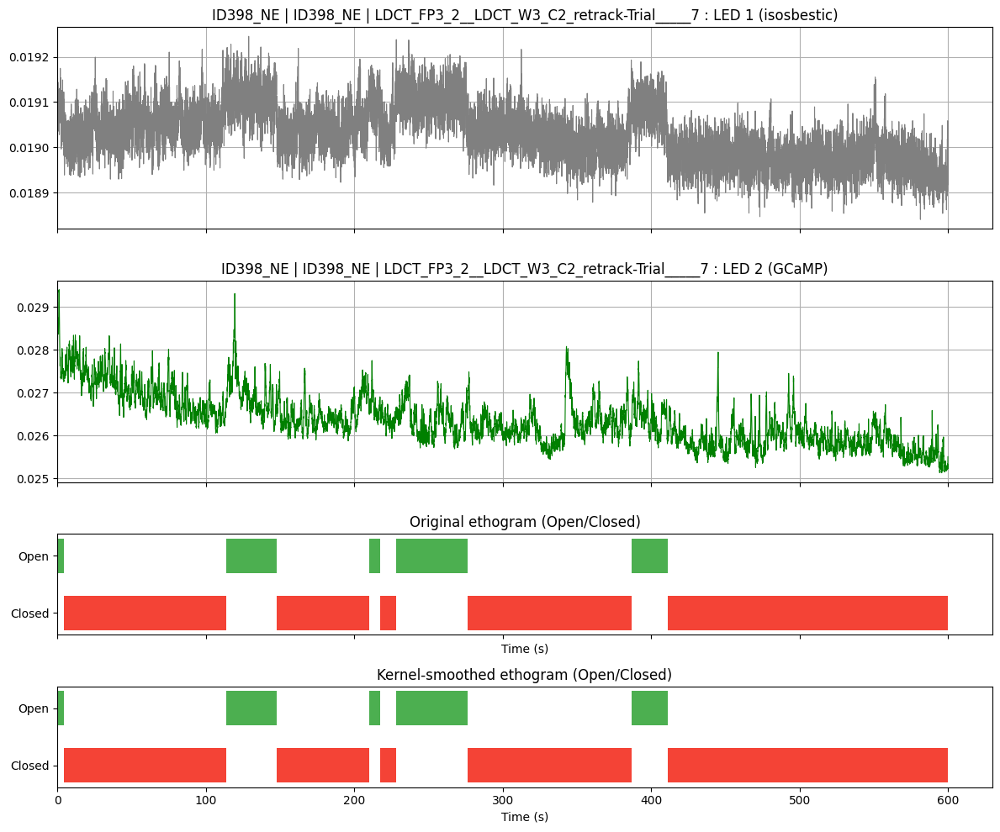

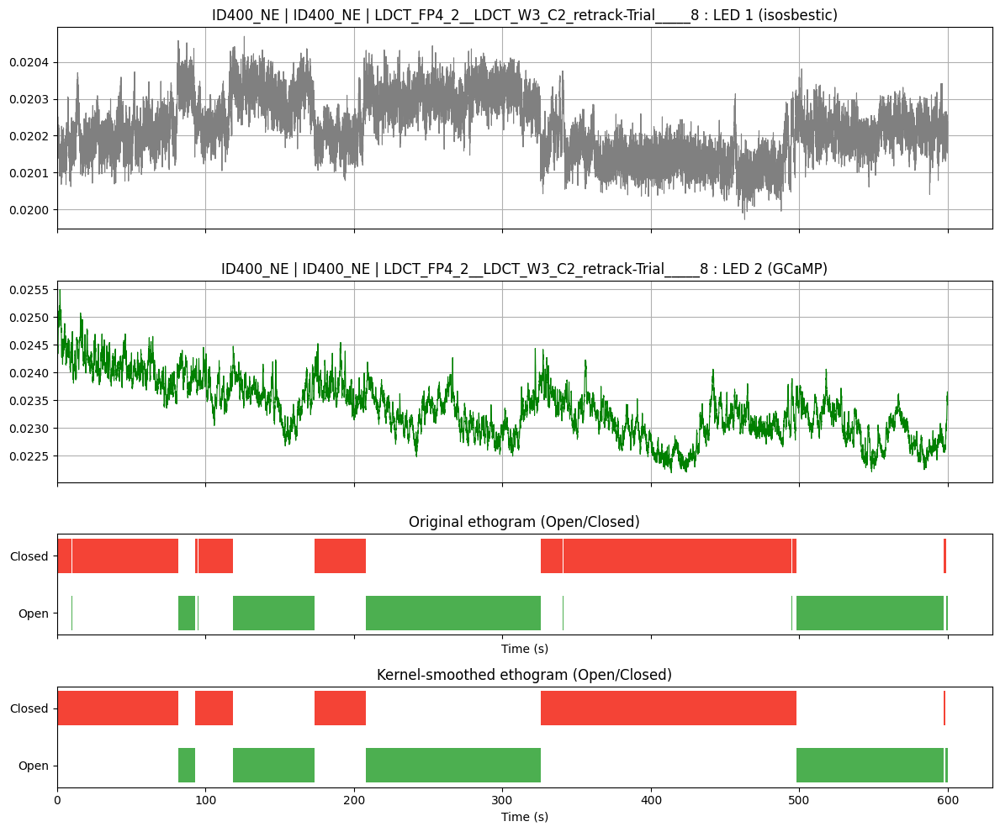

In [14]:
# ==========================================================
# Apply smoothing_kernel and plot kernel-smoothed ethograms for all trials
# ==========================================================

for trial_key, trial_data in fp_traces.items():
    try:
        # Extract FP traces and timeline
        iso_df = trial_data["iso"]
        gcamp_df = trial_data["gcamp"]
        #timeline = trial_data["timeline"]
        timeline = trial_data["timeline_open_closed"]
        mouse_label = f"ID{trial_data['mouse_id']}" + (f"_{trial_data['genotype']}" if trial_data['genotype'] else "")
        fp_id = trial_key.split("__")[1]
        trial_stub = "__".join(trial_key.split("__")[2:])

        # --- Filter timeline (optional: exclude arena if needed) ---
        timeline_filter = timeline.copy()  # include all segments

        # --- Apply smoothing kernel ---
        timeline_kernel_labels = smoothing_kernel(timeline_filter, grainularity=0.1, kernel_size=20)
        trial_data["timeline_kernel"] = timeline_kernel_labels  # store for later

        # --- Create figure ---
        fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True,
                                 gridspec_kw={"height_ratios": [2, 2, 1, 1]})

        # --- Helper function for zone colors ---
        def zone_color(beh):
            if beh.lower() == "open":
                return "#4CAF50"  # greenish
            elif beh.lower() == "closed":
                return "#F44336"  # reddish
            else:
                return "gray"     # fallback

        # --- FP traces ---
        iso_col = [c for c in iso_df.columns if c != "Time_video"][0]
        gcamp_col = [c for c in gcamp_df.columns if c != "Time_video"][0]

        axes[0].plot(iso_df["Time_video"], iso_df[iso_col], linewidth=0.8, color="gray")
        axes[0].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 1 (isosbestic)")
        axes[0].grid(True)

        axes[1].plot(gcamp_df["Time_video"], gcamp_df[gcamp_col], linewidth=0.8, color="green")
        axes[1].set_title(f"{mouse_label} | {fp_id} | {trial_stub} : LED 2 (GCaMP)")
        axes[1].grid(True)

        # --- Original ethogram ---
        beh_cols_orig = timeline["Behavior"].unique()
        for i, beh in enumerate(beh_cols_orig):
            color = zone_color(beh)
            subset = timeline[timeline["Behavior"] == beh]
            for _, row in subset.iterrows():
                axes[2].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

        axes[2].set_yticks(range(len(beh_cols_orig)))
        axes[2].set_yticklabels(beh_cols_orig)
        axes[2].invert_yaxis()
        axes[2].set_xlabel("Time (s)")
        axes[2].set_title("Original ethogram (Open/Closed)")

        # --- Kernel-smoothed ethogram ---
        beh_cols_clean = timeline_kernel_labels["Behavior"].unique()
        for i, beh in enumerate(beh_cols_clean):
            color = zone_color(beh)
            subset = timeline_kernel_labels[timeline_kernel_labels["Behavior"] == beh]
            for _, row in subset.iterrows():
                axes[3].barh(i, row["Duration_s"], left=row["Start_time_s"], height=0.6, color=color)

        axes[3].set_yticks(range(len(beh_cols_clean)))
        axes[3].set_yticklabels(beh_cols_clean)
        axes[3].invert_yaxis()
        axes[3].set_xlabel("Time (s)")
        axes[3].set_title("Kernel-smoothed ethogram (Open/Closed)")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"[WARN] Could not plot trial {trial_key}: {e}")


In [15]:
for trial_key, trial_data in fp_traces.items():
    print(f"\nTrial: {trial_key}")
    if "timeline_kernel" not in trial_data:
        print("  No kernel-smoothed ethogram found.")
        continue

    tk = trial_data["timeline_kernel"]

    # Count number of separate occurrences for each behavior
    counts = tk["Behavior"].value_counts()
    for beh, n in counts.items():
        print(f"  {beh}: {n} instance(s)")



Trial: W3__ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5
  Closed: 11 instance(s)
  Open: 9 instance(s)

Trial: W3__ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6
  Closed: 14 instance(s)
  Open: 12 instance(s)

Trial: W3__ID374_WT__LDCT_FP3_1__LDCT_W3_C1-Trial_____7
  Closed: 7 instance(s)
  Open: 5 instance(s)

Trial: W3__ID429_WT__LDCT_FP4_1__LDCT_W3_C1-Trial_____8
  Open: 16 instance(s)
  Closed: 14 instance(s)

Trial: W3__ID423_NE__LDCT_FP5_1__LDCT_W3_C1-Trial_____9
  Closed: 7 instance(s)
  Open: 6 instance(s)

Trial: W3__ID463_WT__LDCT_FP1_2__LDCT_W3_C2_retrack-Trial_____5
  Open: 13 instance(s)
  Closed: 11 instance(s)

Trial: W3__ID459_NE__LDCT_FP2_2__LDCT_W3_C2_retrack-Trial_____6
  Open: 4 instance(s)
  Closed: 2 instance(s)

Trial: W3__ID398_NE__LDCT_FP3_2__LDCT_W3_C2_retrack-Trial_____7
  Closed: 6 instance(s)
  Open: 5 instance(s)

Trial: W3__ID400_NE__LDCT_FP4_2__LDCT_W3_C2_retrack-Trial_____8
  Open: 6 instance(s)
  Closed: 5 instance(s)


In [16]:
# Get the last trial key
last_key = list(fp_traces.keys())[0]
trial_data = fp_traces[last_key]

print(f"Full kernel-smoothed timeline for trial: {last_key}\n")

if "timeline_kernel" in trial_data:
    tk = trial_data["timeline_kernel"]
    # Print all columns
    print(tk.to_string(index=False))
else:
    print("No kernel-smoothed ethogram found for this trial.")


Full kernel-smoothed timeline for trial: W3__ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5

Behavior  Start_time_s  End_time_s  Duration_s
  Closed         0.000      13.164      13.164
    Open        13.164      67.700      54.536
  Closed        67.700      88.827      21.127
    Open        88.827     126.998      38.171
  Closed       126.998     137.781      10.783
    Open       137.781     142.663       4.882
  Closed       142.663     166.130      23.467
    Open       166.130     235.010      68.880
  Closed       235.010     263.199      28.189
    Open       263.199     273.522      10.323
  Closed       273.522     295.188      21.666
    Open       295.188     311.013      15.825
  Closed       311.013     365.950      54.937
    Open       365.950     383.735      17.785
  Closed       383.735     469.601      85.866
    Open       469.601     481.224      11.623
  Closed       481.224     554.586      73.362
    Open       554.586     561.969       7.383
  Closed       5

# Walton Pipeline

# code for manually subtracting iso from gcamp by aligning iso and gcamp to occur at same timepoints (a bit artificial, they do not occur at exactly the same timepoint)

In [17]:
# ==========================================================
# Coregister ISO and GCaMP traces for all timepoints
# ==========================================================

import pandas as pd

def coregister_iso_gcamp(trial_traces: dict) -> pd.DataFrame:
    """
    trial_traces: dict with keys 'iso' and 'gcamp', each a DataFrame like:
        iso:   ['Time_video', 'G0_iso415']
        gcamp:['Time_video', 'G0_gcamp470']

    Returns one DataFrame with:
        Time_video  (from the channel that starts first)
        iso415
        gcamp470
    """
    iso = trial_traces["iso"].copy()
    gcamp = trial_traces["gcamp"].copy()

    # Get signal column names
    iso_col   = [c for c in iso.columns   if c != "Time_video"][0]
    gcamp_col = [c for c in gcamp.columns if c != "Time_video"][0]

    # Trim to common length just in case
    n = min(len(iso), len(gcamp))
    iso   = iso.iloc[:n].reset_index(drop=True)
    gcamp = gcamp.iloc[:n].reset_index(drop=True)

    # Decide which channel is "main" based on starting time
    if gcamp["Time_video"].iloc[0] <= iso["Time_video"].iloc[0]:
        # gcamp starts first → use its time
        time_main = gcamp["Time_video"].values
    else:
        # iso starts first → use its time
        time_main = iso["Time_video"].values

    aligned = pd.DataFrame({
        "Time_video": time_main,
        "iso415": iso[iso_col].values,
        "gcamp470": gcamp[gcamp_col].values,
    })

    return aligned

# -------------------------------------------------
# Apply coregistration to all trials in fp_traces
# -------------------------------------------------

coregistered_traces = {}  # store results per trial

for tp in timepoints:
    # Filter keys for this timepoint
    tp_keys = [k for k in fp_traces.keys() if k.startswith(f"{tp}__")]
    for k in tp_keys:
        try:
            aligned_df = coregister_iso_gcamp(fp_traces[k])
            coregistered_traces[k] = aligned_df
        except Exception as e:
            print(f"[WARN] Could not coregister {k}: {e}")

# Example access:


In [18]:
# Show the first key
first_key = list(coregistered_traces.keys())[1]
print("First trial key:", first_key)

# Show the head of the aligned dataframe
print(coregistered_traces[first_key].head())


First trial key: W3__ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6
   Time_video    iso415  gcamp470
0        0.00  0.024688  0.031964
1        0.04  0.024607  0.031799
2        0.08  0.024647  0.031582
3        0.12  0.024643  0.031456
4        0.16  0.024601  0.031389


# Preprocessing

## Lowpass filtering to reduce noise.
https://github.com/ThomasAkam/photometry_preprocessing/blob/master/.ipynb_checkpoints/Photometry%20data%20preprocessing-checkpoint.ipynb



In [19]:
import os
import numpy as  np
import pylab as plt
from scipy.signal import medfilt, butter, filtfilt
from scipy.stats import linregress
from scipy.optimize import curve_fit, minimize

#set default plot properties
plt.rcParams['figure.figsize'] = [14, 12] # Make default figure size larger.
plt.rcParams['axes.xmargin'] = 0          # Make default margin on x axis zero.
plt.rcParams['axes.labelsize'] = 12     #Set default axes label size 
plt.rcParams['axes.titlesize']=15
plt.rcParams['axes.titleweight']='heavy'
plt.rcParams['ytick.labelsize']= 10
plt.rcParams['xtick.labelsize']= 10
plt.rcParams['legend.fontsize']=12
plt.rcParams['legend.markerscale']=2

# Denoising

We lowpass filter the signals to reduce high frequency noise, using a zero phase filter with a 10Hz cutoff frequency.

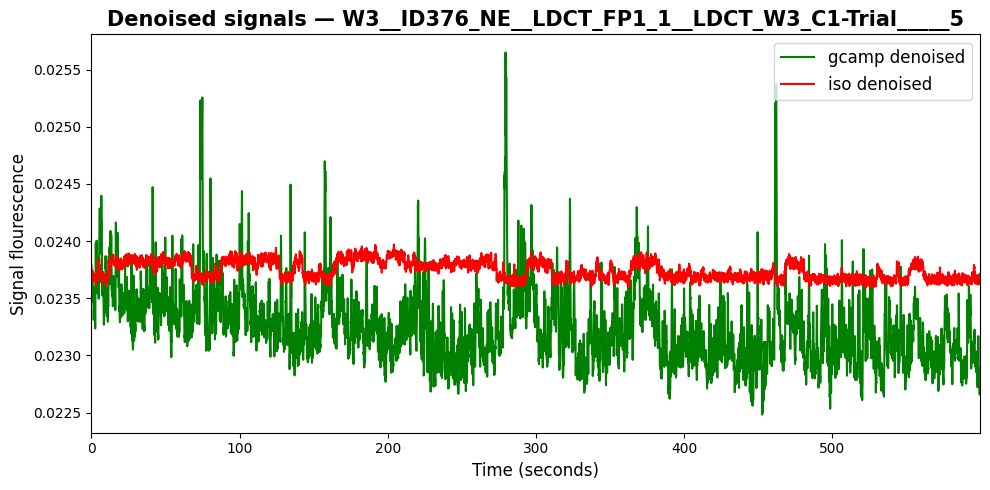

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised'], dtype='object')


In [20]:

from scipy.signal import butter, filtfilt

sampling_rate = 50

# EXACT same filter design
b, a = butter(2, 10, btype='low', fs=sampling_rate)


for key, df in coregistered_traces.items():
    
    # Apply filtering EXACTLY like notebook
    df["gcamp_denoised"] = filtfilt(b, a, df["gcamp470"].values)
    df["iso_denoised"]   = filtfilt(b, a, df["iso415"].values)


trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

fig, ax = plt.subplots(figsize=(10,5))

# Plot both signals on same axis
plot1 = ax.plot(df["Time_video"], df["gcamp_denoised"], 'g', label='gcamp denoised')
plot2 = ax.plot(df["Time_video"], df["iso_denoised"], 'r', label='iso denoised')

ax.set_xlabel('Time (seconds)')
ax.set_ylabel('Signal flourescence')
ax.set_title(f'Denoised signals — {trial_key}')

# Same legend logic
lines = plot1 + plot2
labels = [l.get_label() for l in lines]
ax.legend(lines, labels, loc='upper right')

plt.tight_layout()
plt.show()

#check denoising added to original dataframe:
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

## Photbleaching correction via double exponential fit (like neurophotometrics guide)
One way of removing the influence of bleaching is to fit an exponential decay to the data and subtract this exponential fit from the signal (note, some groups divide the signal by the baseline rather than subtracting the baseline, see Fiber Photometry Primer for more discussion). In practice we find that a double exponential fit is preferable to a single exponential fit because there are typically multiple sources of fluorescence that contribute to the bleaching (e.g. autofluorescence from fiber, autofluorescence from brain tissue, and flurophore fluorescence), which may bleach at different rates, so a single exponential fit can be overly restrictive.

First single trial to try out, then applied to all trials

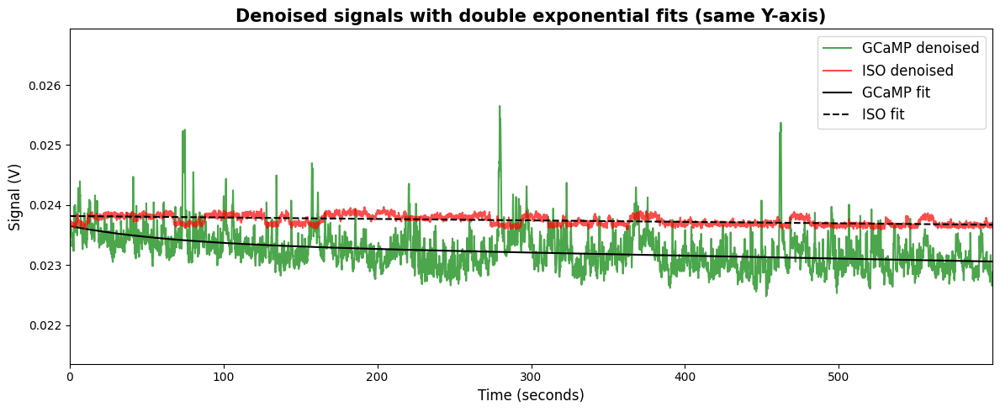

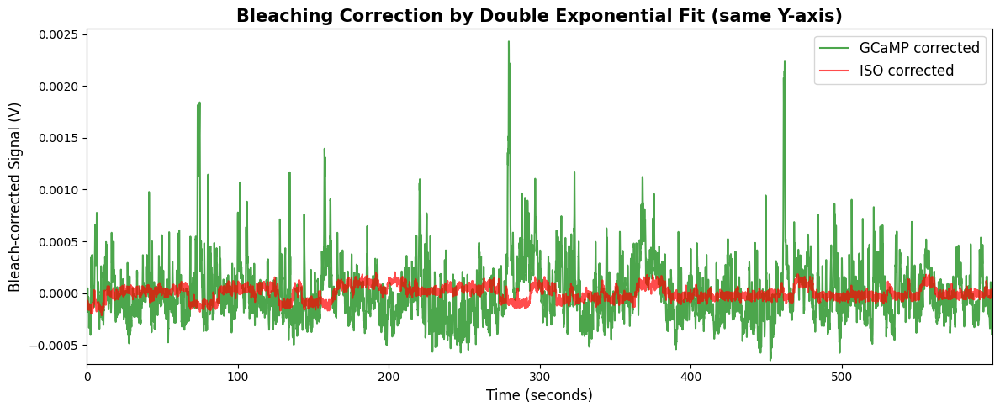

In [21]:
# ==========================================================
# Single trial: double exponential fit + bleach correction
# Both signals on the same Y-axis
# ==========================================================

import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Pick the first trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

time_seconds = df["Time_video"].values

# ----------------------------------------------------------
# Double exponential function
# ----------------------------------------------------------
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    """
    Compute a double exponential function with constant offset.
    Parameters
    ----------
    t           : array_like, time vector in seconds
    const       : amplitude of constant offset
    amp_fast    : amplitude of fast component
    amp_slow    : amplitude of slow component
    tau_slow    : time constant of slow component (s)
    tau_multiplier : time constant of fast component relative to slow
    """
    tau_fast = tau_slow * tau_multiplier
    return const + amp_slow * np.exp(-t / tau_slow) + amp_fast * np.exp(-t / tau_fast)

# ----------------------------------------------------------
# Fit double exponential to GCaMP
# ----------------------------------------------------------
max_sig = np.max(df["gcamp_denoised"])
initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0, 0, 0, 600, 0],
          [max_sig, max_sig, max_sig, 36000, 1])

gcamp_params, _ = curve_fit(double_exponential, time_seconds, df["gcamp_denoised"],
                            p0=initial_params, bounds=bounds, maxfev=1000)
df["gcamp_expfit"] = double_exponential(time_seconds, *gcamp_params)

# ----------------------------------------------------------
# Fit double exponential to ISO
# ----------------------------------------------------------
max_sig = np.max(df["iso_denoised"])
initial_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0, 0, 0, 600, 0],
          [max_sig, max_sig, max_sig, 36000, 1])

iso_params, _ = curve_fit(double_exponential, time_seconds, df["iso_denoised"],
                          p0=initial_params, bounds=bounds, maxfev=1000)
df["iso_expfit"] = double_exponential(time_seconds, *iso_params)

# ----------------------------------------------------------
# Bleach-corrected signals
# ----------------------------------------------------------
df["gcamp_bleach_corrected"] = df["gcamp_denoised"] - df["gcamp_expfit"]
df["iso_bleach_corrected"]   = df["iso_denoised"] - df["iso_expfit"]

# ==========================================================
# Plot 1: Denoised signals with double exponential fits
# Both on the same Y-axis
# ==========================================================
fig, ax1 = plt.subplots(figsize=(12,5))

# GCaMP
plot1 = ax1.plot(time_seconds, df["gcamp_denoised"], 'g', alpha=0.7, label='GCaMP denoised')
plot3 = ax1.plot(time_seconds, df["gcamp_expfit"], 'k', linewidth=1.5, label='GCaMP fit')

# ISO
plot2 = ax1.plot(time_seconds, df["iso_denoised"], 'r', alpha=0.7, label='ISO denoised')
plot4 = ax1.plot(time_seconds, df["iso_expfit"], 'k', linestyle='--', linewidth=1.5, label='ISO fit')

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('Signal (V)')
ax1.set_title('Denoised signals with double exponential fits (same Y-axis)')

# Legend
lines = plot1 + plot2 + plot3 + plot4
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right')

# Dynamic Y-limits based on both signals
ymin = min(df["gcamp_denoised"].min(), df["iso_denoised"].min()) * 0.95
ymax = max(df["gcamp_denoised"].max(), df["iso_denoised"].max()) * 1.05
ax1.set_ylim(ymin, ymax)

plt.tight_layout()
plt.show()

# ==========================================================
# Plot 2: Bleach-corrected (detrended) signals
# Both on the same Y-axis
# ==========================================================
fig, ax1 = plt.subplots(figsize=(12,5))

# GCaMP
plot1 = ax1.plot(time_seconds, df["gcamp_bleach_corrected"], 'g', alpha=0.7, label='GCaMP corrected')

# ISO
plot2 = ax1.plot(time_seconds, df["iso_bleach_corrected"], 'r', alpha=0.7, label='ISO corrected')

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('Bleach-corrected Signal (V)')
ax1.set_title('Bleaching Correction by Double Exponential Fit (same Y-axis)')

# Legend
lines = plot1 + plot2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right')

# Dynamic Y-limits based on both signals
ymin = min(df["gcamp_bleach_corrected"].min(), df["iso_bleach_corrected"].min()) * 1.05
ymax = max(df["gcamp_bleach_corrected"].max(), df["iso_bleach_corrected"].max()) * 1.05
ax1.set_ylim(ymin, ymax)

plt.tight_layout()
plt.show()

Processing W3__ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5


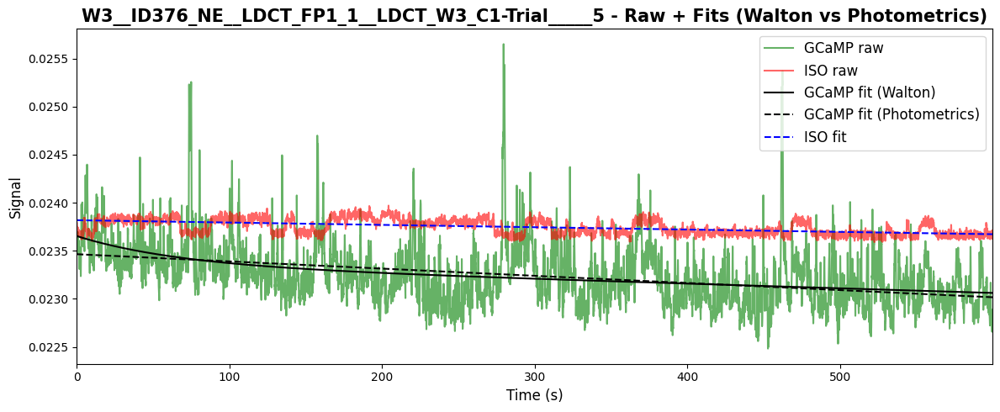

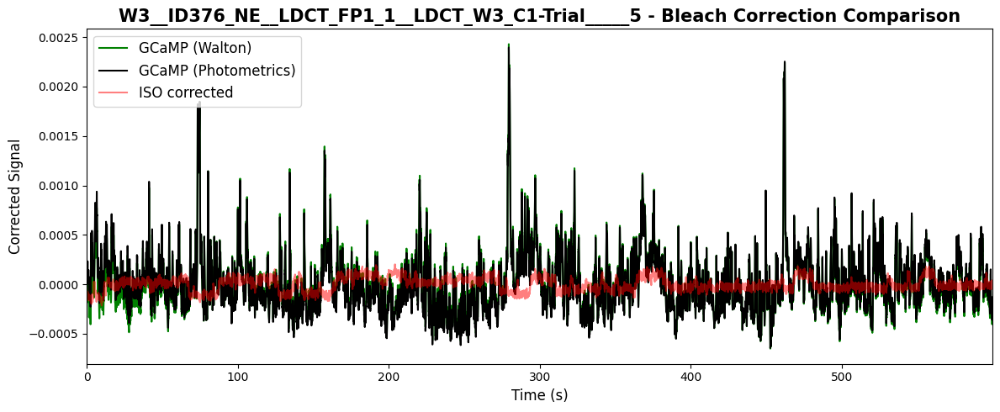

Processing W3__ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6


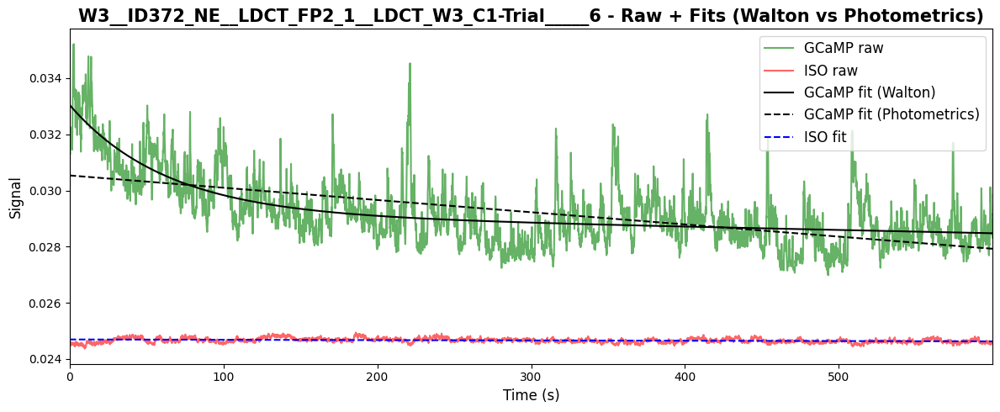

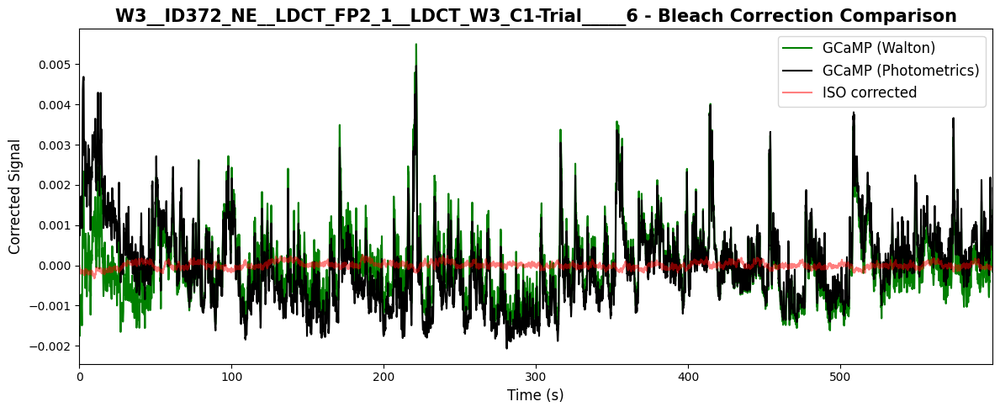

Processing W3__ID374_WT__LDCT_FP3_1__LDCT_W3_C1-Trial_____7


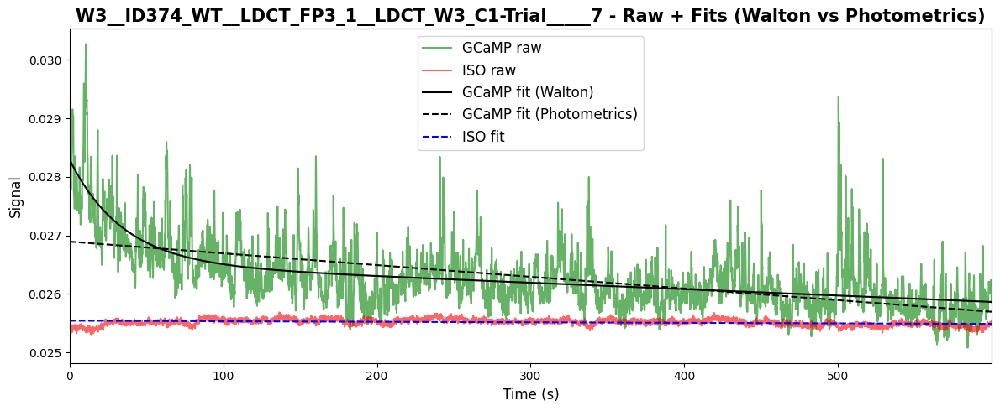

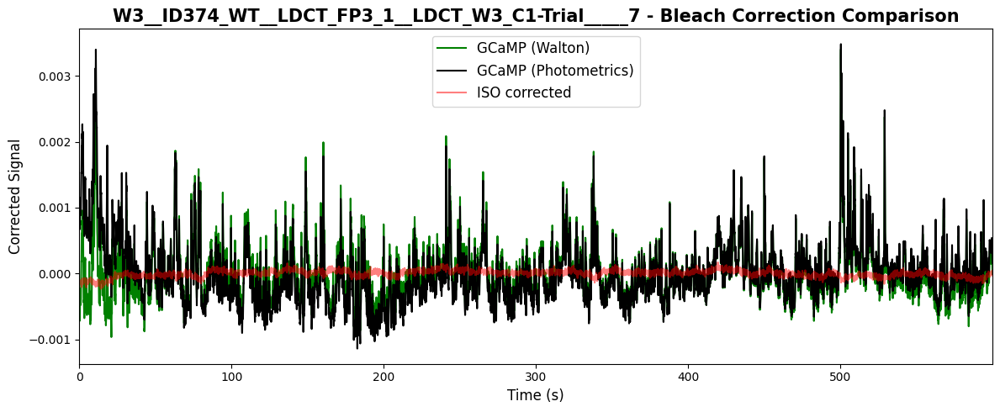

Processing W3__ID429_WT__LDCT_FP4_1__LDCT_W3_C1-Trial_____8


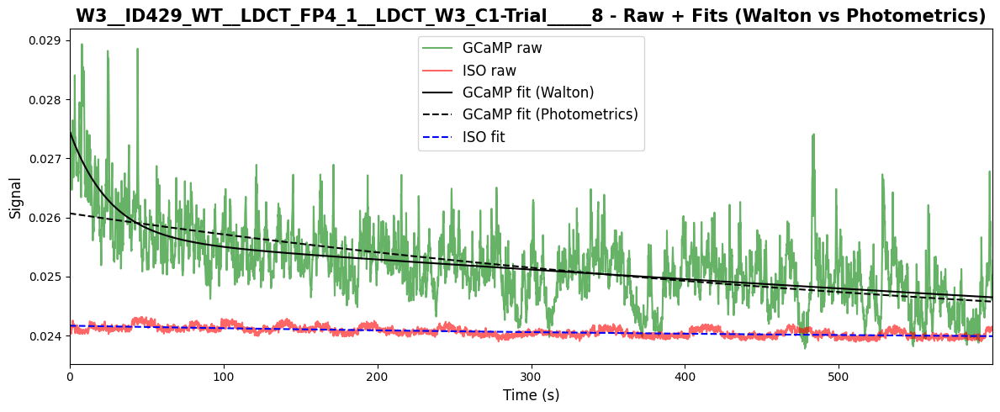

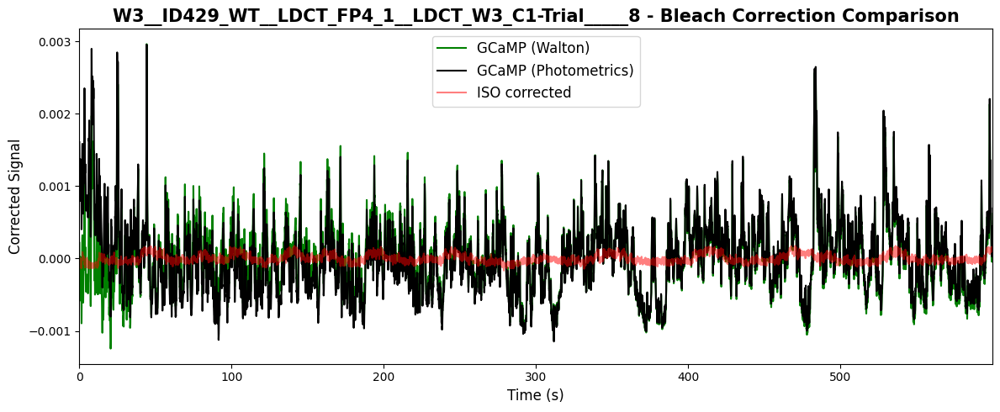

Processing W3__ID423_NE__LDCT_FP5_1__LDCT_W3_C1-Trial_____9


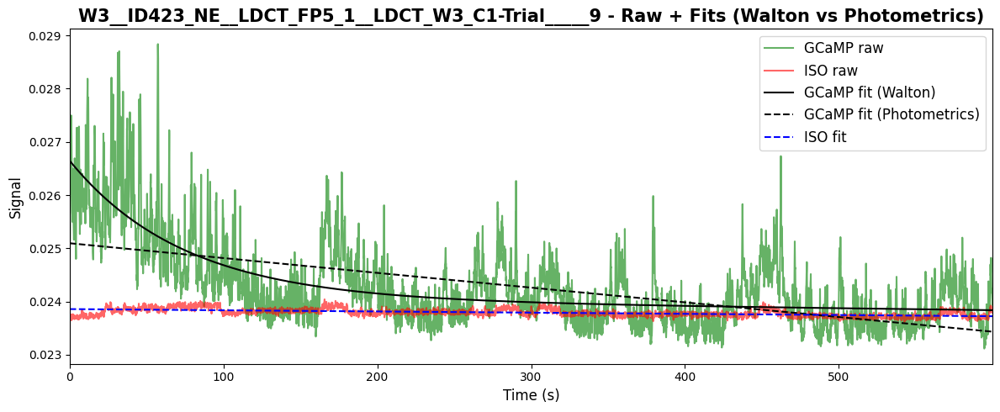

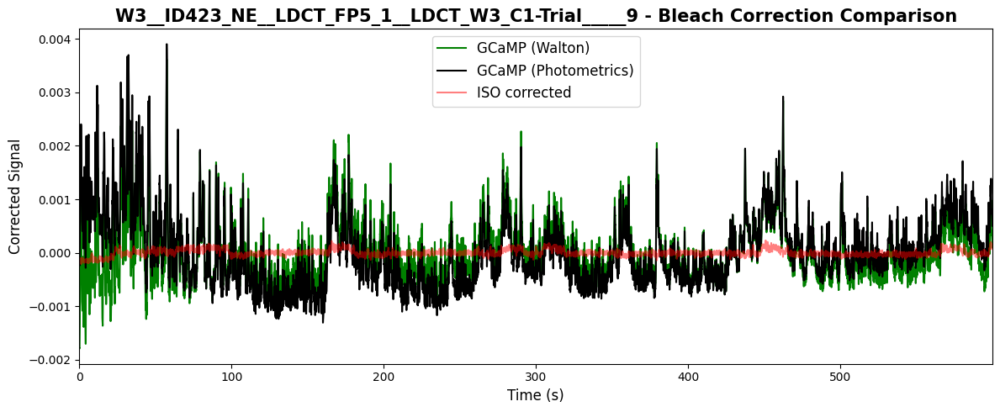

Processing W3__ID463_WT__LDCT_FP1_2__LDCT_W3_C2_retrack-Trial_____5


/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_5172/1712522936.py:53: RankWarning: Polyfit may be poorly conditioned
  m, b = np.polyfit(X, y, 1)


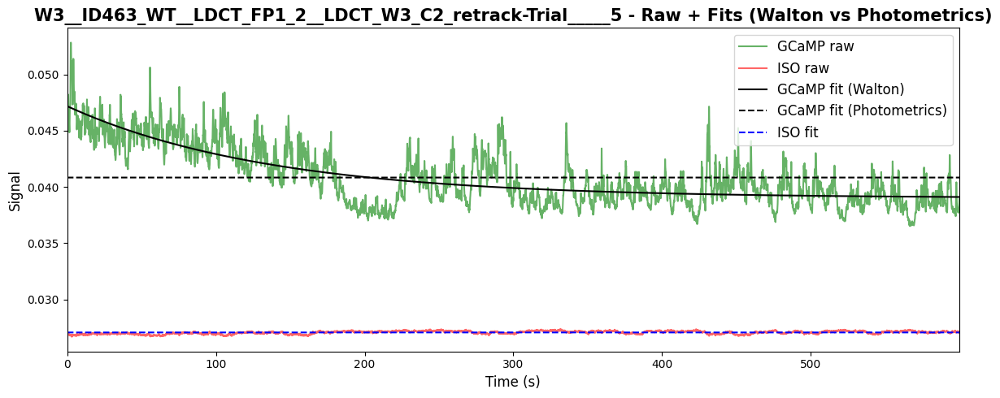

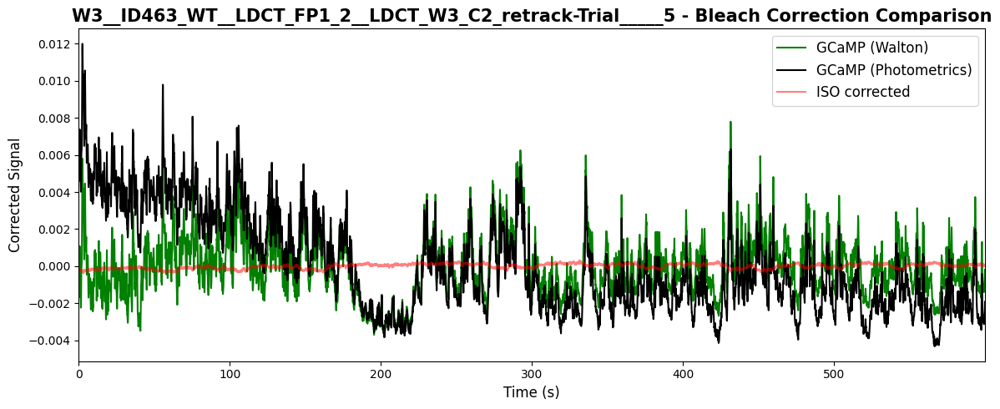

Processing W3__ID459_NE__LDCT_FP2_2__LDCT_W3_C2_retrack-Trial_____6


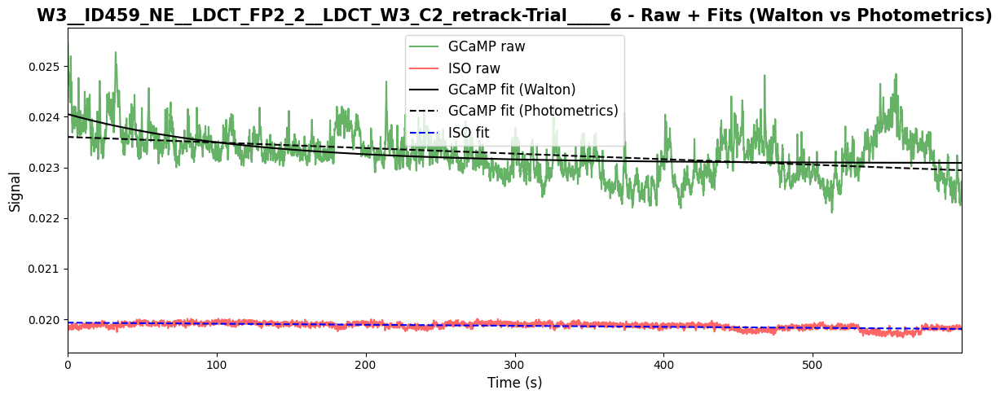

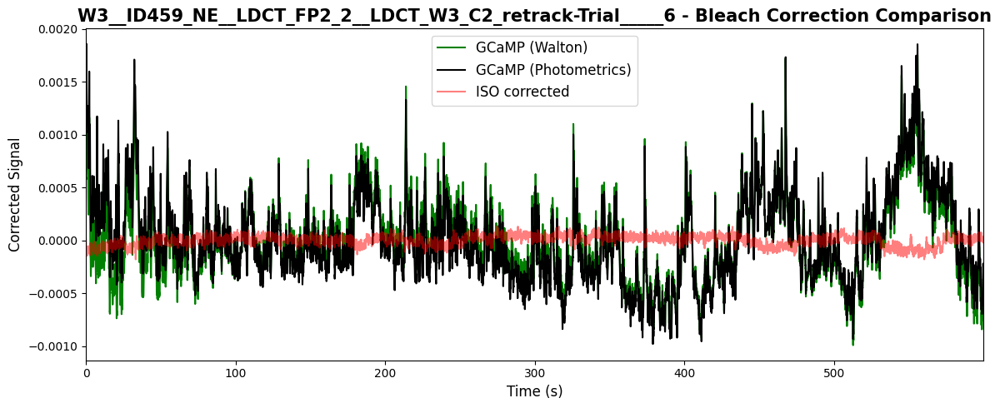

Processing W3__ID398_NE__LDCT_FP3_2__LDCT_W3_C2_retrack-Trial_____7


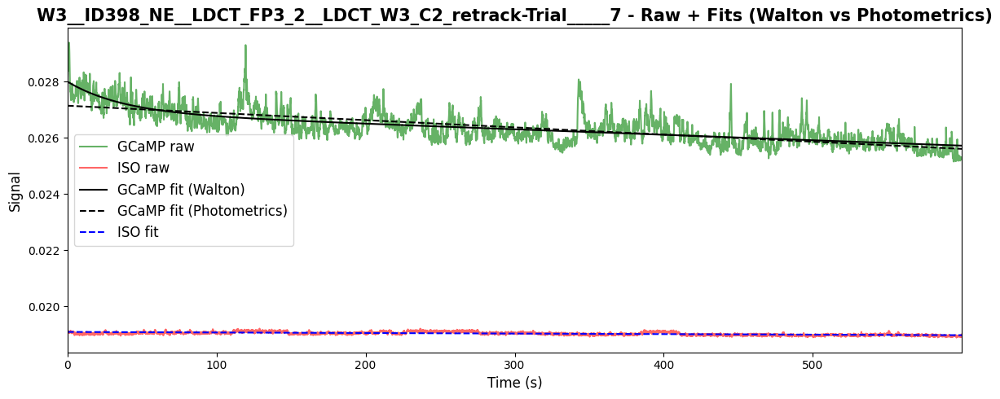

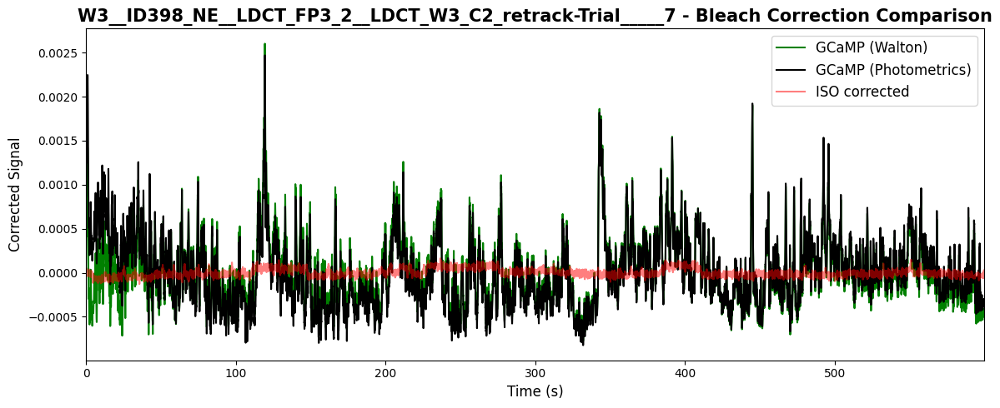

Processing W3__ID400_NE__LDCT_FP4_2__LDCT_W3_C2_retrack-Trial_____8


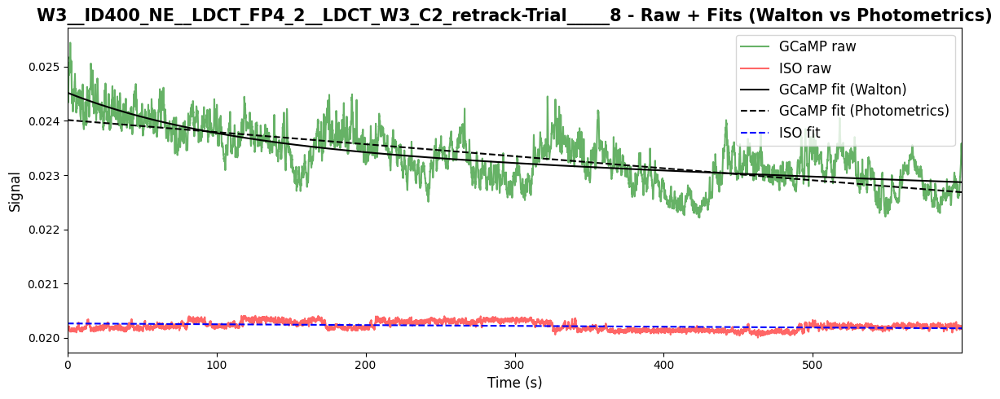

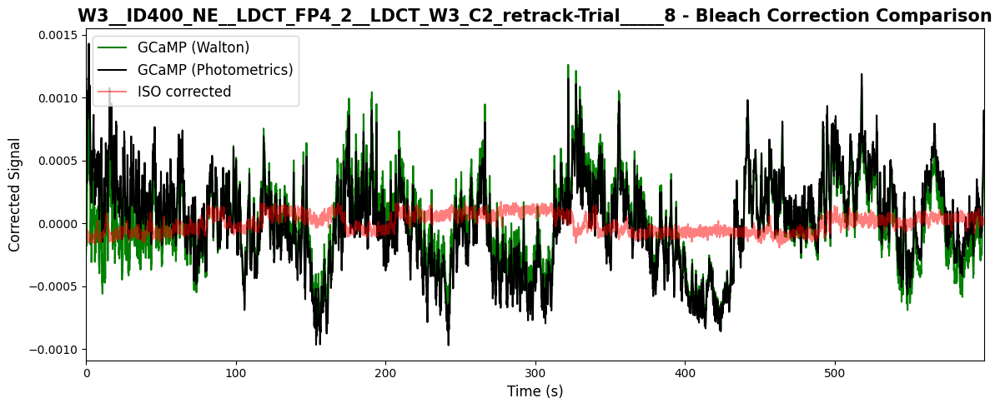

In [22]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# ----------------------------------------------------------
# Double exponential
# ----------------------------------------------------------
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    tau_fast = tau_slow * tau_multiplier
    return const + amp_slow * np.exp(-t / tau_slow) + amp_fast * np.exp(-t / tau_fast)

# ==========================================================
# Loop through trials
# ==========================================================
for trial_key, df in coregistered_traces.items():

    print(f"Processing {trial_key}")
    time_seconds = df["Time_video"].values

    # ======================================================
    # WALTON METHOD (old)
    # ======================================================
    # --- GCaMP fit ---
    max_g = np.max(df["gcamp_denoised"])
    p0 = [max_g/2, max_g/4, max_g/4, 3600, 0.1]
    bounds = ([0,0,0,600,0],[max_g,max_g,max_g,36000,1])

    gcamp_params, _ = curve_fit(double_exponential, time_seconds, df["gcamp_denoised"],
                                p0=p0, bounds=bounds, maxfev=5000)
    df["gcamp_expfit_walton"] = double_exponential(time_seconds, *gcamp_params)

    # --- ISO fit ---
    max_iso = np.max(df["iso_denoised"])
    p0_iso = [max_iso/2, max_iso/4, max_iso/4, 3600, 0.1]

    iso_params, _ = curve_fit(double_exponential, time_seconds, df["iso_denoised"],
                              p0=p0_iso, bounds=bounds, maxfev=5000)
    df["iso_expfit_walton"] = double_exponential(time_seconds, *iso_params)

    # --- Walton correction ---
    df["gcamp_corrected_walton"] = df["gcamp_denoised"] - df["gcamp_expfit_walton"]
    df["iso_corrected_walton"]   = df["iso_denoised"] - df["iso_expfit_walton"]

    # ======================================================
    # PHOTOMETRICS METHOD (new)
    # ======================================================
    # Reuse ISO fit
    df["iso_expfit_photometrics"] = df["iso_expfit_walton"]

    X = df["iso_expfit_photometrics"].values
    y = df["gcamp_denoised"].values

    m, b = np.polyfit(X, y, 1)
    df["gcamp_expfit_photometrics"] = m * X + b

    # --- Photometrics correction ---
    df["gcamp_corrected_photometrics"] = df["gcamp_denoised"] - df["gcamp_expfit_photometrics"] #use this!!
    df["iso_corrected_photometrics"]   = df["iso_denoised"] - df["iso_expfit_photometrics"]

    # ======================================================
    # PLOTTING
    # ======================================================
    plot_trials = True

    if plot_trials:

        # -------- Plot 1: RAW + FITS --------
        fig, ax = plt.subplots(figsize=(12,5))

        ax.plot(time_seconds, df["gcamp_denoised"], 'g', alpha=0.6, label='GCaMP raw')
        ax.plot(time_seconds, df["iso_denoised"], 'r', alpha=0.6, label='ISO raw')

        ax.plot(time_seconds, df["gcamp_expfit_walton"], 'k', label='GCaMP fit (Walton)')
        ax.plot(time_seconds, df["gcamp_expfit_photometrics"], 'k--', label='GCaMP fit (Photometrics)')

        ax.plot(time_seconds, df["iso_expfit_walton"], 'b--', label='ISO fit')

        ax.set_title(f"{trial_key} - Raw + Fits (Walton vs Photometrics)")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Signal")
        ax.legend()
        plt.tight_layout()
        plt.show()

        # -------- Plot 2: BLEACH CORRECTION --------
        fig, ax = plt.subplots(figsize=(12,5))

        ax.plot(time_seconds, df["gcamp_corrected_walton"], 'g', label='GCaMP (Walton)')
        ax.plot(time_seconds, df["gcamp_corrected_photometrics"], 'k', label='GCaMP (Photometrics)')

        ax.plot(time_seconds, df["iso_corrected_walton"], 'r', alpha=0.5, label='ISO corrected')

        ax.set_title(f"{trial_key} - Bleach Correction Comparison")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Corrected Signal")
        ax.legend()
        plt.tight_layout()
        plt.show()

## Motion correction

We now do motion correction by finding the best linear fit of the TdTomato signal to the dLight signal and subtracting this estimated motion component from the dLight signal. We will use the data that was bleaching corrected using the double exponential fit as this is less likely to remove meaningful slow variation in the signals.
first single trial

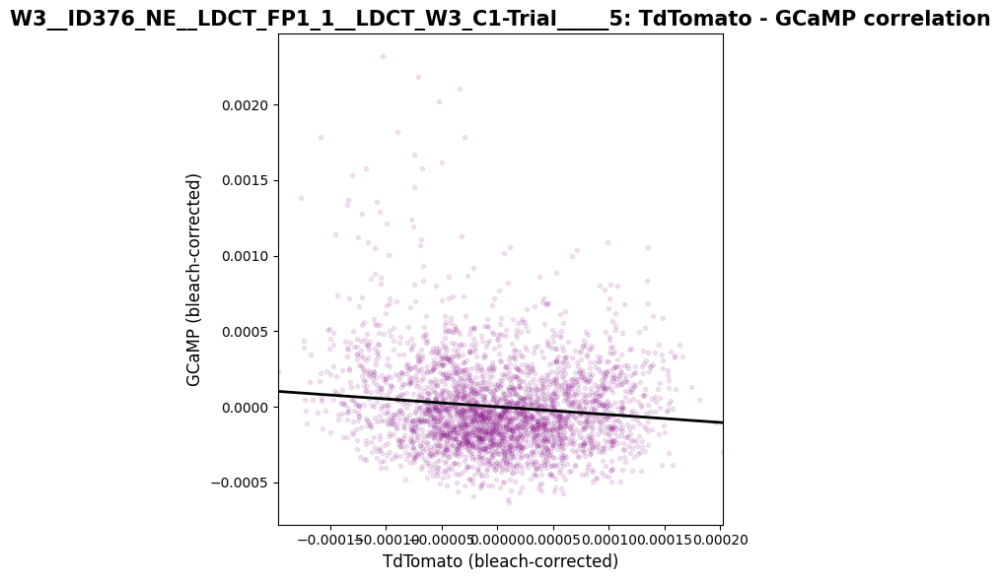

Slope    : -0.518
Intercept: -0.000
R-squared: 0.013
p-value  : 5.935e-46
Std err  : 0.036


In [46]:
from scipy.stats import linregress
import matplotlib.pyplot as plt
import numpy as np

# Pick first trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

x = df["iso_corrected_photometrics"].values       # TdTom / ISO
y = df["gcamp_corrected_photometrics"].values    # GCaMP


# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Scatter plot (downsample every 5 points for clarity)
plt.figure(figsize=(6,6))
plt.scatter(x[::5], y[::5], alpha=0.1, marker='.', color='purple')

# Regression line
line_x = np.array(plt.xlim())
line_y = intercept + slope*line_x
plt.plot(line_x, line_y, color='black', linewidth=2)

plt.xlabel('TdTomato (bleach-corrected)')
plt.ylabel('GCaMP (bleach-corrected)')
plt.title(f'{trial_key}: TdTomato - GCaMP correlation')
plt.tight_layout()
plt.show()

# Print regression stats
print(f"Slope    : {slope:.3f}")
print(f"Intercept: {intercept:.3f}")
print(f"R-squared: {r_value**2:.3f}")
print(f"p-value  : {p_value:.3e}")
print(f"Std err  : {std_err:.3f}")

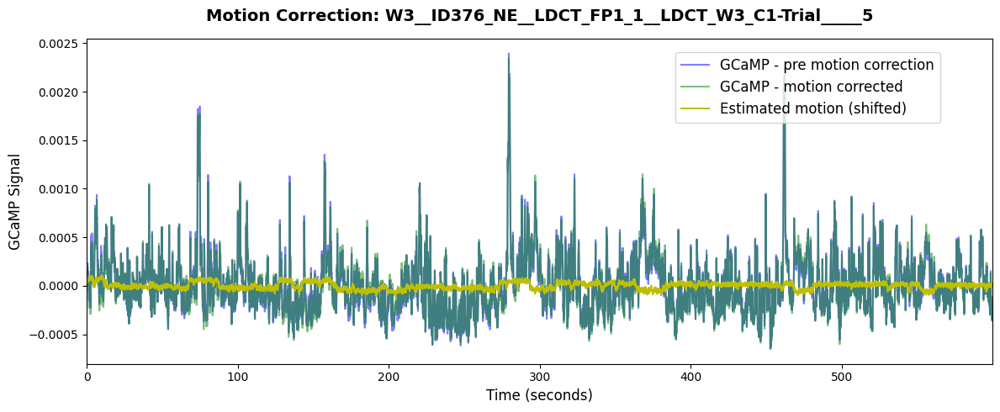


Trial: W3__ID376_NE__LDCT_FP1_1__LDCT_W3_C1-Trial_____5
 Slope    : -0.518
 Intercept: -0.000
 R-squared: 0.013
 p-value  : 5.935e-46
 Std err  : 0.036


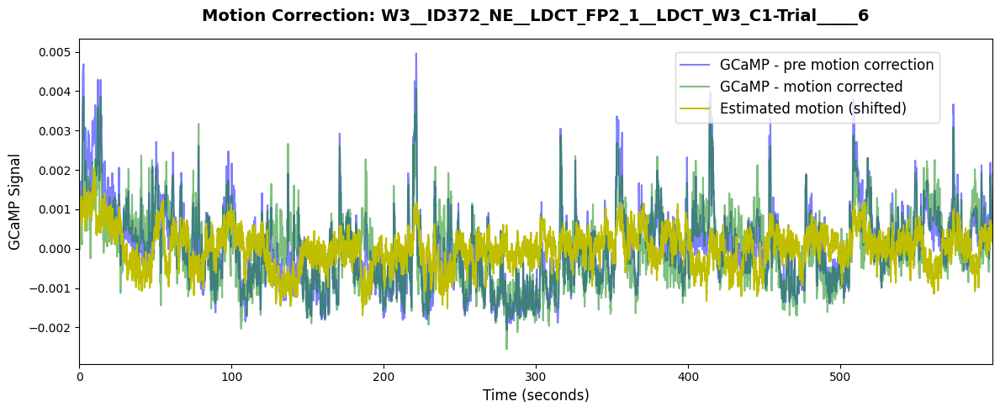


Trial: W3__ID372_NE__LDCT_FP2_1__LDCT_W3_C1-Trial_____6
 Slope    : -6.307
 Intercept: 0.000
 R-squared: 0.215
 p-value  : 0.000e+00
 Std err  : 0.098


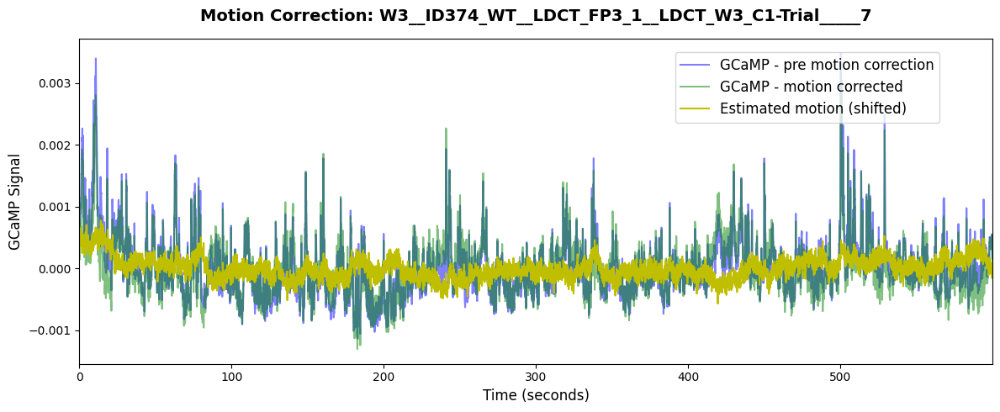


Trial: W3__ID374_WT__LDCT_FP3_1__LDCT_W3_C1-Trial_____7
 Slope    : -3.327
 Intercept: -0.000
 R-squared: 0.128
 p-value  : 0.000e+00
 Std err  : 0.071


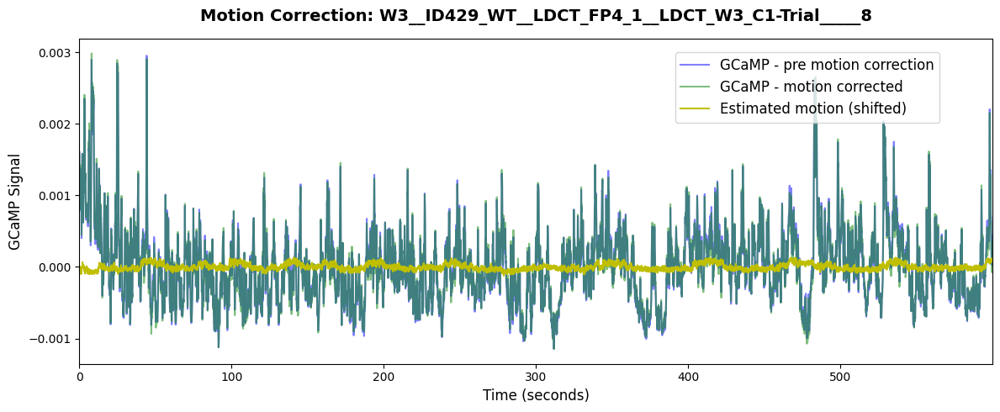


Trial: W3__ID429_WT__LDCT_FP4_1__LDCT_W3_C1-Trial_____8
 Slope    : 0.745
 Intercept: -0.000
 R-squared: 0.007
 p-value  : 1.811e-24
 Std err  : 0.073


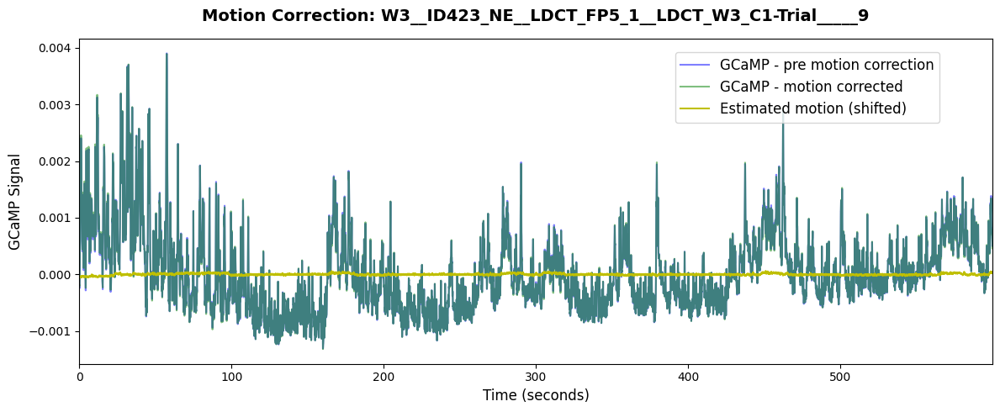


Trial: W3__ID423_NE__LDCT_FP5_1__LDCT_W3_C1-Trial_____9
 Slope    : 0.265
 Intercept: 0.000
 R-squared: 0.001
 p-value  : 5.294e-03
 Std err  : 0.095


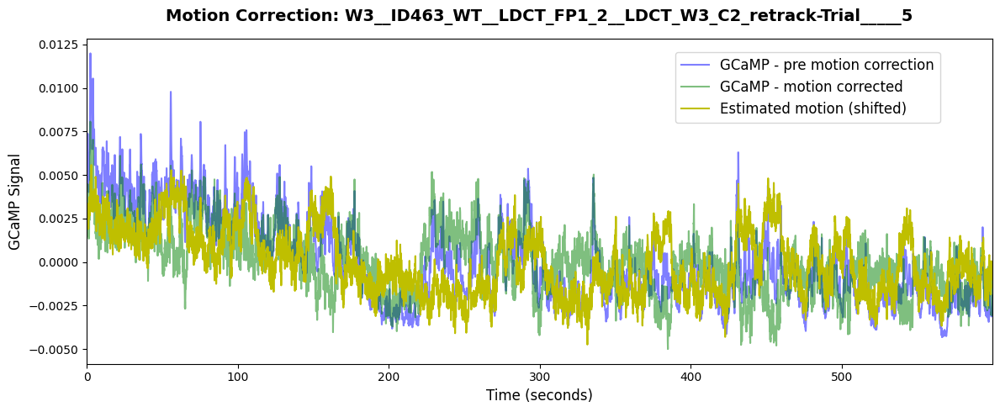


Trial: W3__ID463_WT__LDCT_FP1_2__LDCT_W3_C2_retrack-Trial_____5
 Slope    : -14.570
 Intercept: 0.000
 R-squared: 0.516
 p-value  : 0.000e+00
 Std err  : 0.115


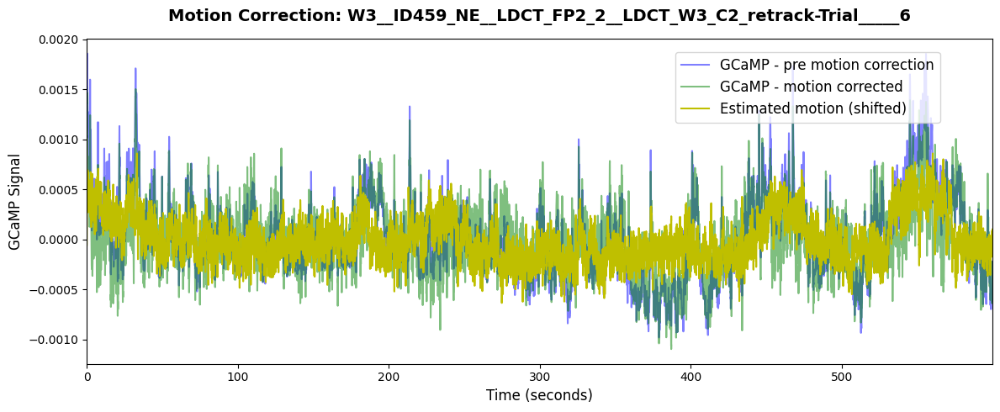


Trial: W3__ID459_NE__LDCT_FP2_2__LDCT_W3_C2_retrack-Trial_____6
 Slope    : -4.770
 Intercept: -0.000
 R-squared: 0.310
 p-value  : 0.000e+00
 Std err  : 0.058


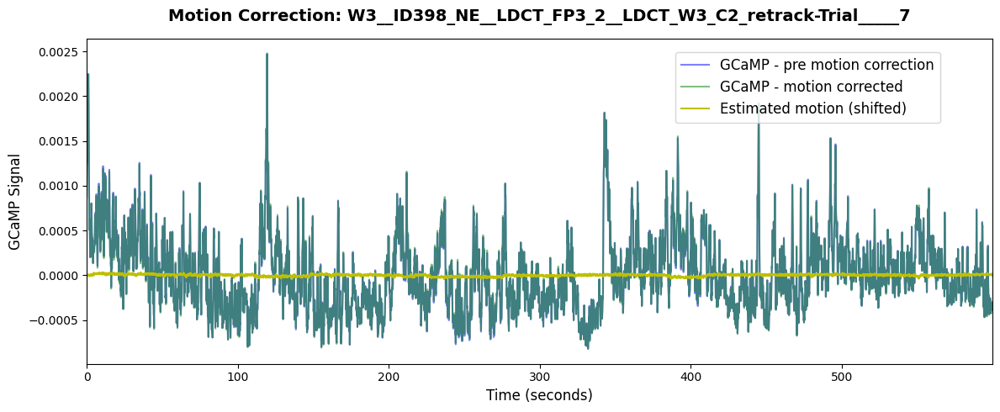


Trial: W3__ID398_NE__LDCT_FP3_2__LDCT_W3_C2_retrack-Trial_____7
 Slope    : -0.265
 Intercept: -0.000
 R-squared: 0.001
 p-value  : 3.748e-04
 Std err  : 0.075


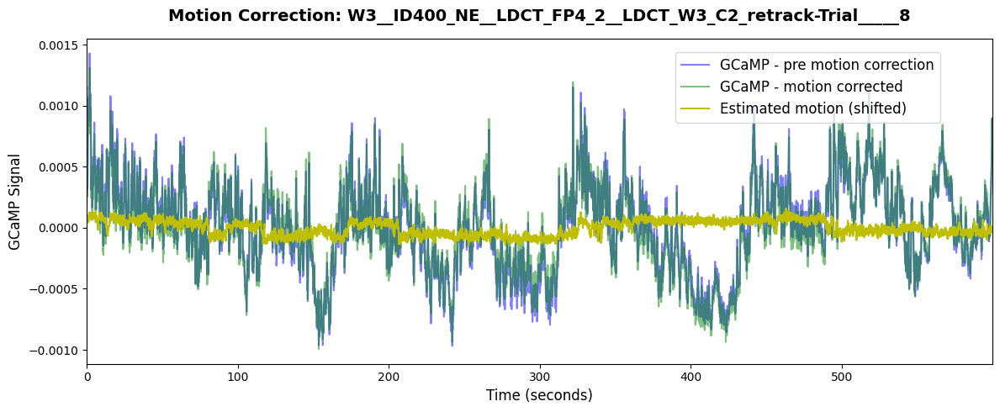


Trial: W3__ID400_NE__LDCT_FP4_2__LDCT_W3_C2_retrack-Trial_____8
 Slope    : -0.828
 Intercept: 0.000
 R-squared: 0.027
 p-value  : 8.378e-93
 Std err  : 0.040
Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F', 'gcamp_z'],
      dtype='object')


In [47]:
from scipy.stats import linregress
import numpy as np
import matplotlib.pyplot as plt

# Dictionary to store motion-corrected traces
motion_corrected_traces = {}

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    
    time_seconds = df["Time_video"].values
    
    # Bleach-corrected signals
    iso_detrended = df["iso_corrected_photometrics"].values      # TdTom / ISO
    gcamp_detrended = df["gcamp_corrected_photometrics"].values  # GCaMP / dLight


    # ---------------------------------------------------------
    # Linear regression: motion correction
    # ---------------------------------------------------------
    slope, intercept, r_value, p_value, std_err = linregress(iso_detrended, gcamp_detrended)

    # Estimate motion contribution
    gcamp_est_motion = intercept + slope * iso_detrended
    gcamp_motion_corrected = gcamp_detrended - gcamp_est_motion

    # Store results
    motion_corrected_traces[trial_key] = {
        "gcamp_motion_corrected": gcamp_motion_corrected,
        "gcamp_est_motion": gcamp_est_motion,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value,
        "std_err": std_err,
        "time_seconds": time_seconds
    }

    # ---------------------------------------------------------
    # Plot motion correction
    # ---------------------------------------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    # Pre-motion corrected
    plot1 = ax1.plot(time_seconds, gcamp_detrended, 'b', alpha=0.5, label='GCaMP - pre motion correction')
    
    # Motion-corrected
    plot3 = ax1.plot(time_seconds, gcamp_motion_corrected, 'g', alpha=0.5, label='GCaMP - motion corrected')
    
    # Shift motion trace for visual alignment
    motion_offset = gcamp_detrended.mean() - gcamp_motion_corrected.mean()
    plot4 = ax1.plot(time_seconds, gcamp_est_motion + motion_offset, 'y', label='Estimated motion (shifted)')
    
    # Auto Y-axis limits based on the range of signals
    combined = np.concatenate([gcamp_detrended, gcamp_motion_corrected, gcamp_est_motion + motion_offset])
    y_min, y_max = combined.min(), combined.max()
    y_padding = (y_max - y_min) * 0.05  # 5% padding
    ax1.set_ylim(y_min - y_padding, y_max + y_padding)
    
    # Add trial key at top
    ax1.set_title(f'Motion Correction: {trial_key}', fontsize=14, pad=15)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP Signal')
    
    # Combine legend
    lines = plot1 + plot3 + plot4
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    # Optional zoom per trial
    # ax1.set_xlim(1000, 1060)
    
    plt.tight_layout()
    plt.show()
    
    # Print regression stats
    print(f"\nTrial: {trial_key}")
    print(f" Slope    : {slope:.3f}")
    print(f" Intercept: {intercept:.3f}")
    print(f" R-squared: {r_value**2:.3f}")
    print(f" p-value  : {p_value:.3e}")
    print(f" Std err  : {std_err:.3f}")

    #add the variables to the data frame
    df["gcamp_motion_corrected"] = gcamp_motion_corrected
    df["gcamp_est_motion"] = gcamp_est_motion

 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

## Normalisation

Typically in a photometry experiment we want to combine data across sessions and/or subjects. This is complicated by the fact that different sessions may have different levels of fluorphore expression, excitation light and autofluorescence. It is therefore desirable to normalise the data to reduce this variability. The two most widely used ways of doing this are computing dF/F or z-scores.

Method 1: dF/F

To compute dF/F we divide the signal changes (dF) by the baseline fluorescence (F) and multiply by 100 to convert to percent. The dF is just the motion corrected signal plotted above. The baseline fluorescence F changes over the course of the session due to photobleaching, and is just the baseline we estimated with our double exponential fit.
Question: if using the old exp fit from gcamp, wouldnt that one have a much higher number, and a curve?

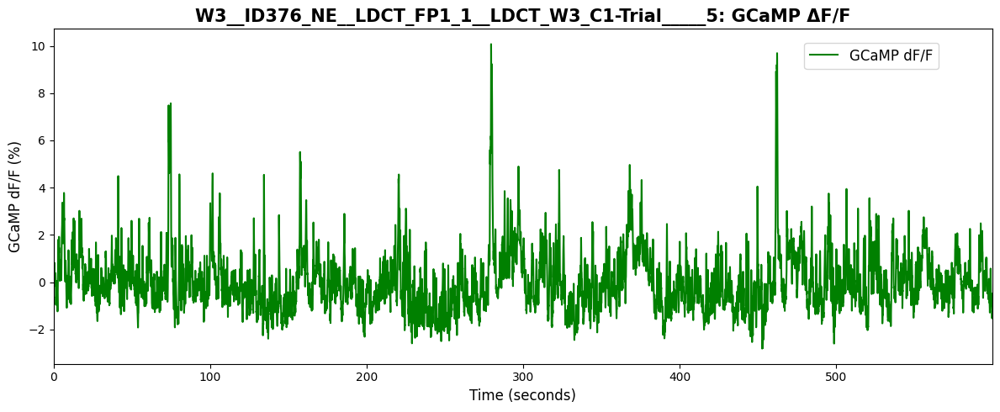

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Pick a trial
trial_key = list(coregistered_traces.keys())[0]
df = coregistered_traces[trial_key]

time_seconds = df["Time_video"].values

# Compute ΔF/F (%) using motion-corrected signal and exponential fit - so it is not divided by the iso signal, but by the double exponential fit from earlier - however, that was fit before bleach correction, so why do we divide by this? wouldn't this have the bleaching slope with it, which our new trace does not? would it be better to divide by the bleach corrected iso signal? or even add motion correction to the iso signal and divide by the motion-corrected iso signal?
#gcamp_dF_F = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit"]
#gcamp_dF_F = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit_photometrics"]
df["gcamp_dF_F"] = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit_photometrics"]
gcamp_dF_F = df["gcamp_dF_F"]

    # --- Photometrics correction ---
#
# For now, we'll just leave this commented or empty if you don't have them
reward_cue_times = np.array([])  

# Plot ΔF/F
fig, ax1 = plt.subplots(figsize=(12,5))

plot1 = ax1.plot(time_seconds, gcamp_dF_F, 'g', label='GCaMP dF/F')
if reward_cue_times.size > 0:
    reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                            label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('GCaMP dF/F (%)')
ax1.set_title(f'{trial_key}: GCaMP ΔF/F')

# Legend
lines = plot1
if reward_cue_times.size > 0:
    lines += reward_ticks
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))


plt.tight_layout()
plt.show()

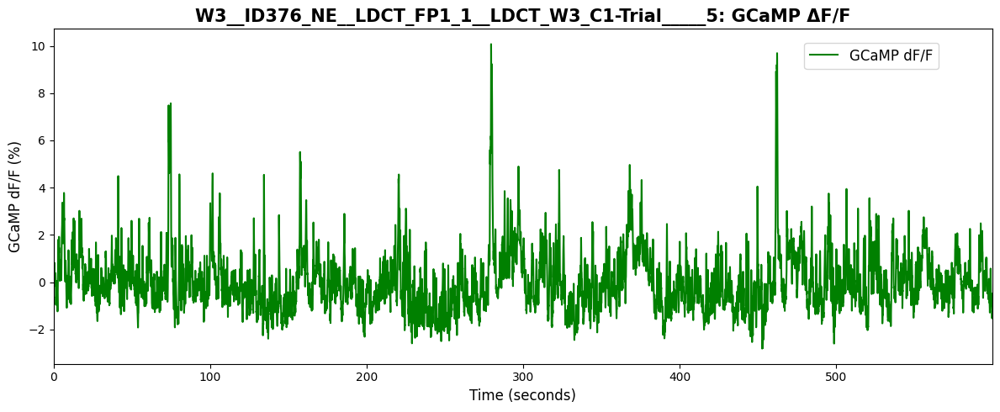

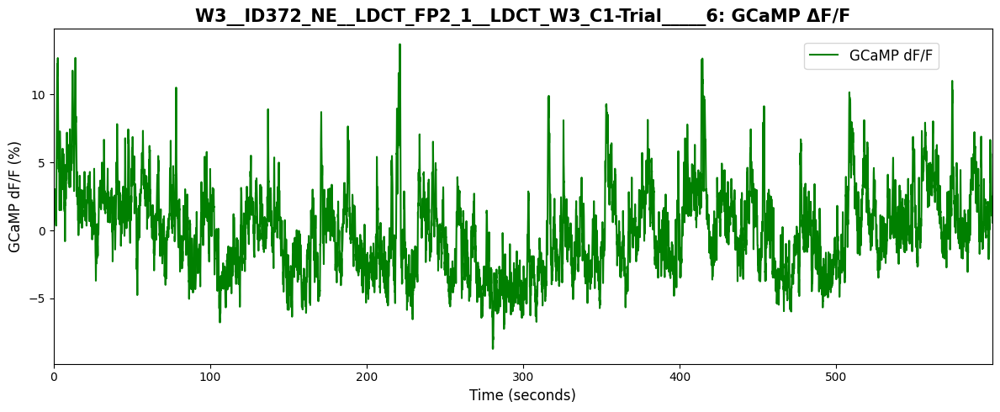

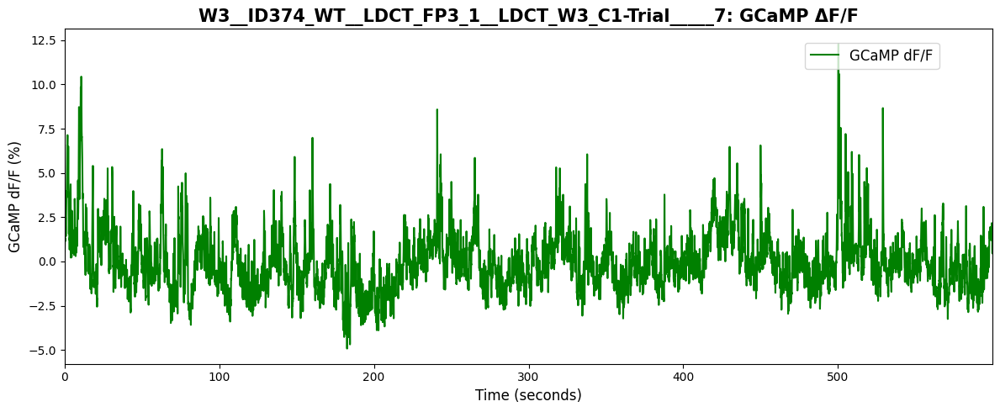

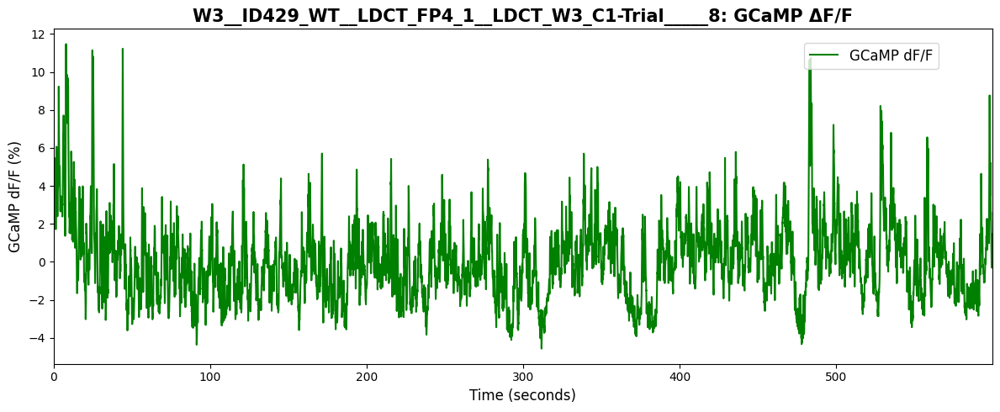

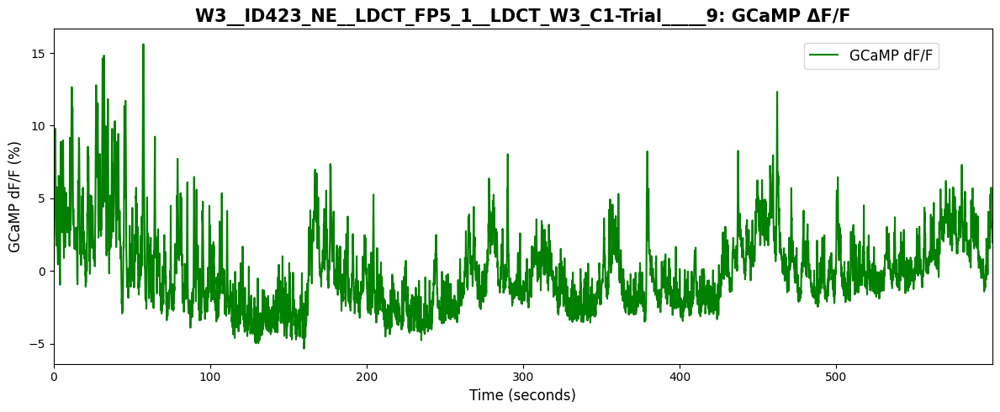

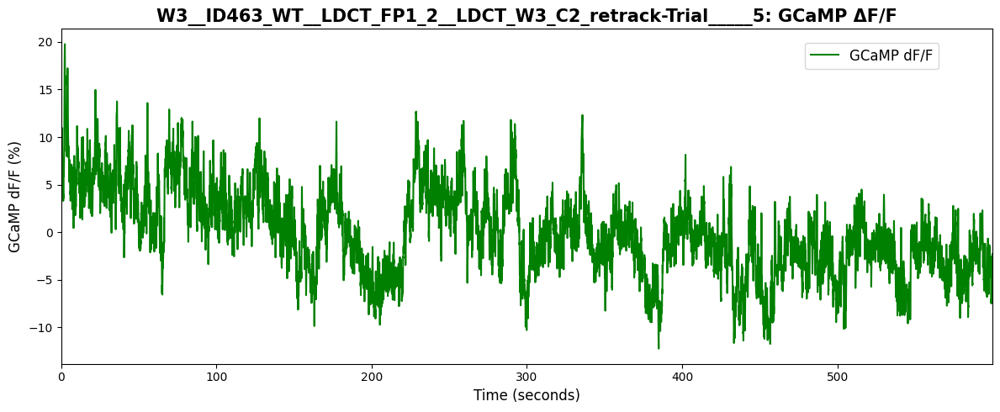

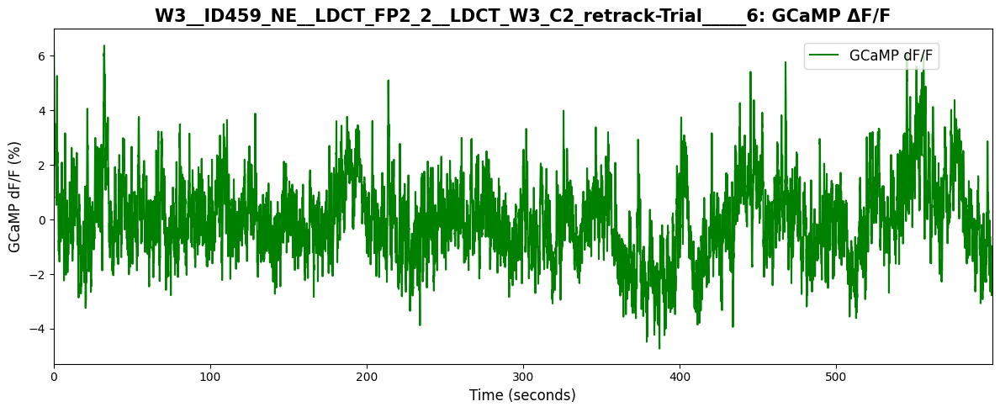

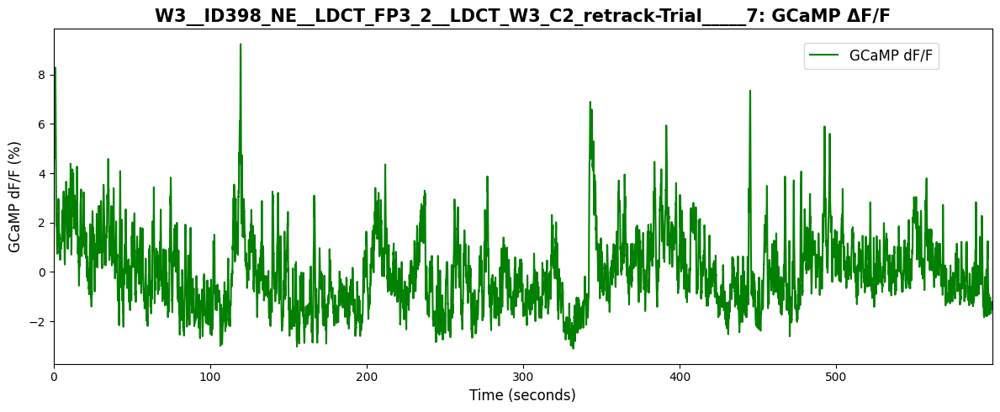

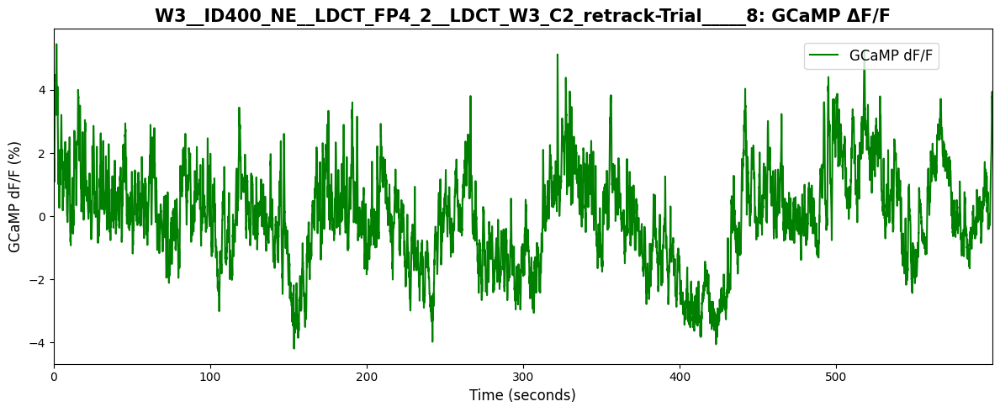

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F', 'gcamp_z'],
      dtype='object')


In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Example reward cue times (replace with actual timestamps if available)
reward_cue_times = np.array([])

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    time_seconds = df["Time_video"].values

    # Compute ΔF/F (%) for GCaMP (gcamp_bleach_corrected / gcamp_expfit)
    #gcamp_dF_F = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit_photometrics"]
    df["gcamp_dF_F"] = 100 * df["gcamp_motion_corrected"] / df["gcamp_expfit_photometrics"]


    # Optional: compute ΔF/F for ISO channel if desired
    # df["iso_dF_F"] = 100 * df["iso_bleach_corrected"] / df["iso_expfit"]

    # -------------------------
    # Plot ΔF/F for each trial
    # -------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    plot1 = ax1.plot(time_seconds, df["gcamp_dF_F"], 'g', label='GCaMP dF/F')
    
    if reward_cue_times.size > 0:
        reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                                label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP dF/F (%)')
    ax1.set_title(f'{trial_key}: GCaMP ΔF/F')
    
    # Combine legend
    lines = plot1
    if reward_cue_times.size > 0:
        lines += reward_ticks
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    
    plt.tight_layout()
    plt.show()
    #add the variables to the data frame
    #df["gcamp_motion_corrected"] = gcamp_motion_corrected
    #df["gcamp_est_motion"] = gcamp_est_motion


 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

Method 2: Z-scoring

Alternatively, we can normalise the data by z-scoring each session - i.e. subtracting the mean and dividing by the standard deviation.

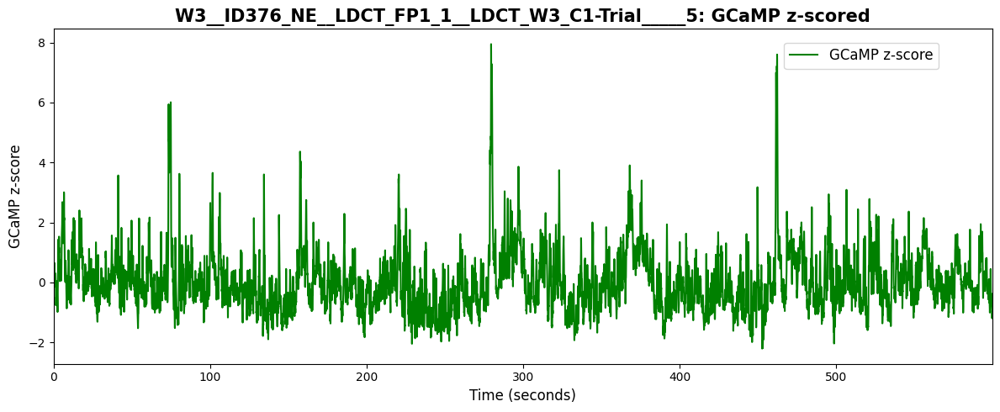

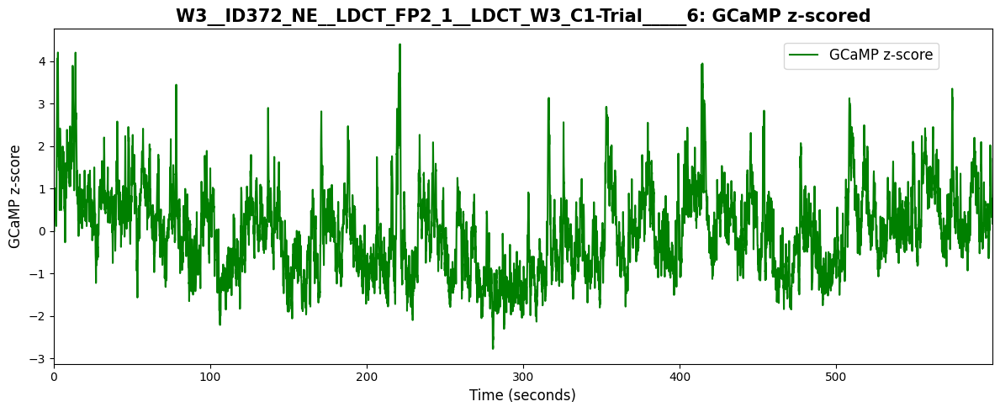

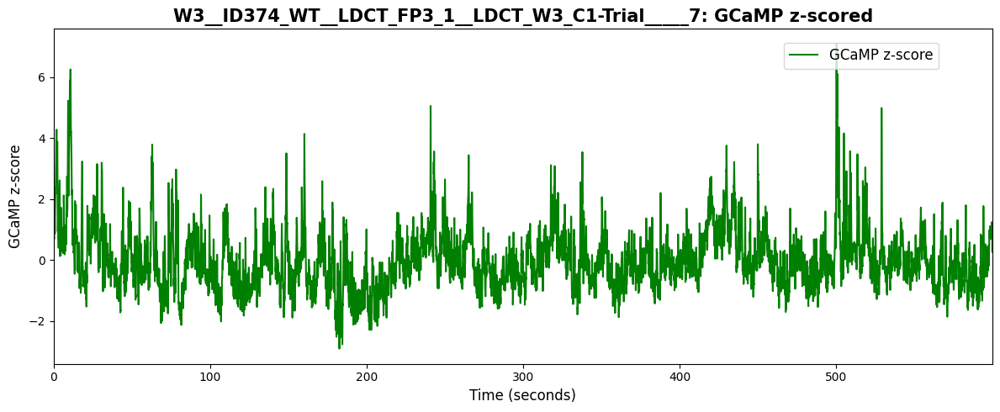

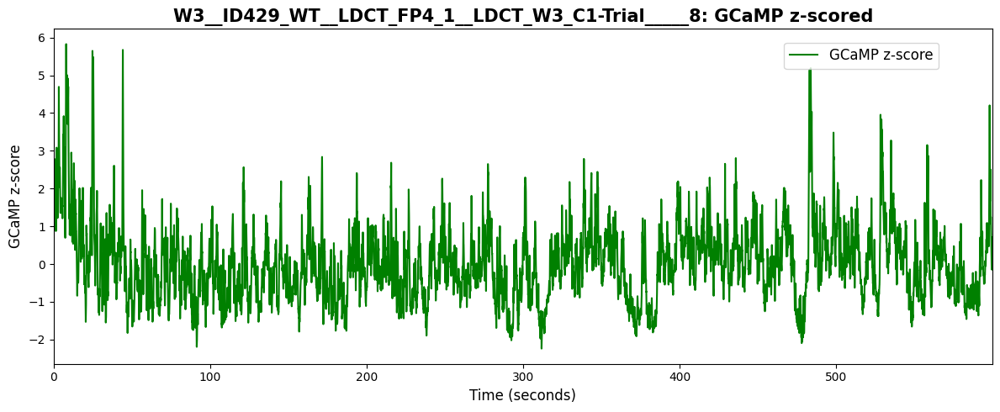

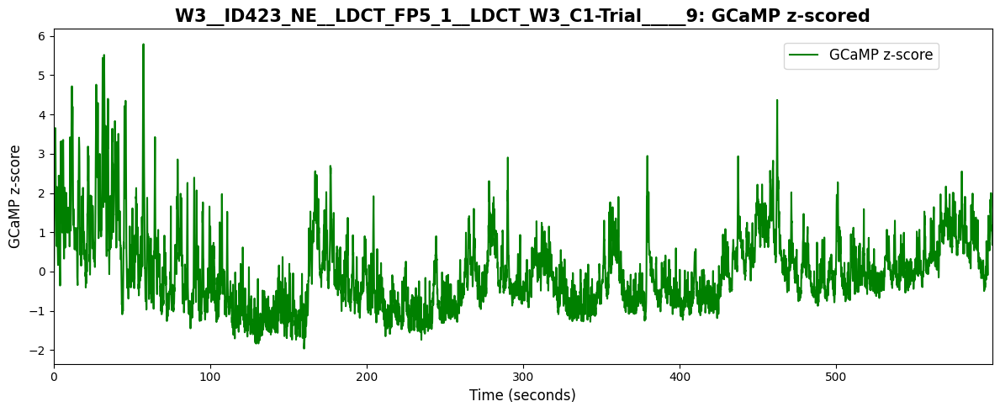

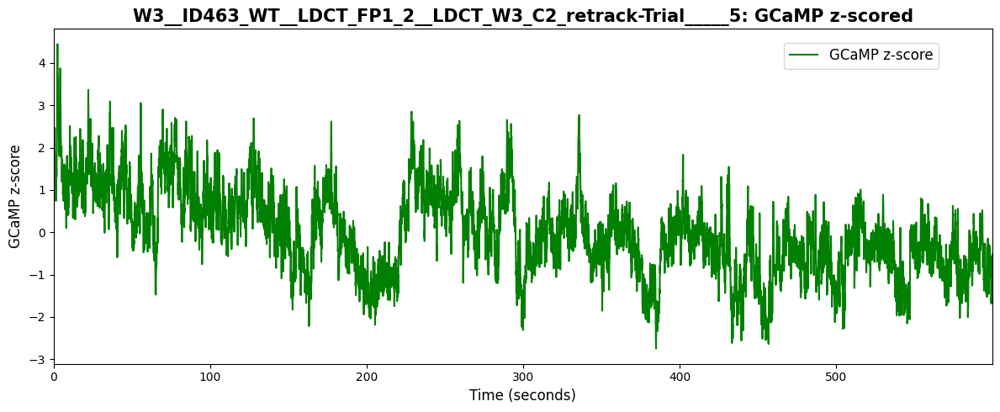

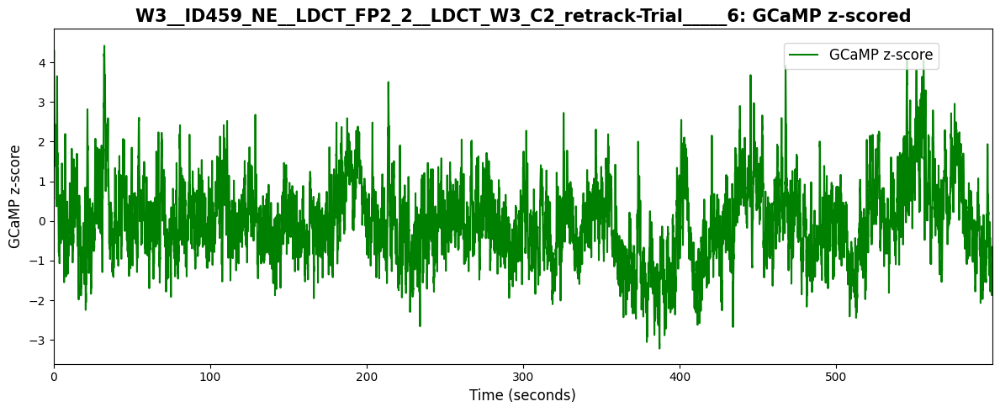

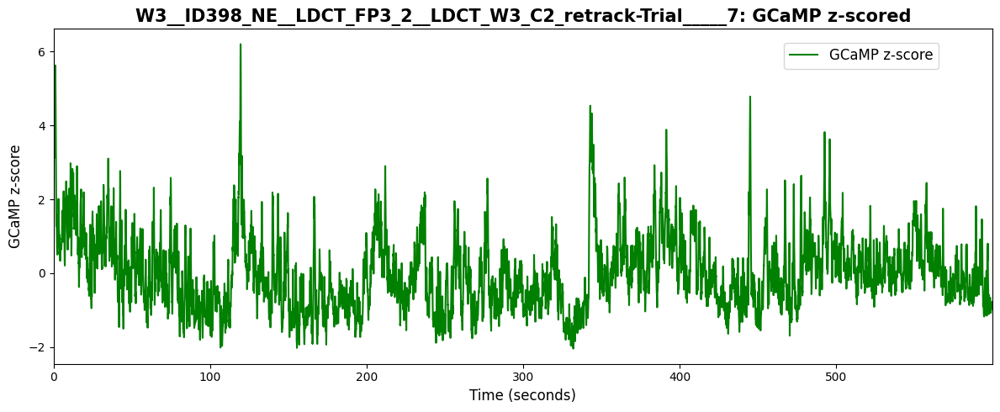

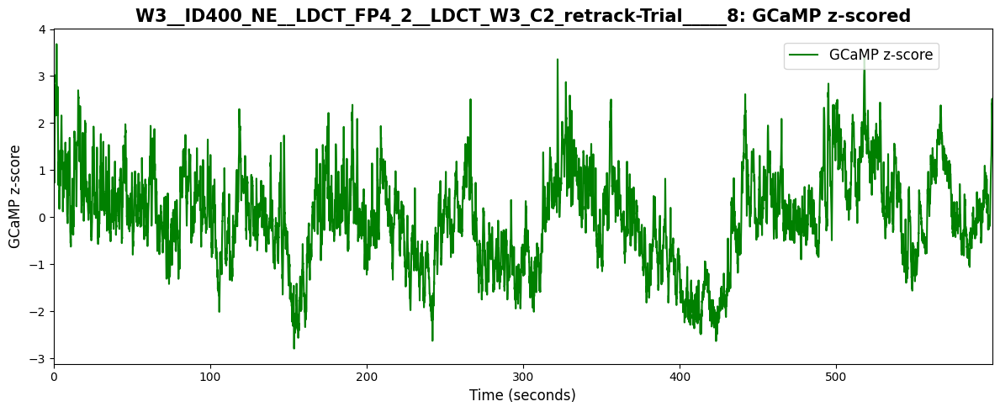

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F', 'gcamp_z'],
      dtype='object')


In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Example reward cue times (replace with actual timestamps if available)
reward_cue_times = np.array([])

# Loop over all trials
for trial_key, df in coregistered_traces.items():
    time_seconds = df["Time_video"].values

    # Compute z-score for motion- and bleach-corrected GCaMP
    df["gcamp_z"] = (df["gcamp_motion_corrected"] - np.mean(df["gcamp_motion_corrected"])) / np.std(df["gcamp_motion_corrected"])

    # Optional: compute z-score for ISO if desired
    # df["iso_z"] = (df["iso_corrected"] - np.mean(df["iso_corrected"])) / np.std(df["iso_corrected"])

    # -------------------------
    # Plot z-scored GCaMP for each trial
    # -------------------------
    fig, ax1 = plt.subplots(figsize=(12,5))
    
    plot1 = ax1.plot(time_seconds, df["gcamp_z"], 'g', label='GCaMP z-score')
    
    
    if reward_cue_times.size > 0:
        reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6),
                                label='Reward Cue', color='w', marker="v", mfc='k', mec='k', ms=8)
    
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('GCaMP z-score')
    ax1.set_title(f'{trial_key}: GCaMP z-scored')
    
    # Combine legend
    lines = plot1
    if reward_cue_times.size > 0:
        lines += reward_ticks
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))
    
    
    plt.tight_layout()
    plt.show()

 #check columns added to overall dataframe
first_key = list(coregistered_traces.keys())[0]
print(coregistered_traces[first_key].columns)

In [28]:
# Putting together corrections to ethovision ethogram and FP preprocessed traces

#below code uses all the preprocessed signals, also the intermediares + skip to the next block to see only delta F over F signal

In [50]:
def map_behavior_to_time(time_vector, timeline_kernel):
    """
    Map the kernel-smoothed behavior to each timepoint in the FP time vector.
    
    Args:
        time_vector (np.array): FP time points (Time_video)
        timeline_kernel (pd.DataFrame): Kernel-smoothed ethogram with columns
                                        ['Behavior', 'Start_time_s', 'End_time_s']
    Returns:
        np.array: Behavior label for each time point
    """
    behavior_at_time = np.array(["Unknown"] * len(time_vector), dtype=object)

    for _, row in timeline_kernel.iterrows():
        mask = (time_vector >= row["Start_time_s"]) & (time_vector < row["End_time_s"])
        behavior_at_time[mask] = row["Behavior"]

    return behavior_at_time


In [30]:
# def map_behavior_to_time(time_vector, timeline_kernel):
#     """
#     Map kernel-smoothed behavior to each FP timepoint.

#     Assumes timeline_kernel fully covers the recording window.

#     Returns:
#         np.array of behavior labels aligned to time_vector
#     """

#     behavior_at_time = np.empty(len(time_vector), dtype=object)

#     # Convert to numpy for speed
#     starts = timeline_kernel["Start_time_s"].values
#     ends = timeline_kernel["End_time_s"].values
#     labels = timeline_kernel["Behavior"].values

#     # For each segment, assign labels
#     for start, end, label in zip(starts, ends, labels):
#         mask = (time_vector >= start) & (time_vector < end)
#         behavior_at_time[mask] = label

#     # --- Safety check (should never happen now) ---
#     if np.any(behavior_at_time == None):
#         behavior_at_time[behavior_at_time == None] = "Closed"

#     return behavior_at_time

In [51]:
# combined_trials = {}

# for key in preproc_trials.keys():
#     df = preproc_trials[key].copy()
#     if "timeline_kernel" in fp_traces[key]:
#         timeline_kernel = fp_traces[key]["timeline_kernel"]
#         df["Behavior"] = map_behavior_to_time(df["Time_video"].values, timeline_kernel)
#     else:
#         df["Behavior"] = "Unknown"  # fallback
#     combined_trials[key] = df

combined_trials = {}

for key in coregistered_traces.keys():
    df = coregistered_traces[key].copy()
    
    if "timeline_kernel" in fp_traces[key]:
        timeline_orig = fp_traces[key]["timeline_kernel"]
        
        df["Behavior"] = map_behavior_to_time(
            df["Time_video"].values,   # ← likely fix
            timeline_orig
        )
    else:
        df["Behavior"] = "Closed"
    
    combined_trials[key] = df


In [52]:
print(fp_traces[key].keys())

dict_keys(['iso', 'gcamp', 'mouse_id', 'genotype', 'timeline', 'beh_cols', 'timeline_open_closed', 'beh_cols_open_closed', 'timeline_kernel', 'week'])


In [53]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

def plot_dff_with_ethogram(df, key, save_dir=None):
    """
    Plot only the dF/F (%) signal together with kernel-smoothed ethogram.

    df must contain:
        Time_video
        dFF
        Behavior
    """
    time = df["Time_video"].values
    dFF = df["gcamp_dF_F"].values
    behaviors = df["Behavior"].values

    # Unique behaviors and colors
    beh_labels = np.unique(behaviors)
    colors = plt.cm.tab10(np.arange(len(beh_labels)))  # up to 10 colors
    beh_color_map = dict(zip(beh_labels, colors))

    fig, ax = plt.subplots(1, 1, figsize=(14, 4))

    # Plot dF/F
    ax.plot(time, dFF, color="purple", linewidth=1)
    ax.set_ylabel("dF/F (%)")
    ax.set_xlabel("Time (s)")
    ax.set_title(f"{key} — dF/F with kernel-smoothed ethogram")

    # Overlay ethogram as colored bands
    for beh in beh_labels:
        mask = behaviors == beh
        ax.fill_between(time, ax.get_ylim()[0], ax.get_ylim()[1],
                        where=mask, color=beh_color_map[beh], alpha=0.2, step="post")

    # Legend for behaviors
    handles = [mpatches.Patch(color=beh_color_map[b], alpha=0.3, label=b) for b in beh_labels]
    ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()

    if save_dir is not None:
        out = save_dir / f"{key}_dFF_ethogram.png"
        plt.savefig(out, dpi=200)
        plt.close()
    else:
        plt.show()


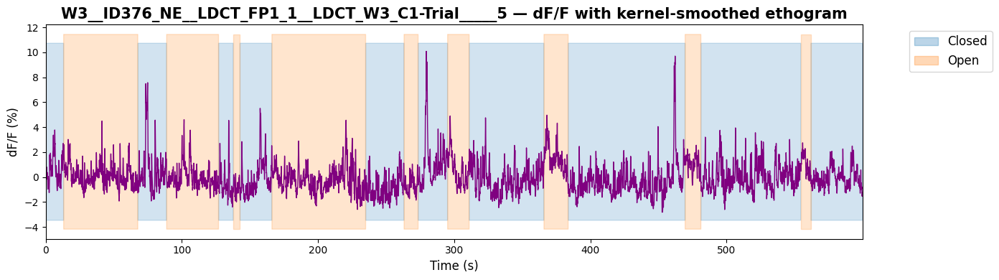

In [54]:
example_key = list(combined_trials.keys())[0]
plot_dff_with_ethogram(combined_trials[example_key], example_key)


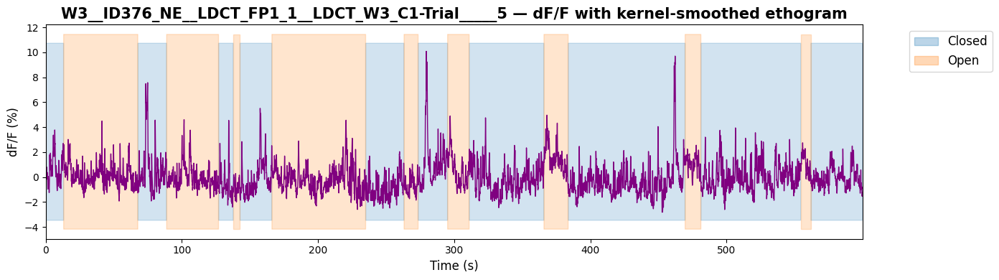

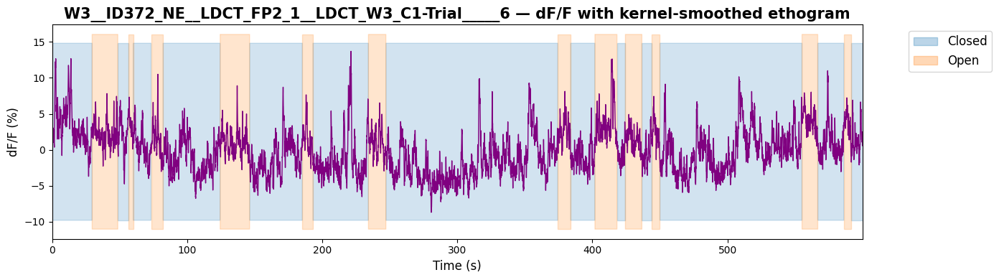

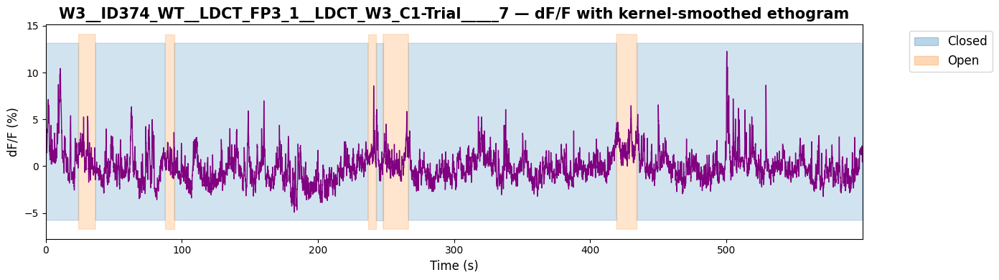

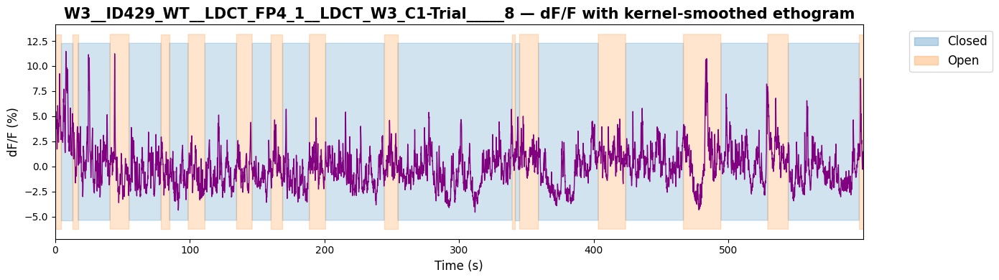

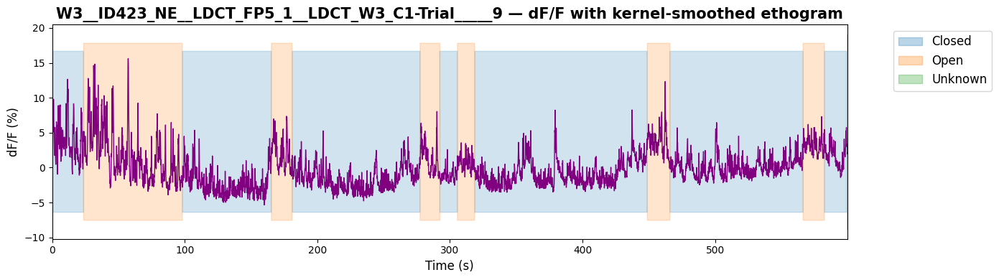

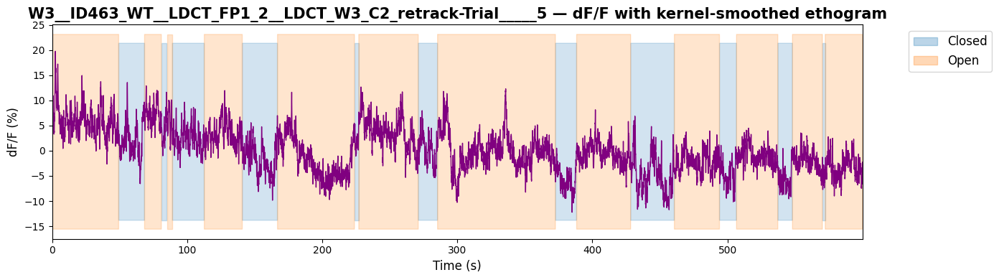

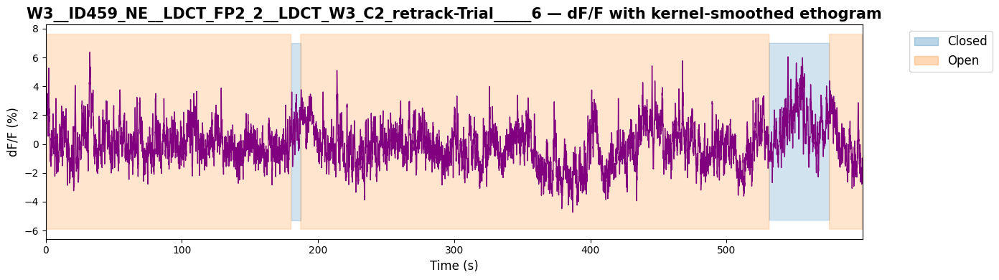

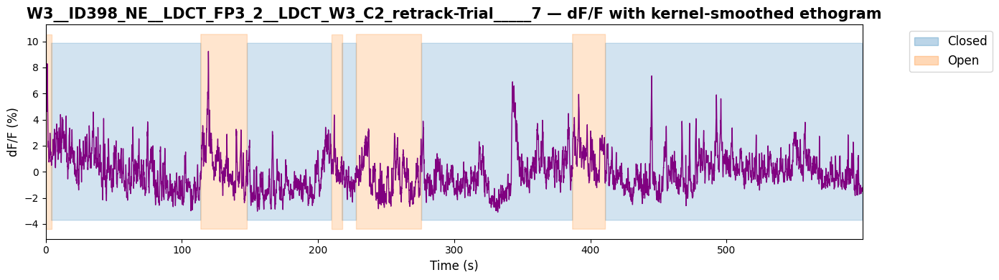

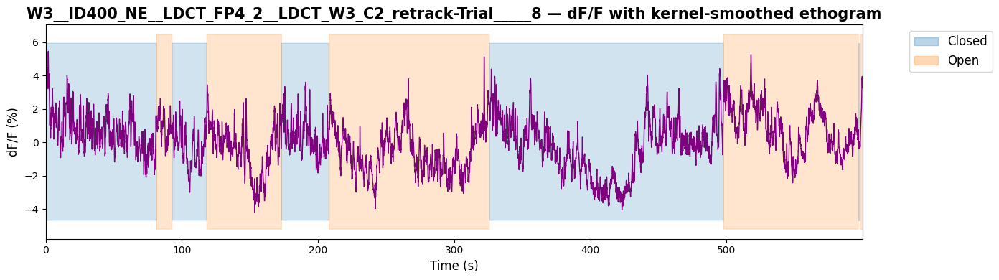

In [55]:
# Loop over all trials and display the dF/F plot with ethogram and legend
for example_key in combined_trials.keys():
    plot_dff_with_ethogram(combined_trials[example_key], example_key, save_dir=None)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0      # seconds before event
post_s = 4.0     # seconds after event
min_stay_s = 0   # optional, if you want to filter very short events

# Pick first trial
example_key = list(combined_trials.keys())[3]
df = combined_trials[example_key].copy()

time_vec = df["Time_video"].values
signal_vec = df["gcamp_dF_F"].values
behaviors = df["Behavior"].values

# Unique behaviors
unique_beh = np.unique(behaviors)

# Loop over behaviors
for beh in unique_beh:
    # Find event starts (transition into this behavior)
    mask = (behaviors == beh)
    mask_int = mask.astype(int)  # convert bool to int
    diffs = np.diff(np.r_[0, mask_int])  # prepend 0 for first element
    event_starts_idx = np.where(diffs == 1)[0]  # rising edges

    # Skip if no events
    if len(event_starts_idx) == 0:
        print(f"No events found for {beh}")
        continue

    # Convert pre/post window to samples
    fps = 1 / np.mean(np.diff(time_vec))  # effective sampling rate
    pre_n = int(pre_s * fps)
    post_n = int(post_s * fps)

    # Collect peri-event segments
    segments = []
    for idx in event_starts_idx:
        if idx >= pre_n and (idx + post_n) < len(signal_vec):
            seg = signal_vec[idx-pre_n : idx+post_n].copy()
            seg = seg - np.mean(seg[:pre_n])  # baseline correction
            segments.append(seg)

    if len(segments) == 0:
        print(f"No valid peri-event segments for {beh}")
        continue

    ERF = np.column_stack(segments)
    t_window = np.linspace(-pre_s, post_s, pre_n + post_n)

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(8,4))
    # Individual traces
    colors = plt.cm.tab10(np.linspace(0,1,ERF.shape[1]))
    for i, col in enumerate(colors):
        ax.plot(t_window, ERF[:,i], color=col, alpha=0.3, lw=1)
    # Mean trace
    ax.plot(t_window, ERF.mean(axis=1), color="black", lw=2.5, label="Mean")

    ax.axvline(0, color="k", linestyle="--")
    ax.set_title(f"Peri-event dF/F — {example_key} | Behavior: {beh}")
    ax.set_xlabel("Time relative to event start (s)")
    ax.set_ylabel("ΔF/F (%)")
    ax.grid(True)
    ax.legend(frameon=False)
    plt.tight_layout()
    plt.show()


In [57]:
import numpy as np
import pandas as pd

# Pick the trial
example_key = list(combined_trials.keys())[2]
df = combined_trials[example_key]

behaviors = df["Behavior"].values
unique_beh = np.unique(behaviors)

# Count number of instances (rising edges into each behavior)
event_counts = {}

for beh in unique_beh:
    mask = (behaviors == beh)
    mask_int = mask.astype(int)
    diffs = np.diff(np.r_[0, mask_int])  # prepend 0 for first element
    event_starts_idx = np.where(diffs == 1)[0]  # transitions into behavior
    event_counts[beh] = len(event_starts_idx)

# Convert to DataFrame for display
event_counts_df = pd.DataFrame.from_dict(event_counts, orient="index", columns=["Num_Instances"])
event_counts_df.index.name = "Behavior"
event_counts_df


,Num_Instances
Behavior,
Closed,6
Open,5


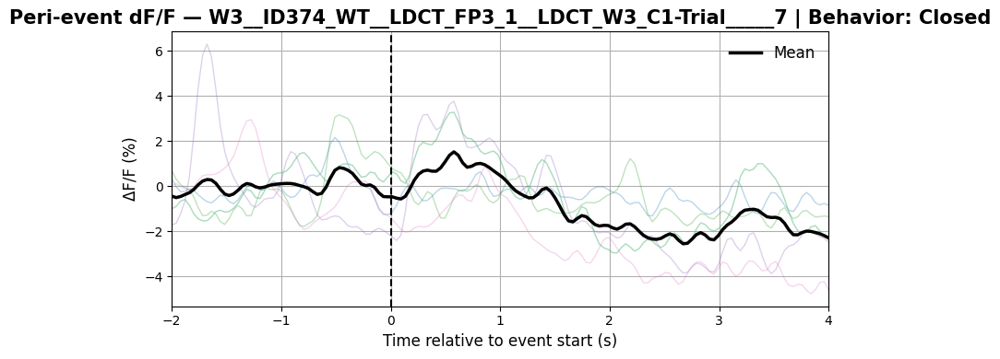

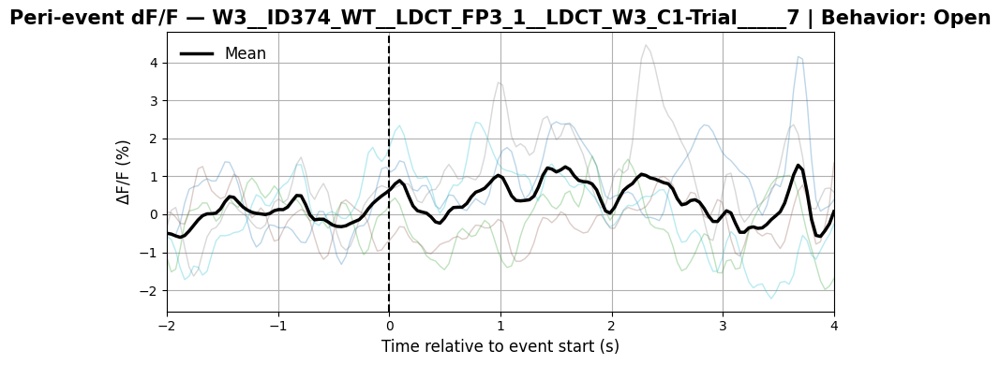

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0   # seconds before event
post_s = 4.0  # seconds after event

# Pick first trial
example_key = list(combined_trials.keys())[2]
df = combined_trials[example_key].copy()
timeline_kernel = fp_traces[example_key]["timeline_kernel"]

signal_vec = df["gcamp_dF_F"].values
time_vec = df["Time_video"].values

# Loop over behaviors using the ethogram segments
for beh in timeline_kernel["Behavior"].unique():
    segments = []

    # Find all start-end intervals for this behavior
    intervals = timeline_kernel[timeline_kernel["Behavior"] == beh]

    for _, row in intervals.iterrows():
        # Find closest index in the FP time vector
        start_idx = np.searchsorted(time_vec, row["Start_time_s"])
        end_idx   = np.searchsorted(time_vec, row["End_time_s"])

        # Peri-event window: pre_s before start, post_s after start
        fps = 1 / np.mean(np.diff(time_vec))
        pre_n = int(pre_s * fps)
        post_n = int(post_s * fps)
        if start_idx >= pre_n and (start_idx + post_n) < len(signal_vec):
            seg = signal_vec[start_idx-pre_n : start_idx+post_n].copy()
            seg = seg - np.mean(seg[:pre_n])  # baseline correction
            segments.append(seg)

    if len(segments) == 0:
        print(f"No valid peri-event segments for {beh}")
        continue

    ERF = np.column_stack(segments)
    t_window = np.linspace(-pre_s, post_s, pre_n + post_n)

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(8,4))
    # Individual traces
    colors = plt.cm.tab10(np.linspace(0,1,ERF.shape[1]))
    for i, col in enumerate(colors):
        ax.plot(t_window, ERF[:,i], color=col, alpha=0.3, lw=1)
    # Mean trace
    ax.plot(t_window, ERF.mean(axis=1), color="black", lw=2.5, label="Mean")

    ax.axvline(0, color="k", linestyle="--")
    ax.set_title(f"Peri-event dF/F — {example_key} | Behavior: {beh}")
    ax.set_xlabel("Time relative to event start (s)")
    ax.set_ylabel("ΔF/F (%)")
    ax.grid(True)
    ax.legend(frameon=False)
    plt.tight_layout()
    plt.show()


In [59]:
example_key = list(combined_trials.keys())[0]
df = combined_trials[example_key].copy()

if "timeline_kernel" in fp_traces[example_key]:
    timeline_kernel = fp_traces[example_key]["timeline_kernel"]
else:
    raise ValueError(f"timeline_kernel not found for trial {example_key}")


In [40]:
# # bar plots

# def map_kernel_to_time_vector(time_vector, timeline_kernel):
#     """
#     Assign behavior to each FP timepoint exactly as in the ethogram plots.
#     Fills gaps with 'Other'.
#     """
#     behavior_at_time = np.array(["Other"] * len(time_vector), dtype=object)
    
#     for _, row in timeline_kernel.iterrows():
#         mask = (time_vector >= row["Start_time_s"]) & (time_vector < row["End_time_s"])
#         behavior_at_time[mask] = row["Behavior"]
    
#     return behavior_at_time


# combined_trials = {}

# for key in preproc_trials.keys():
#     df = preproc_trials[key].copy()
#     if "timeline_kernel" in fp_traces[key]:
#         timeline_kernel = fp_traces[key]["timeline_kernel"]
#         df["Behavior"] = map_kernel_to_time_vector(df["Time_video"].values, timeline_kernel)
#     else:
#         df["Behavior"] = "Other"  # fallback
#     combined_trials[key] = df

# import numpy as np
# import pandas as pd

# # -------------------------------------------------------------
# # BUILD mean_summary_df from combined_trials + fp_traces
# # -------------------------------------------------------------

# mean_rows = []

# for trial_key, df in combined_trials.items():

#     fp_info = fp_traces[trial_key]

#     mouse_id  = fp_info.get("mouse_id")
#     genotype  = fp_info.get("genotype")
#     condition = fp_info.get("condition")
#     week      = fp_info.get("week")

#     # behavior labels + signal
#     beh = df["Behavior"].values
#     dff = df["dFF"].values

#     # list of behaviors in the trial
#     unique_behaviors = np.unique(beh)

#     for b in unique_behaviors:

#         mask = beh == b
#         if mask.sum() == 0:
#             continue

#         mean_dff = np.nanmean(dff[mask])
#         npoints  = mask.sum()

#         mean_rows.append({
#             "mouse_id":  mouse_id,
#             "genotype":  genotype,
#             "condition": condition,
#             "week":      week,
#             "behavior":  b,
#             "mean_dFF":  mean_dff,
#             "n_points":  npoints,
#             "trial_key": trial_key
#         })

# mean_summary_df = pd.DataFrame(mean_rows)

# print("Created mean_summary_df with shape:", mean_summary_df.shape)
# mean_summary_df.head()


In [41]:
# import numpy as np
# import matplotlib.pyplot as plt

# # ---------- PARAMETERS ----------
# pre_s = 2.0
# post_s = 4.0

# # ---------- COLLECT METADATA ----------
# all_behaviors = set()
# all_weeks = set()
# all_genotypes = set()

# for trial_key, trial_data in combined_trials.items():
#     fp_info = fp_traces[trial_key]

#     if fp_info.get("condition") != "Novel":
#         continue

#     behs = np.unique(trial_data["Behavior"].values)
#     all_behaviors.update([b for b in behs if b != "Other"])

#     all_weeks.add(fp_info.get("week"))
#     all_genotypes.add(fp_info.get("genotype"))

# all_behaviors = sorted(all_behaviors)
# all_weeks = sorted(all_weeks)
# all_genotypes = sorted(all_genotypes)


# # =====================================================
# #      MAIN LOOP: BEHAVIOR × GENOTYPE × WEEK
# # =====================================================
# for beh in all_behaviors:

#     fig, axes = plt.subplots(
#         len(all_weeks),
#         len(all_genotypes),
#         figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
#         sharey=True,
#         sharex=True
#     )

#     # ensure 2D axis array
#     if len(all_weeks) == 1:
#         axes = [axes]
#     if len(all_genotypes) == 1:
#         axes = [[axes[r]] for r in range(len(axes))]

#     for r, week in enumerate(all_weeks):
#         for c, genotype in enumerate(all_genotypes):
            
#             ax = axes[r][c]

#             mouse_segments = []
#             mouse_ids = []
#             mouse_lengths = []

#             # ----------------------------------------
#             #          Gather data for cell
#             # ----------------------------------------
#             for trial_key, trial_data in combined_trials.items():
#                 fp_info = fp_traces[trial_key]

#                 if fp_info.get("condition") != "Social":
#                     continue
#                 if fp_info.get("week") != week:
#                     continue
#                 if fp_info.get("genotype") != genotype:
#                     continue

#                 df = trial_data.copy()
#                 time_vec = df["Time_video"].values
#                 signal_vec = df["dFF"].values
#                 behaviors = df["Behavior"].values

#                 if beh not in behaviors:
#                     continue

#                 # ---------- EVENT STARTS ----------
#                 starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
#                 if len(starts) == 0:
#                     continue

#                 fps = 1.0 / np.mean(np.diff(time_vec))
#                 pre_n = int(pre_s * fps)
#                 post_n = int(post_s * fps)

#                 event_segments = []

#                 for idx in starts:
#                     start_idx = idx - pre_n
#                     stop_idx = idx + post_n

#                     seg_raw = signal_vec[max(0, start_idx):min(stop_idx, len(signal_vec))].copy()

#                     # baseline
#                     if len(seg_raw) > 0:
#                         pre_end = min(pre_n, len(seg_raw))
#                         seg_raw -= np.mean(seg_raw[:pre_end])

#                     event_segments.append(seg_raw)

#                 if len(event_segments) == 0:
#                     continue

#                 # pad event segments to same length within this mouse
#                 max_len_mouse = max(len(s) for s in event_segments)
#                 padded_events = []
#                 for s in event_segments:
#                     padded = np.full(max_len_mouse, np.nan)
#                     padded[:len(s)] = s
#                     padded_events.append(padded)

#                 mouse_mean = np.nanmean(np.vstack(padded_events), axis=0)
#                 mouse_segments.append(mouse_mean)
#                 mouse_ids.append(fp_info.get("mouse_id", trial_key))
#                 mouse_lengths.append(len(mouse_mean))

#             # =================================================
#             #     NOTHING FOR THIS WEEK × GENOTYPE CELL
#             # =================================================
#             if len(mouse_segments) == 0:
#                 ax.set_title(f"{week} | {genotype}\n(no events)")
#                 ax.grid(True)
#                 continue

#             # =================================================
#             #     DETERMINE GLOBAL TARGET LENGTH FOR CELL
#             # =================================================
#             target_len = max(mouse_lengths)

#             # pad all mice to this target_len
#             padded_mouse_segments = []
#             for seg in mouse_segments:
#                 padded = np.full(target_len, np.nan)
#                 padded[:len(seg)] = seg
#                 padded_mouse_segments.append(padded)

#             padded_mouse_segments = np.vstack(padded_mouse_segments)

#             # make time vector for this cell
#             t_window = np.linspace(-pre_s, post_s, target_len)

#             # =================================================
#             #                 PLOTTING
#             # =================================================
#             for i, seg in enumerate(padded_mouse_segments):
#                 ax.plot(t_window, seg, color=plt.cm.tab20(i % 20),
#                         alpha=0.4, lw=1.5)

#             # mean trace
#             grand_mean = np.nanmean(padded_mouse_segments, axis=0)
#             ax.plot(t_window, grand_mean, color="black", lw=2.5)

#             ax.axvline(0, color='k', linestyle='--')
#             ax.set_title(f"{week} | {genotype}")
#             ax.grid(True)

#             if r == len(all_weeks) - 1:
#                 ax.set_xlabel("Time (s)")
#             if c == 0:
#                 ax.set_ylabel("ΔF/F (%)")

#     plt.suptitle(f"Peri-event dF/F — Behavior: {beh} (Social)", fontsize=18)
#     plt.tight_layout()
#     plt.show()


In [60]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0
post_s = 4.0

# ---------- GLOBAL FPS ----------
all_dts = []
for trial_key, trial_data in combined_trials.items():
    time_vec = trial_data["Time_video"].values
    all_dts.extend(np.diff(time_vec))

global_fps = 1 / np.median(all_dts)
pre_n = int(pre_s * global_fps)
post_n = int(post_s * global_fps)
expected_len = pre_n + post_n
t_window = np.linspace(-pre_s, post_s, expected_len)

# ---------- METADATA ----------
all_behaviors = set()
all_weeks = set()
all_genotypes = set()
for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]
    if fp_info.get("condition") != "Social":
        continue
    behs = np.unique(trial_data["Behavior"].values)
    all_behaviors.update([b for b in behs if b != "Other"])
    all_weeks.add(fp_info.get("week"))
    all_genotypes.add(fp_info.get("genotype"))

all_behaviors = sorted(all_behaviors)
all_weeks = sorted(all_weeks)
all_genotypes = sorted(all_genotypes)

# =====================================================
#      MAIN LOOP: BEHAVIOR × GENOTYPE × WEEK
# =====================================================
for beh in all_behaviors:
    fig, axes = plt.subplots(
        len(all_weeks),
        len(all_genotypes),
        figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
        sharey=True,
        sharex=True
    )

    # ensure 2D axes
    if len(all_weeks) == 1:
        axes = np.array([axes])
    if len(all_genotypes) == 1:
        axes = axes[:, np.newaxis]

    for r, week in enumerate(all_weeks):
        for c, genotype in enumerate(all_genotypes):
            ax = axes[r, c]

            mouse_segments = []
            mouse_ids = []

            # ---------- GATHER DATA ----------
            for trial_key, trial_data in combined_trials.items():
                fp_info = fp_traces[trial_key]
                if fp_info.get("condition") != "Social":
                    continue
                if fp_info.get("week") != week:
                    continue
                if fp_info.get("genotype") != genotype:
                    continue

                df = trial_data.copy()
                time_vec = df["Time_video"].values
                #signal_vec = df["dFF"].values
                signal_vec = df["gcamp_dF_F"].values
                behaviors = df["Behavior"].values

                if beh not in behaviors:
                    continue

                # Event starts
                starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
                if len(starts) == 0:
                    continue

                segments = []
                for idx in starts:
                    if idx >= pre_n and (idx + post_n) < len(signal_vec):
                        seg = signal_vec[idx-pre_n:idx+post_n].copy()
                        if len(seg) != expected_len:
                            continue
                        seg -= np.mean(seg[:pre_n])
                        segments.append(seg)

                if len(segments) == 0:
                    continue

                mouse_mean = np.mean(np.column_stack(segments), axis=1)
                if len(mouse_mean) != expected_len:
                    continue

                mouse_segments.append(mouse_mean)
                mouse_ids.append(fp_info.get("mouse_id", trial_key))

            if len(mouse_segments) == 0:
                ax.set_title(f"{week} | {genotype}\n(no events)")
                ax.grid(True)
                continue

            mouse_segments = np.vstack(mouse_segments)

            # ---------- PLOTTING ----------
            for i, seg in enumerate(mouse_segments):
                ax.plot(t_window, seg, color=plt.cm.tab20(i % 20), alpha=0.4, lw=1.5)

            # mean trace
            grand_mean = np.mean(mouse_segments, axis=0)
            ax.plot(t_window, grand_mean, color="black", lw=2.5)

            # ---------- SEM SHADING ----------
            sem = np.std(mouse_segments, axis=0) / np.sqrt(mouse_segments.shape[0])
            ax.fill_between(t_window, grand_mean - sem, grand_mean + sem,
                            color="black", alpha=0.2)

            ax.axvline(0, color='k', linestyle='--')
            ax.set_title(f"{week} | {genotype}\n(n={mouse_segments.shape[0]})")
            ax.grid(True)

            if r == len(all_weeks) - 1:
                ax.set_xlabel("Time (s)")
            if c == 0:
                ax.set_ylabel("ΔF/F (%)")

    plt.suptitle(f"Peri-event dF/F — Behavior: {beh} (Social Trial)", fontsize=18)
    plt.tight_layout()
    plt.show()

In [61]:
first_key = list(combined_trials.keys())[0]
print(combined_trials[first_key].columns)

Index(['Time_video', 'iso415', 'gcamp470', 'gcamp_denoised', 'iso_denoised',
       'gcamp_expfit', 'iso_expfit', 'gcamp_bleach_corrected',
       'iso_bleach_corrected', 'gcamp_expfit_walton', 'iso_expfit_walton',
       'gcamp_corrected_walton', 'iso_corrected_walton',
       'iso_expfit_photometrics', 'gcamp_expfit_photometrics',
       'gcamp_corrected_photometrics', 'iso_corrected_photometrics',
       'gcamp_motion_corrected', 'gcamp_est_motion', 'gcamp_dF_F', 'gcamp_z',
       'Behavior'],
      dtype='object')


In [62]:
import re

for trial_key, fp_info in fp_traces.items():
    # only fill week if it is missing
    if fp_info.get("week") is None:
        # look for "W<number>" at the start of the trial key
        m = re.match(r"W(\d+)", trial_key)
        if m:
            fp_info["week"] = int(m.group(1))
        else:
            fp_info

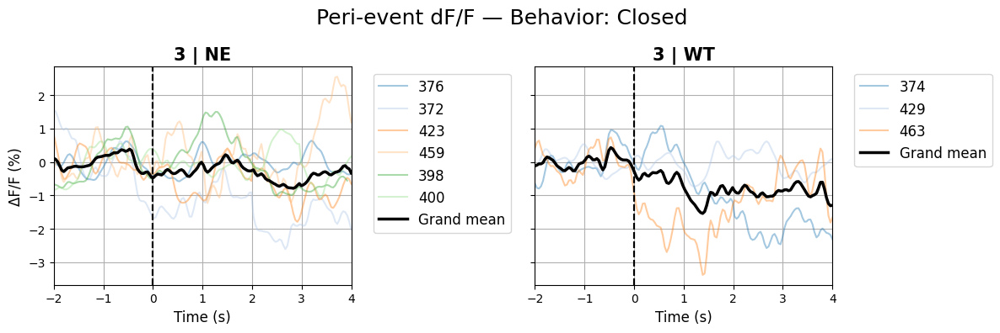

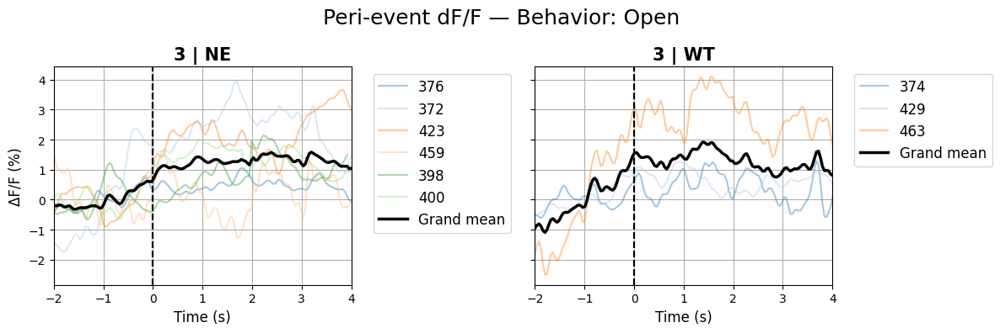

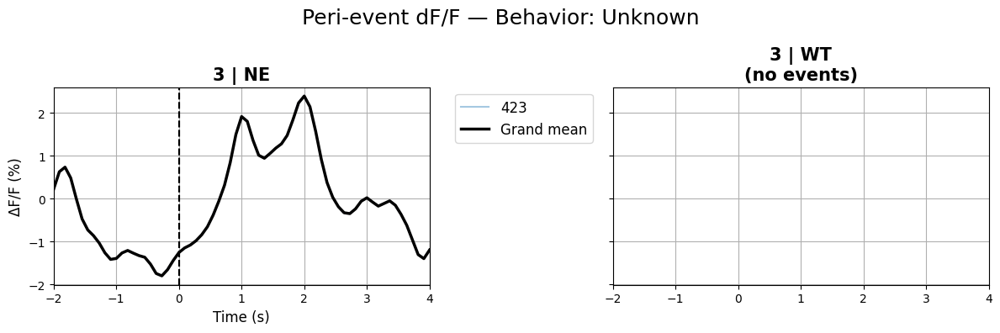

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0
post_s = 4.0

# ---------- COLLECT METADATA ----------
all_behaviors = set()
all_weeks = set()
all_genotypes = set()

for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]

    # ---------- no condition filter ----------
    behs = np.unique(trial_data["Behavior"].values)
    all_behaviors.update([b for b in behs if b != "Other"])

    all_weeks.add(fp_info.get("week"))
    all_genotypes.add(fp_info.get("genotype"))

all_behaviors = sorted(all_behaviors)
all_weeks = sorted(all_weeks)
all_genotypes = sorted(all_genotypes)

# =====================================================
#      MAIN LOOP: BEHAVIOR × GENOTYPE × WEEK
# =====================================================
for beh in all_behaviors:

    fig, axes = plt.subplots(
        len(all_weeks),
        len(all_genotypes),
        figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
        sharey=True,
        sharex=True
    )

    # ensure 2D axis array
    if len(all_weeks) == 1:
        axes = [axes]
    if len(all_genotypes) == 1:
        axes = [[axes[r]] for r in range(len(axes))]

    for r, week in enumerate(all_weeks):
        for c, genotype in enumerate(all_genotypes):
            
            ax = axes[r][c]

            mouse_segments = []
            mouse_ids = []
            mouse_lengths = []

            # ----------------------------------------
            #          Gather data for cell
            # ----------------------------------------
            for trial_key, trial_data in combined_trials.items():
                fp_info = fp_traces[trial_key]

                # ---------- no condition filter ----------
                if fp_info.get("week") != week:
                    continue
                if fp_info.get("genotype") != genotype:
                    continue

                df = trial_data.copy()
                time_vec = df["Time_video"].values
                signal_vec = df["gcamp_dF_F"].values
                behaviors = df["Behavior"].values

                if beh not in behaviors:
                    continue

                # ---------- EVENT STARTS ----------
                starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
                if len(starts) == 0:
                    continue

                fps = 1.0 / np.mean(np.diff(time_vec))
                pre_n = int(pre_s * fps)
                post_n = int(post_s * fps)

                event_segments = []

                for idx in starts:
                    start_idx = idx - pre_n
                    stop_idx = idx + post_n

                    seg_raw = signal_vec[max(0, start_idx):min(stop_idx, len(signal_vec))].copy()

                    # baseline
                    if len(seg_raw) > 0:
                        pre_end = min(pre_n, len(seg_raw))
                        seg_raw -= np.mean(seg_raw[:pre_end])

                    event_segments.append(seg_raw)

                if len(event_segments) == 0:
                    continue

                # pad event segments to same length within this mouse
                max_len_mouse = max(len(s) for s in event_segments)
                padded_events = []
                for s in event_segments:
                    padded = np.full(max_len_mouse, np.nan)
                    padded[:len(s)] = s
                    padded_events.append(padded)

                mouse_mean = np.nanmean(np.vstack(padded_events), axis=0)
                mouse_segments.append(mouse_mean)
                mouse_ids.append(fp_info.get("mouse_id", trial_key))
                mouse_lengths.append(len(mouse_mean))

            # =================================================
            #     NOTHING FOR THIS WEEK × GENOTYPE CELL
            # =================================================
            if len(mouse_segments) == 0:
                ax.set_title(f"{week} | {genotype}\n(no events)")
                ax.grid(True)
                continue

            # =================================================
            #     DETERMINE GLOBAL TARGET LENGTH FOR CELL
            # =================================================
            target_len = max(mouse_lengths)

            # pad all mice to this target_len
            padded_mouse_segments = []
            for seg in mouse_segments:
                padded = np.full(target_len, np.nan)
                padded[:len(seg)] = seg
                padded_mouse_segments.append(padded)

            padded_mouse_segments = np.vstack(padded_mouse_segments)

            # make time vector for this cell
            t_window = np.linspace(-pre_s, post_s, target_len)


            # =================================================
            #                 PLOTTING
            # =================================================
            lines = []
            for i, seg in enumerate(padded_mouse_segments):
                color = plt.cm.tab20(i % 20)
                line, = ax.plot(t_window, seg, color=color, alpha=0.4, lw=1.5)
                lines.append((line, mouse_ids[i]))  # store line and mouse_id for legend

            # mean trace
            grand_mean = np.nanmean(padded_mouse_segments, axis=0)
            ax.plot(t_window, grand_mean, color="black", lw=2.5, label="Grand mean")

            ax.axvline(0, color='k', linestyle='--')

            # Add legend for mice
            mouse_lines = [line for line, _ in lines]
            mouse_labels = [str(mid) for _, mid in lines]
            ax.legend(mouse_lines + [plt.Line2D([0], [0], color='black', lw=2.5)],
                    mouse_labels + ["Grand mean"],
                    bbox_to_anchor=(1.05, 1), loc="upper left")

            ax.axvline(0, color='k', linestyle='--')
            ax.set_title(f"{week} | {genotype}")
            ax.grid(True)

            if r == len(all_weeks) - 1:
                ax.set_xlabel("Time (s)")
            if c == 0:
                ax.set_ylabel("ΔF/F (%)")

    plt.suptitle(f"Peri-event dF/F — Behavior: {beh}", fontsize=18)
    plt.tight_layout()
    plt.show()   

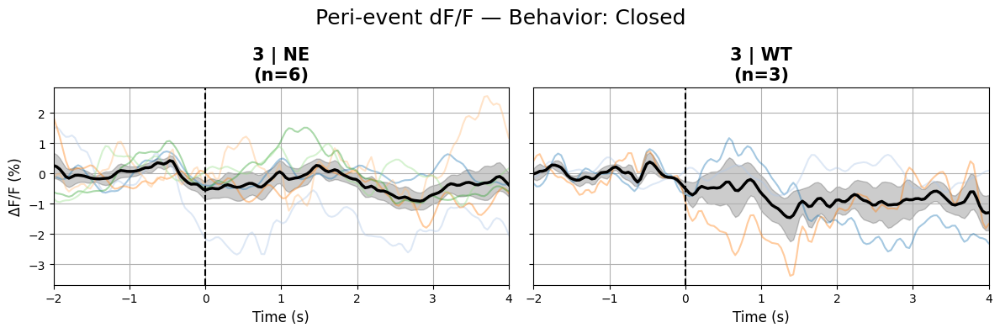

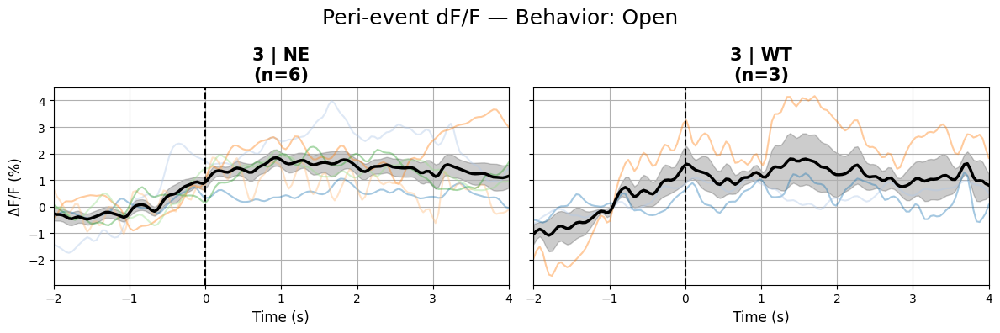

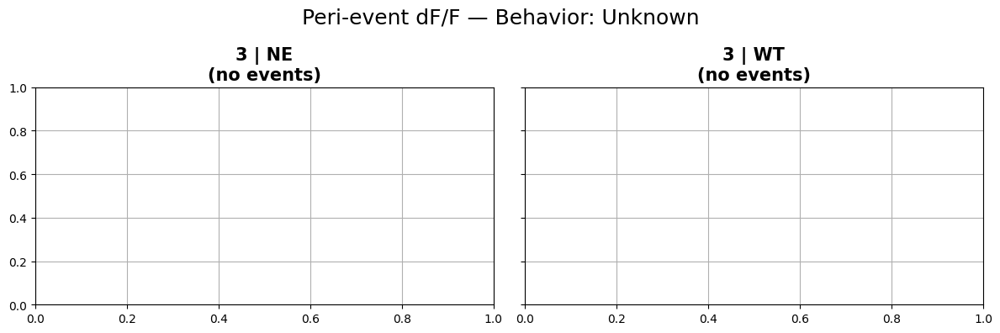

In [70]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- PARAMETERS ----------
pre_s = 2.0
post_s = 4.0

# ---------- GLOBAL FPS ----------
all_dts = []
for trial_key, trial_data in combined_trials.items():
    time_vec = trial_data["Time_video"].values
    all_dts.extend(np.diff(time_vec))

global_fps = 1 / np.median(all_dts)
pre_n = int(pre_s * global_fps)
post_n = int(post_s * global_fps)
expected_len = pre_n + post_n
t_window = np.linspace(-pre_s, post_s, expected_len)

# ---------- METADATA ----------
all_behaviors = set()
all_weeks = set()
all_genotypes = set()
for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces[trial_key]
    # if fp_info.get("condition") != "Novel":
    #     continue
    behs = np.unique(trial_data["Behavior"].values)
    all_behaviors.update([b for b in behs if b != "Other"])
    all_weeks.add(fp_info.get("week"))
    all_genotypes.add(fp_info.get("genotype"))

all_behaviors = sorted(all_behaviors)
all_weeks = sorted(all_weeks)
all_genotypes = sorted(all_genotypes)

# =====================================================
#      MAIN LOOP: BEHAVIOR × GENOTYPE × WEEK
# =====================================================
for beh in all_behaviors:
    fig, axes = plt.subplots(
        len(all_weeks),
        len(all_genotypes),
        figsize=(6 * len(all_genotypes), 4 * len(all_weeks)),
        sharey=True,
        sharex=True
    )

    # ensure 2D axes
    if len(all_weeks) == 1:
        axes = np.array([axes])
    if len(all_genotypes) == 1:
        axes = axes[:, np.newaxis]

    for r, week in enumerate(all_weeks):
        for c, genotype in enumerate(all_genotypes):
            ax = axes[r, c]

            mouse_segments = []
            mouse_ids = []

            # ---------- GATHER DATA ----------
            for trial_key, trial_data in combined_trials.items():
                fp_info = fp_traces[trial_key]
                # if fp_info.get("condition") != "Novel":
                #     continue
                if fp_info.get("week") != week:
                    continue
                if fp_info.get("genotype") != genotype:
                    continue

                df = trial_data.copy()
                time_vec = df["Time_video"].values
                #signal_vec = df["dFF"].values
                signal_vec = df["gcamp_dF_F"].values
                behaviors = df["Behavior"].values

                if beh not in behaviors:
                    continue

                # Event starts
                starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
                if len(starts) == 0:
                    continue

                segments = []
                for idx in starts:
                    if idx >= pre_n and (idx + post_n) < len(signal_vec):
                        seg = signal_vec[idx-pre_n:idx+post_n].copy()
                        if len(seg) != expected_len:
                            continue
                        seg -= np.mean(seg[:pre_n])
                        segments.append(seg)

                if len(segments) == 0:
                    continue

                mouse_mean = np.mean(np.column_stack(segments), axis=1)
                if len(mouse_mean) != expected_len:
                    continue

                mouse_segments.append(mouse_mean)
                mouse_ids.append(fp_info.get("mouse_id", trial_key))

            if len(mouse_segments) == 0:
                ax.set_title(f"{week} | {genotype}\n(no events)")
                ax.grid(True)
                continue

            mouse_segments = np.vstack(mouse_segments)

            # ---------- PLOTTING ----------
            for i, seg in enumerate(mouse_segments):
                ax.plot(t_window, seg, color=plt.cm.tab20(i % 20), alpha=0.4, lw=1.5)

            # mean trace
            grand_mean = np.mean(mouse_segments, axis=0)
            ax.plot(t_window, grand_mean, color="black", lw=2.5)

            # ---------- SEM SHADING ----------
            sem = np.std(mouse_segments, axis=0) / np.sqrt(mouse_segments.shape[0])
            ax.fill_between(t_window, grand_mean - sem, grand_mean + sem,
                            color="black", alpha=0.2)

            ax.axvline(0, color='k', linestyle='--')
            ax.set_title(f"{week} | {genotype}\n(n={mouse_segments.shape[0]})")
            ax.grid(True)

            if r == len(all_weeks) - 1:
                ax.set_xlabel("Time (s)")
            if c == 0:
                ax.set_ylabel("ΔF/F (%)")

    plt.suptitle(f"Peri-event dF/F — Behavior: {beh}", fontsize=18)
    plt.tight_layout()
    plt.show()

Global FPS: 25.000000000022737
Summary shape: (18, 6)
  mouse_id genotype  week behavior  pre_auc_dFF  post_auc_dFF
0      376       NE     3   Closed    -0.460242     -0.712123
1      376       NE     3     Open     0.640998      1.577797
2      372       NE     3   Closed     2.757336     -0.535772
3      372       NE     3     Open     0.792019      5.729540
4      374       WT     3   Closed     3.048534      2.590691

Stats for behavior 'Closed':
  genotype  week    t_stat   p_value  cohens_d  p_corrected  significant
0       NE     3  0.742004  0.491448 -0.302922     0.982895        False
1       WT     3  1.235109  0.342198 -0.713091     0.684396        False


/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_5172/967488399.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  pre_aucs.append(np.trapz(pre_seg, dx=1/global_fps))
/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_5172/967488399.py:66: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  post_aucs.append(np.trapz(post_seg, dx=1/global_fps))
/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_5172/967488399.py:113: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (genotype, week), grp in sub.groupby(["genotype", "week"]):
/Users/annastuckert/anaconda3/envs/napari/lib/python3.13/site-packages/s

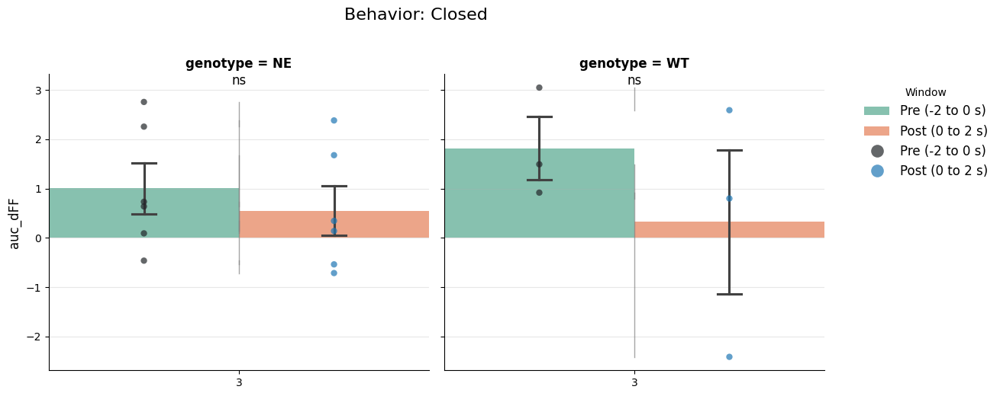

/var/folders/3y/jmv30wb16ss901m1yrdysjh80000gq/T/ipykernel_5172/967488399.py:113: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (genotype, week), grp in sub.groupby(["genotype", "week"]):
/Users/annastuckert/anaconda3/envs/napari/lib/python3.13/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#1f77b4'` for the same effect.

  func(*plot_args, **plot_kwargs)
/Users/annastuckert/anaconda3/envs/napari/lib/python3.13/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#1f77b4'` for the same effect.

  func(*plot_args, **plot_kwargs)



Stats for behavior 'Open':
  genotype  week    t_stat   p_value  cohens_d  p_corrected  significant
0       NE     3 -5.322591  0.003134  2.172939     0.006267         True
1       WT     3 -1.883751  0.200285  1.087584     0.400571        False


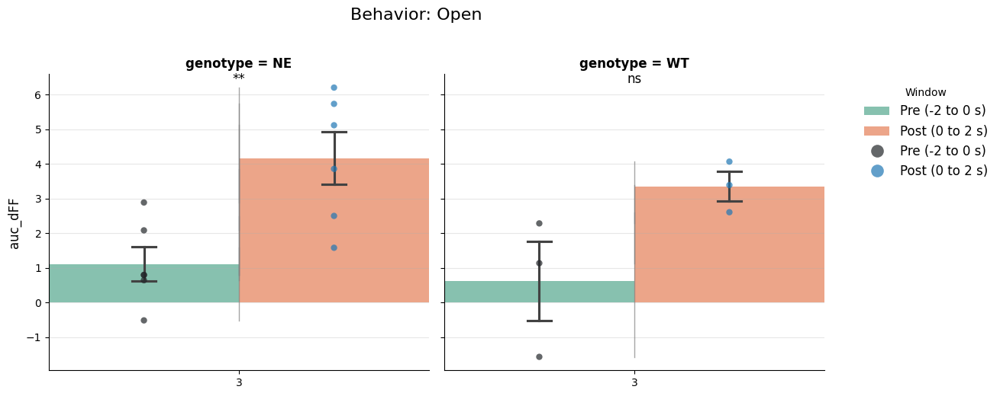

In [78]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, ttest_1samp
from statsmodels.stats.multitest import multipletests

# --------------------------
# PARAMETERS
# --------------------------
pre_window_s = (-2, 0)
post_window_s = (0, 2)

# --------------------------
# COMPUTE GLOBAL FPS
# --------------------------
all_dts = []
for trial_key, trial_data in combined_trials.items():
    if "Time_video" not in trial_data.columns:
        continue
    all_dts.extend(np.diff(trial_data["Time_video"].values))

global_fps = 1 / np.median(all_dts)
print("Global FPS:", global_fps)

# --------------------------
# CREATE SUMMARY TABLE (MOUSE MEAN AUC)
# --------------------------
summary_prepost_auc = []

for trial_key, trial_data in combined_trials.items():
    fp_info = fp_traces.get(trial_key, {})
    week = fp_info.get("week")
    genotype = fp_info.get("genotype")
    mouse_id = fp_info.get("mouse_id", trial_key)

    if "gcamp_dF_F" not in trial_data.columns or "Behavior" not in trial_data.columns:
        continue

    signal = trial_data["gcamp_dF_F"].values
    behaviors = trial_data["Behavior"].values

    unique_behaviors = [b for b in np.unique(behaviors) if b != "Other"]

    for beh in unique_behaviors:
        starts = np.where(np.diff(np.r_[0, (behaviors == beh).astype(int)]) == 1)[0]
        if len(starts) == 0:
            continue

        pre_aucs = []
        post_aucs = []

        for idx in starts:
            pre_start = idx + int(pre_window_s[0]*global_fps)
            pre_end   = idx + int(pre_window_s[1]*global_fps)
            post_start = idx + int(post_window_s[0]*global_fps)
            post_end   = idx + int(post_window_s[1]*global_fps)

            if pre_start < 0 or post_end >= len(signal):
                continue

            pre_seg = signal[pre_start:pre_end]
            post_seg = signal[post_start:post_end]

            pre_aucs.append(np.trapz(pre_seg, dx=1/global_fps))
            post_aucs.append(np.trapz(post_seg, dx=1/global_fps))

        if len(pre_aucs) == 0 or len(post_aucs) == 0:
            continue

        summary_prepost_auc.append({
            "mouse_id": mouse_id,
            "genotype": genotype,
            "week": week,
            "behavior": beh,
            "pre_auc_dFF": np.mean(pre_aucs),
            "post_auc_dFF": np.mean(post_aucs)
        })

prepost_auc_mouse_df = pd.DataFrame(summary_prepost_auc)
print("Summary shape:", prepost_auc_mouse_df.shape)
print(prepost_auc_mouse_df.head())

# --------------------------
# PLOTTING + STATS FUNCTION
# --------------------------
def plot_mouse_mean_prepost_auc(df, genotype_filter=None):
    data = df.copy()
    
    if genotype_filter is not None:
        data = data[data["genotype"] == genotype_filter]

    data = data[data["behavior"] != "Other"]
    if data.empty:
        print("[WARN] No data to plot")
        return

    week_order = sorted(data["week"].unique())
    data["week"] = pd.Categorical(data["week"], categories=week_order, ordered=True)

    genotype_order = sorted(data["genotype"].unique())
    data["genotype"] = pd.Categorical(data["genotype"], categories=genotype_order, ordered=True)

    behaviors = sorted(data["behavior"].unique())

    for beh in behaviors:
        sub = data[data["behavior"] == beh]

        # --------------------------
        # COMPUTE STATS (paired t-test if possible, otherwise skip)
        # --------------------------
        stats_results = []
        for (genotype, week), grp in sub.groupby(["genotype", "week"]):
            if len(grp) >= 2:
                stat, p = ttest_rel(grp["pre_auc_dFF"], grp["post_auc_dFF"], nan_policy="omit")
                diff = grp["post_auc_dFF"] - grp["pre_auc_dFF"]
                cohens_d = diff.mean() / diff.std(ddof=1)
            else:
                stat, p, cohens_d = np.nan, np.nan, np.nan

            stats_results.append({
                "genotype": genotype,
                "week": week,
                "t_stat": stat,
                "p_value": p,
                "cohens_d": cohens_d
            })

        stats_df = pd.DataFrame(stats_results)
        # Safe FDR / Bonferroni correction
        if not stats_df.empty and stats_df["p_value"].notna().any():
            reject, pvals_corrected, _, _ = multipletests(
                stats_df["p_value"].fillna(1), method="bonferroni"
            )
            stats_df["p_corrected"] = pvals_corrected
            stats_df["significant"] = reject
        else:
            stats_df["p_corrected"] = np.nan
            stats_df["significant"] = False

        print(f"\nStats for behavior '{beh}':")
        print(stats_df)

        # --------------------------
        # LONG FORMAT FOR PLOTTING
        # --------------------------
        long_sub = sub.melt(
            id_vars=["mouse_id", "genotype", "week"],
            value_vars=["pre_auc_dFF", "post_auc_dFF"],
            var_name="window",
            value_name="auc_dFF"
        )
        long_sub["window"] = long_sub["window"].map({
            "pre_auc_dFF": "Pre (-2 to 0 s)",
            "post_auc_dFF": "Post (0 to 2 s)"
        })

        # # --------------------------
        # # FACETING
        # # --------------------------
        # if long_sub["genotype"].nunique() == 1:
        #     g = sns.FacetGrid(long_sub, height=5, aspect=1.1, sharey=True)
        # else:
        #     g = sns.FacetGrid(long_sub, col="genotype", col_order=genotype_order, height=5, aspect=1.1, sharey=True)

        # # Bars + error
        # g.map_dataframe(
        #     sns.barplot,
        #     x="week",
        #     y="auc_dFF",
        #     hue="window",
        #     palette="Set2",
        #     errorbar="se",
        #     alpha=0.85,
        #     capsize=0.1
        # )

        # # Stripplot
        # g.map_dataframe(
        #     sns.stripplot,
        #     x="week",
        #     y="auc_dFF",
        #     hue="window",
        #     dodge=True,
        #     size=6,
        #     jitter=False,
        #     alpha=0.7
        # )

        # --------------------------
        # FACETING
        # --------------------------
        if long_sub["genotype"].nunique() == 1:
            g = sns.FacetGrid(long_sub, height=5, aspect=1.1, sharey=True)
        else:
            g = sns.FacetGrid(long_sub, col="genotype", col_order=genotype_order, height=5, aspect=1.1, sharey=True)

        # Bars + error
        g.map_dataframe(
            sns.barplot,
            x="week",
            y="auc_dFF",
            hue="window",
            palette="Set2",
            errorbar="se",
            alpha=0.85,
            capsize=0.1
        )

        # Stripplot
        g.map_dataframe(
            sns.stripplot,
            x="week",
            y="auc_dFF",
            hue="window",
            dodge=True,
            size=6,
            jitter=False,
            alpha=0.7
        )

        # Add behavior title at top of figure
        g.fig.suptitle(f"Behavior: {beh}", fontsize=16, y=1.03)
                # --------------------------
        # CONNECT PRE → POST PER MOUSE
        # --------------------------
        for ax in g.axes.flatten():
            facet_genotype = long_sub["genotype"].iloc[0] if long_sub["genotype"].nunique() == 1 else ax.get_title().replace("genotype = ", "")
            sub_ax = long_sub if long_sub["genotype"].nunique() == 1 else long_sub[long_sub["genotype"] == facet_genotype]

            for i, week in enumerate(week_order):
                week_data = sub_ax[sub_ax["week"] == week]
                for mouse_id, grp_mouse in week_data.groupby("mouse_id"):
                    points = grp_mouse.sort_values("window")
                    if len(points) == 2:
                        ax.plot([i, i], points["auc_dFF"].values, color="gray", alpha=0.7, linewidth=1)

        # --------------------------
        # SIGNIFICANCE ANNOTATION (SAFE)
        # --------------------------
        if not stats_df.empty and "genotype" in stats_df.columns:
            for ax in g.axes.flatten():
                facet_genotype = long_sub["genotype"].iloc[0] if long_sub["genotype"].nunique() == 1 else ax.get_title().replace("genotype = ", "")
                for i, week in enumerate(week_order):
                    row = stats_df[(stats_df["genotype"] == facet_genotype) & (stats_df["week"] == week)]
                    if row.empty:
                        continue
                    p = row["p_corrected"].values[0]
                    if p < 0.001: text = "***"
                    elif p < 0.01: text = "**"
                    elif p < 0.05: text = "*"
                    else: text = "ns"
                    y_max = long_sub["auc_dFF"].max()
                    ax.text(i, y_max*1.02, text, ha="center", fontsize=12)

        # --------------------------
        # CLEANUP & SHOW
        # --------------------------
        for ax in g.axes.flatten():
            if ax.legend_:
                ax.legend_.remove()
            ax.set_xlabel("")
            ax.grid(axis="y", alpha=0.3)
        handles, labels = ax.get_legend_handles_labels()
        g.fig.legend(handles, labels, title="Window", bbox_to_anchor=(1.02, 0.85), loc="upper left", frameon=False)

        plt.tight_layout()
        plt.show()


# --------------------------
# RUN EXAMPLE
# --------------------------
plot_mouse_mean_prepost_auc(prepost_auc_mouse_df, genotype_filter=None)